In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class PSO:
    def __init__(self, objective_function, bounds, num_particles, max_iterations, w=0.65, c1=1.5, c2=1.5, mutation_rate=0.01, gaussian_mutation_strength=0.1, w_random_range=None):
        self.objective_function = objective_function
        self.bounds = bounds  # [(min, max), (min, max), ...]
        self.num_particles = num_particles
        self.max_iterations = max_iterations
        self.w = w  # Inertia weight (fixed if w_random_range is None)
        self.c1 = c1  # Cognitive component (personal best)
        self.c2 = c2  # Social component (global best)
        self.mutation_rate = mutation_rate # Mutation rate for PSO-m
        self.gaussian_mutation_strength = gaussian_mutation_strength # Factor to determine std dev for Gaussian mutation
        self.w_random_range = w_random_range # (w_min, w_max) for random inertia weight (PSO-RIW)

        self.dimension = len(bounds)

        # Prepare bounds for vectorized operations
        bounds_array = np.array(bounds)
        self.lower_bounds = bounds_array[:, 0]
        self.upper_bounds = bounds_array[:, 1]

        # Initialize particles positions (vectorized)
        self.positions = np.random.uniform(self.lower_bounds, self.upper_bounds, size=(self.num_particles, self.dimension))
        # Initialize velocities
        self.velocities = np.random.uniform(low=-1, high=1, size=(self.num_particles, self.dimension))

        # Initialize personal bests
        self.personal_best_positions = np.copy(self.positions)
        self.personal_best_scores = np.array([self.objective_function(p) for p in self.positions])

        # Initialize global best
        self.global_best_score = np.min(self.personal_best_scores)
        self.global_best_position = self.personal_best_positions[np.argmin(self.personal_best_scores)]

    def optimize(self):
        history = []

        for iteration in range(self.max_iterations):
            # Update inertia weight if random range is provided (for PSO-RIW)
            if self.w_random_range is not None:
                self.w = np.random.uniform(self.w_random_range[0], self.w_random_range[1])

            # Generate random coefficients for all particles (vectorized)
            r1 = np.random.rand(self.num_particles, self.dimension)
            r2 = np.random.rand(self.num_particles, self.dimension)

            # Update velocity (vectorized)
            cognitive_velocity = self.c1 * r1 * (self.personal_best_positions - self.positions)
            social_velocity = self.c2 * r2 * (self.global_best_position - self.positions)
            self.velocities = self.w * self.velocities + cognitive_velocity + social_velocity

            # Update position (vectorized)
            self.positions = self.positions + self.velocities

            # --- Gaussian Mutation step (for PSO-m variant) ---
            if self.mutation_rate > 0:
                mutation_mask = np.random.rand(self.num_particles) < self.mutation_rate
                if np.any(mutation_mask):
                    num_mutated = np.sum(mutation_mask)

                    # Calculate standard deviations for mutation based on bounds range
                    ranges = self.upper_bounds - self.lower_bounds
                    # std_devs will be a vector if bounds are different per dimension
                    std_devs = ranges * self.gaussian_mutation_strength

                    # Generate Gaussian noise for only the mutated particles
                    noise = np.random.normal(0, std_devs, size=(num_mutated, self.dimension))

                    # Apply noise to the positions of mutated particles
                    self.positions[mutation_mask] = self.positions[mutation_mask] + noise

                    # Clip mutated positions to bounds
                    self.positions[mutation_mask] = np.clip(self.positions[mutation_mask], self.lower_bounds, self.upper_bounds)

            # Apply bounds (vectorized) - This is still needed for particles not affected by mutation
            self.positions = np.clip(self.positions, self.lower_bounds, self.upper_bounds)

            # Evaluate current scores for all particles
            current_scores = np.array([self.objective_function(p) for p in self.positions])

            # Update personal bests (vectorized using boolean indexing)
            improved_indices = current_scores < self.personal_best_scores
            self.personal_best_scores[improved_indices] = current_scores[improved_indices]
            self.personal_best_positions[improved_indices] = self.positions[improved_indices]

            # Update global best
            min_current_score_index = np.argmin(current_scores)
            min_current_score = current_scores[min_current_score_index]

            if min_current_score < self.global_best_score:
                self.global_best_score = min_current_score
                self.global_best_position = self.positions[min_current_score_index]

            history.append(self.global_best_score)

        return self.global_best_position, self.global_best_score, history

Let's define a simple objective function (e.g., the Sphere function) and use the PSO algorithm to find its minimum.

In [ ]:
# Define the objective function (e.g., Sphere function)
def objective_function(x):
    return np.sum(x**2)

# Define the bounds for each dimension
bounds = [(-5, 5), (-5, 5)] # For a 2D problem

# PSO parameters
num_particles = 30
max_iterations = 100

# --- PSO-m (Gaussian Mutation) ---
mutation_rate = 0.05 # 5% chance for a particle to be mutated
gaussian_mutation_strength = 0.1 # Standard deviation will be 10% of the bounds range
pso_m = PSO(objective_function, bounds, num_particles, max_iterations, mutation_rate=mutation_rate, gaussian_mutation_strength=gaussian_mutation_strength)
best_position_m, best_score_m, history_m = pso_m.optimize()
print(f"PSO-m (Gaussian Mutation) Best position found: {best_position_m}")
print(f"PSO-m (Gaussian Mutation) Best score found: {best_score_m}")

# --- Original PSO ---
pso_original = PSO(objective_function, bounds, num_particles, max_iterations, mutation_rate=0) # mutation_rate=0 disables mutation
best_position_orig, best_score_orig, history_orig = pso_original.optimize()
print(f"Original PSO Best position found: {best_position_orig}")
print(f"Original PSO Best score found: {best_score_orig}")

# --- PSO-RIW (Random Inertia Weight) ---
w_riw_min = 0.4
w_riw_max = 0.9
pso_riw = PSO(objective_function, bounds, num_particles, max_iterations, w_random_range=(w_riw_min, w_riw_max), mutation_rate=0) # mutation_rate=0 to isolate RIW effect
best_position_riw, best_score_riw, history_riw = pso_riw.optimize()
print(f"PSO-RIW (Random Inertia Weight) Best position found: {best_position_riw}")
print(f"PSO-RIW (Random Inertia Weight) Best score found: {best_score_riw}")

PSO-m (Gaussian Mutation) Best position found: [ 4.10056281e-05 -1.01322846e-04]
PSO-m (Gaussian Mutation) Best score found: 1.194778069065284e-08
Original PSO Best position found: [-4.03524195e-09 -7.92360287e-09]
Original PSO Best score found: 7.906666009847887e-17
PSO-RIW (Random Inertia Weight) Best position found: [-5.24462736e-09  2.89426539e-09]
PSO-RIW (Random Inertia Weight) Best score found: 3.588288829521741e-17


We can also visualize the convergence of the PSO algorithm by plotting the global best score over iterations.

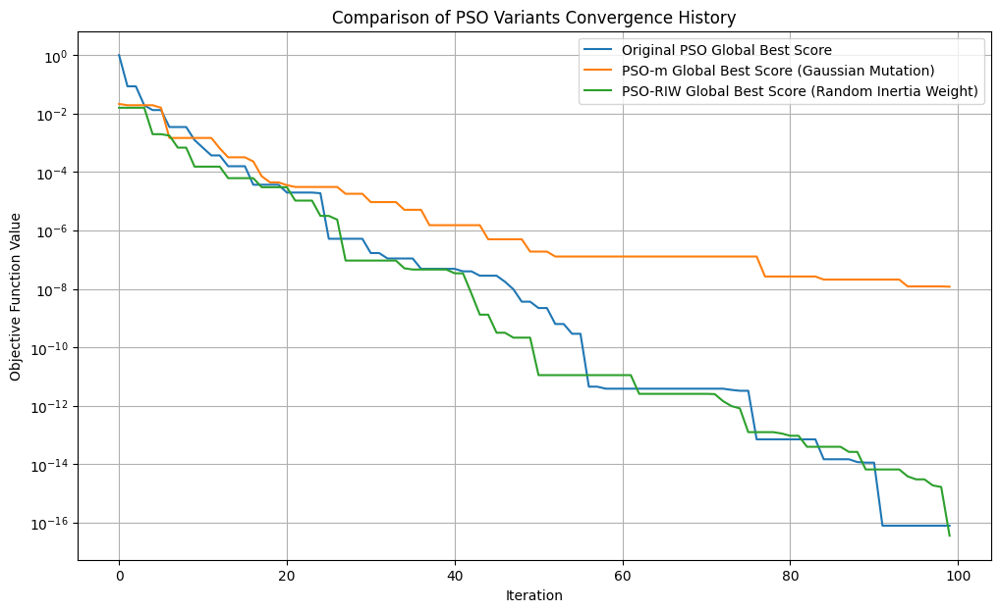

In [ ]:
# Plot the convergence history for all PSO variants
plt.figure(figsize=(12, 7))
plt.plot(history_orig, label='Original PSO Global Best Score')
plt.plot(history_m, label='PSO-m Global Best Score (Gaussian Mutation)')
plt.plot(history_riw, label='PSO-RIW Global Best Score (Random Inertia Weight)')
plt.title('Comparison of PSO Variants Convergence History')
plt.xlabel('Iteration')
plt.ylabel('Objective Function Value')
plt.yscale('log') # Use log scale for better visualization of convergence
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
class HPPSO_Modified:
    def __init__(self, obj_func, n_pop=30, dimensions=10, max_it=100,
                 bounds=(-100, 100), c1=2.0, c2=2.0, eta=0.01,
                 socialism_threshold=0.5, lam=0.4, stagnation_threshold=10):
        self.obj_func = obj_func
        self.n_pop = n_pop
        self.dim = dimensions
        self.max_it = max_it

        # Handle both scalar and vector bounds
        lb_in, ub_in = bounds
        self.lb = lb_in * np.ones(dimensions) if np.isscalar(lb_in) else np.asarray(lb_in)
        self.ub = ub_in * np.ones(dimensions) if np.isscalar(ub_in) else np.asarray(ub_in)
        self.range = self.ub - self.lb

        self.c1, self.c2 = c1, c2
        self.eta = eta
        self.socialism_threshold = socialism_threshold
        self.lam = lam
        self.v_limit = 0.2 * self.range

        # Initialize particles within bounds
        self.X = np.random.uniform(self.lb, self.ub, (n_pop, dimensions))
        self.V = np.zeros((n_pop, dimensions))
        self.fitness = np.array([obj_func(x) for x in self.X])

        self.P = np.copy(self.X)
        self.p_best_fitness = np.copy(self.fitness)
        idx_best = np.argmin(self.p_best_fitness)
        self.g_best = np.copy(self.P[idx_best])
        self.g_best_fitness = self.p_best_fitness[idx_best]
        # Changed personality to be (n_pop, 4) - scalar per trait per particle
        self.personality = np.random.rand(n_pop, 4)

        # Stagnation detection for personality reinitialization
        self.stagnation_counters = np.zeros(n_pop)
        self.stagnation_threshold = stagnation_threshold

    def optimize(self):
        history = []
        for t in range(self.max_it):
            for i in range(self.n_pop):
                # Personality traits are now scalars for each particle
                curio_scalar = self.personality[i, 0]
                conf_scalar = self.personality[i, 1]
                agg_scalar = self.personality[i, 2]
                soc_scalar = self.personality[i, 3]

                r1, r2 = np.random.rand(self.dim), np.random.rand(self.dim)
                # Use scalar personality traits, broadcasting will handle multiplication with vectors
                self.V[i] = ((0.4 + 0.5 * agg_scalar) * self.V[i] +
                             (1 - conf_scalar) * self.c1 * r1 * (self.P[i] - self.X[i]) +
                             conf_scalar * self.c2 * r2 * (self.g_best - self.X[i]))

                # Use scalar sociality for the condition
                if soc_scalar > self.socialism_threshold:
                    j = np.random.choice([idx for idx in range(self.n_pop) if idx != i])
                    if self.fitness[j] > self.fitness[i]:
                        self.V[i] += self.lam * (self.P[j] - self.X[i])

                self.V[i] = np.clip(self.V[i], -self.v_limit, self.v_limit)
                new_x = self.X[i] + self.V[i]

                # Use scalar curiosity for mutation, broadcasting will handle
                mutation_mask = np.random.rand(self.dim) < 0.5*curio_scalar
                if np.any(mutation_mask):
                    new_x[mutation_mask] += np.random.normal(0, self.eta * self.range[mutation_mask], np.sum(mutation_mask))

                # Vectorized boundary handling
                for d in range(self.dim):
                    if new_x[d] < self.lb[d] or new_x[d] > self.ub[d]:
                        new_x[d] = np.clip(new_x[d], self.lb[d], self.ub[d])
                        self.V[i, d] *= -1

                new_f = self.obj_func(new_x)
                old_p_best_fitness = self.p_best_fitness[i] # Store for stagnation check

                if new_f < self.fitness[i]:
                    self.X[i], self.fitness[i] = new_x, new_f
                if self.fitness[i] < self.p_best_fitness[i]:
                    self.P[i], self.p_best_fitness[i] = np.copy(self.X[i]), self.fitness[i]
                    if self.p_best_fitness[i] < self.g_best_fitness:
                        self.g_best, self.g_best_fitness = np.copy(self.P[i]), self.p_best_fitness[i]

                # Stagnation check and personality reinitialization
                if self.p_best_fitness[i] < old_p_best_fitness:
                    self.stagnation_counters[i] = 0
                else:
                    self.stagnation_counters[i] += 1

                if self.stagnation_counters[i] >= self.stagnation_threshold:
                    self.personality[i] = np.random.rand(4) # Reinitialize personality
                    self.stagnation_counters[i] = 0 # Reset counter

            history.append(self.g_best_fitness)
        return self.g_best_fitness, history

In [ ]:
!pip install minionpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 49.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
from minionpy import cec
import random
import matplotlib.pyplot as plt

def get_cec2011_info(func_num):
    suite = cec.CEC2011Functions(function_number=func_num)
    target_dim = suite.dimension

    # Metadata is a list/tuple of tuples: (dimension, lb, ub)
    # Problem 1 is at index 1 in the metadata structure found in minionpy
    meta = cec.CEC2011_METADATA[func_num]
    lb = meta[1]
    ub = meta[2]

    def wrapper(x):
        x_arr = np.asarray(x).reshape(1, -1)
        res = suite.evaluate(x_arr)
        return float(res[0])

    return wrapper, target_dim, (lb, ub)

cec2011_problems = []
for i in range(1, 23):
    try:
        func, dim, bnds = get_cec2011_info(i)
        cec2011_problems.append({"name": f"T{i}", "function": func, "dimension": dim, "bounds": bnds})
    except Exception as e:
        print(f"Could not load T{i}: {e}")

# Fix the bounds of problem T3 to be [0.6, 0.9]
for problem in cec2011_problems:
    if problem["name"] == "T3":
        problem["bounds"] = (0.6, 0.9)
        print(f"Modified bounds for {problem['name']}: {problem['bounds']}")
        break

print("\nAvailable CEC2011 problems and their (possibly modified) details:")
for problem in cec2011_problems:
    print(f"{problem['name']} | Dim: {problem['dimension']} ")

Modified bounds for T3: (0.6, 0.9)

Available CEC2011 problems and their (possibly modified) details:
T1 | Dim: 6 
T2 | Dim: 30 
T3 | Dim: 1 
T4 | Dim: 1 
T5 | Dim: 30 
T6 | Dim: 30 
T7 | Dim: 20 
T8 | Dim: 7 
T9 | Dim: 126 
T10 | Dim: 12 
T11 | Dim: 120 
T12 | Dim: 240 
T13 | Dim: 6 
T14 | Dim: 13 
T15 | Dim: 15 
T16 | Dim: 40 
T17 | Dim: 140 
T18 | Dim: 96 
T19 | Dim: 96 
T20 | Dim: 96 
T21 | Dim: 26 
T22 | Dim: 22 


In [ ]:
import os
import json
import random
import numpy as np
import matplotlib.pyplot as plt

# ===============================
# GA-MPC Algorithm (adapted for CEC functions)
# ===============================
def run_ga_mpc_cec(obj_func, dim, lower_bound, upper_bound,
                   ps=90, max_gen=1000, cr=1.0, p=0.1, mu=0.7, sigma=0.1, archive_ratio=0.5, tc_options=[2, 3]):

    # Internal fitness function reference
    current_fitness_func = obj_func

    # Internal parameters (using arguments)
    PS_local = ps
    D_local = dim
    MAX_GEN_local = max_gen
    CR_local = cr
    P_local = p
    MU_local = mu
    SIGMA_local = sigma
    ARCHIVE_RATIO_local = archive_ratio
    TC_OPTIONS_local = tc_options

    LOWER_BOUND_local = np.atleast_1d(lower_bound)
    UPPER_BOUND_local = np.atleast_1d(upper_bound)

    def initialize_population_local():
        return np.random.uniform(LOWER_BOUND_local, UPPER_BOUND_local, (PS_local, D_local))

    def tournament_selection_local(pop, fitness_vals, k):
        selected = random.sample(range(len(pop)), k)
        best = min(selected, key=lambda i: fitness_vals[i])
        return pop[best]

    def mpc_crossover_local(x1, x2, x3):
        parents = sorted([x1, x2, x3], key=lambda x: current_fitness_func(x))
        x1, x2, x3 = parents

        beta = np.random.normal(MU_local, SIGMA_local)

        o1 = x1 + beta * (x2 - x3)
        o2 = x2 + beta * (x3 - x1)
        o3 = x3 + beta * (x1 - x2)

        return [o1, o2, o3]

    def randomized_operator_local(offspring, archive):
        if len(archive) == 0:
            return offspring # No archive to sample from

        m = len(archive)
        num_offspring = offspring.shape[0]
        num_dimensions = offspring.shape[1]

        # Create a boolean mask where mutation should occur (element-wise)
        mutation_mask = np.random.rand(num_offspring, num_dimensions) < P_local

        # Get the row and column indices where mutation is True
        mutated_rows, mutated_cols = np.where(mutation_mask)

        if len(mutated_rows) > 0:
            # For each mutation point, select a random index from the archive
            random_archive_indices = np.random.randint(0, m, size=len(mutated_rows))

            # Assign values from the randomly selected archive members at the corresponding dimensions
            offspring[mutated_rows, mutated_cols] = archive[random_archive_indices, mutated_cols]

        return offspring

    def perturb_exact_duplicates_vectorized(pop, lb, ub, dim_val):
        # Identifies and perturbs exact duplicate solutions in a vectorized manner.
        # This aims to restore a diversity-maintaining operator similar to the original remove_duplicates_local,
        # but in a vectorized and more robust way for exact duplicates, avoiding performance issues with np.allclose.

        # Find unique rows and their inverse indices (which original row corresponds to which unique row)
        # unique_rows: the actual unique rows
        # inv: an array such that unique_rows[inv] == pop
        _, inv = np.unique(pop, axis=0, return_inverse=True)

        # Count occurrences of each unique row
        counts = np.bincount(inv)

        # Identify the indices in `inv` that correspond to duplicate unique rows (i.e., counts > 1)
        duplicated_unique_indices = np.where(counts > 1)[0]

        # Create a mask for individuals in `pop` that are duplicates
        duplicate_mask_in_pop = np.isin(inv, duplicated_unique_indices)

        if np.any(duplicate_mask_in_pop):
            num_to_perturb = np.sum(duplicate_mask_in_pop)

            # Generate random scaling factor 'u' for each duplicate to be perturbed
            u_values = np.random.rand(num_to_perturb, 1)

            # Generate Gaussian noise scaled by u_values
            perturbation = np.random.normal(0.5 * u_values, 0.25 * u_values, size=(num_to_perturb, dim_val))

            # Apply perturbation only to the duplicate individuals in the population
            pop[duplicate_mask_in_pop] += perturbation

            # Ensure perturbed individuals stay within bounds
            pop[duplicate_mask_in_pop] = np.clip(pop[duplicate_mask_in_pop], lb, ub)

        return pop

    population = initialize_population_local()
    history = []
    global_best_fitness_so_far = float('inf') # Initialize global best fitness

    for gen in range(MAX_GEN_local):
        fitness_vals = np.array([current_fitness_func(ind) for ind in population])

        m = int(ARCHIVE_RATIO_local * PS_local)
        sorted_idx = np.argsort(fitness_vals)
        archive = population[sorted_idx[:m]]

        selection_pool = []
        for _ in range(PS_local):
            tc = random.choice(TC_OPTIONS_local)
            selection_pool.append(tournament_selection_local(population, fitness_vals, tc))
        selection_pool = np.array(selection_pool)

        offspring = []
        for i in range(0, PS_local - 2, 3):
            if random.random() < CR_local:
                x1, x2, x3 = selection_pool[i], selection_pool[i+1], selection_pool[i+2]
                # Ensure parents are distinct for meaningful crossover, if they are the same, pick another from the pool
                if np.array_equal(x1, x2) or np.array_equal(x2, x3) or np.array_equal(x1, x3):
                    # Re-select a parent if there are duplicates among the chosen three
                    # This might still lead to duplicates if pool is small or diversity is low, but reduces immediate issues.
                    x3 = selection_pool[random.randint(0, PS_local - 1)]
                    x2 = selection_pool[random.randint(0, PS_local - 1)]
                    x1 = selection_pool[random.randint(0, PS_local - 1)]

                children = mpc_crossover_local(x1, x2, x3)
                offspring.extend(children)

        if len(offspring) > 0:
            offspring = np.array(offspring)
            offspring = randomized_operator_local(offspring, archive)
            # Explicitly clip offspring to bounds after mutation
            offspring = np.clip(offspring, LOWER_BOUND_local, UPPER_BOUND_local)
            combined = np.vstack((offspring, archive))
        else:
            # If no offspring generated, rely only on the archive for next generation
            combined = archive

        combined_fitness = np.array([current_fitness_func(ind) for ind in combined])

        if len(combined_fitness) < PS_local:
            best_idx = np.argsort(combined_fitness)
            population = combined[best_idx[:PS_local]]
            if len(population) < PS_local:
                num_to_add = PS_local - len(population)
                # Add new random individuals, also clipped to bounds
                population = np.vstack((population, np.random.uniform(LOWER_BOUND_local, UPPER_BOUND_local, (num_to_add, D_local))))
        else:
            best_idx = np.argsort(combined_fitness)[:PS_local]
            population = combined[best_idx]

        # Ensure population is always within bounds (redundant if previous clipping is perfect, but good for safety)
        population = np.clip(population, LOWER_BOUND_local, UPPER_BOUND_local)

        # Apply vectorized duplicate perturbation after the population is formed and clipped
        population = perturb_exact_duplicates_vectorized(population, LOWER_BOUND_local, UPPER_BOUND_local, D_local)

        best_val_current_pop = np.min([current_fitness_func(ind) for ind in population])
        if best_val_current_pop < global_best_fitness_so_far:
            global_best_fitness_so_far = best_val_current_pop
        history.append(global_best_fitness_so_far)
        # print(f"Gen {gen}: Best = {best_val:.5f}")

    final_best_solution = population[np.argmin([current_fitness_func(ind) for ind in population])]
    final_best_fitness = current_fitness_func(final_best_solution)

    return final_best_solution, final_best_fitness, history

# ===============================
# Run GA-MPC on selected CEC2011 functions
# ===============================
if __name__ == "__main__":
    # Example: Run on T1
    print("\nRunning GA-MPC with CEC2011 T1 function...")
    t1_problem = next(p for p in cec2011_problems if p["name"] == "T1")
    best_pos_t1, best_score_t1, history_t1 = run_ga_mpc_cec(
        obj_func=t1_problem["function"],
        dim=t1_problem["dimension"],
        lower_bound=t1_problem["bounds"][0],
        upper_bound=t1_problem["bounds"][1]
    )
    print(f"\nGA-MPC (CEC T1) Best position found: {best_pos_t1}")
    print(f"GA-MPC (CEC T1) Best score found: {best_score_t1}")

    # Example: Run on T3 (with modified bounds)
    print("\nRunning GA-MPC with CEC2011 T3 function (modified bounds)...")
    t3_problem = next(p for p in cec2011_problems if p["name"] == "T3")
    best_pos_t3, best_score_t3, history_t3 = run_ga_mpc_cec(
        obj_func=t3_problem["function"],
        dim=t3_problem["dimension"],
        lower_bound=t3_problem["bounds"][0],
        upper_bound=t3_problem["bounds"][1]
    )
    print(f"\nGA-MPC (CEC T3) Best position found: {best_pos_t3}")
    print(f"GA-MPC (CEC T3) Best score found: {best_score_t3}")

    # Plotting the convergence history for T1 and T3
    plt.figure(figsize=(12, 7))
    plt.plot(history_t1, label='GA-MPC (CEC T1) Global Best Score')
    plt.plot(history_t3, label='GA-MPC (CEC T3) Global Best Score (Modified Bounds)')
    plt.title('GA-MPC Convergence History on CEC2011 T1 and T3 Functions')
    plt.xlabel('Generation')
    plt.ylabel('Objective Function Value')
    plt.yscale('log') # Use log scale for better visualization of convergence
    plt.grid(True)
    plt.legend()
    plt.show()


Running GA-MPC with CEC2011 T1 function...


NameError: name 'cec2011_problems' is not defined

## 1. Objective Function Validation (10 Initial Evaluations)

Before running the optimization algorithms, we'll perform a quick validation of the CEC2011 objective functions. This involves evaluating each function 10 times with random inputs within its defined bounds to ensure they are callable and return reasonable values. This fulfills the request for '10 EFs in beginning to validate the run'.

In [ ]:
!pip install cma

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 328.3/328.3 kB 11.3 MB/s eta 0:00:00


In [ ]:
import numpy as np


def frosenbrock(x):
    x = np.asarray(x)
    if x.shape[0] < 2:
        raise ValueError("dimension must be greater than one")
    return 100 * np.sum((x[:-1]**2 - x[1:])**2) + np.sum((x[:-1] - 1)**2)


def purecmaes():
    # -------------------- Initialization --------------------------------
    N = 20
    xmean = np.random.rand(N)
    sigma = 0.3
    stopfitness = 1e-10
    stopeval = int(1e3 * N**2)

    # Selection parameters
    lam = 4 + int(np.floor(3 * np.log(N)))
    mu = lam // 2
    weights = np.log(mu + 0.5) - np.log(np.arange(1, mu + 1))
    weights = weights / np.sum(weights)
    mueff = (np.sum(weights)**2) / np.sum(weights**2)

    # Adaptation parameters
    cc = (4 + mueff / N) / (N + 4 + 2 * mueff / N)
    cs = (mueff + 2) / (N + mueff + 5)
    c1 = 2 / ((N + 1.3)**2 + mueff)
    cmu = min(1 - c1, 2 * (mueff - 2 + 1/mueff) / ((N + 2)**2 + mueff))
    damps = 1 + 2 * max(0, np.sqrt((mueff - 1)/(N + 1)) - 1) + cs

    # Dynamic parameters
    pc = np.zeros(N)
    ps = np.zeros(N)
    B = np.eye(N)
    D = np.ones(N)
    C = B @ np.diag(D**2) @ B.T
    invsqrtC = B @ np.diag(D**-1) @ B.T
    eigeneval = 0
    chiN = np.sqrt(N) * (1 - 1/(4*N) + 1/(21*N**2))

    counteval = 0

    # -------------------- Generation Loop --------------------------------
    while counteval < stopeval:
        # Generate offspring
        arx = np.zeros((N, lam))
        arfitness = np.zeros(lam)

        for k in range(lam):
            z = np.random.randn(N)
            arx[:, k] = xmean + sigma * (B @ (D * z))
            arfitness[k] = frosenbrock(arx[:, k])
            counteval += 1

        # Sort by fitness
        idx = np.argsort(arfitness)
        arfitness = arfitness[idx]
        arx = arx[:, idx]

        xold = xmean.copy()
        xmean = arx[:, :mu] @ weights

        # Cumulation
        y = (xmean - xold) / sigma
        ps = (1 - cs) * ps + np.sqrt(cs * (2 - cs) * mueff) * (invsqrtC @ y)

        hsig = (
            np.linalg.norm(ps)
            / np.sqrt(1 - (1 - cs)**(2 * counteval / lam))
            / chiN
            < (1.4 + 2 / (N + 1))
        )

        pc = (1 - cc) * pc + hsig * np.sqrt(cc * (2 - cc) * mueff) * y

        # Covariance update
        artmp = (arx[:, :mu] - xold.reshape(-1, 1)) / sigma
        C = (
            (1 - c1 - cmu) * C
            + c1 * (np.outer(pc, pc) + (1 - hsig) * cc * (2 - cc) * C)
            + cmu * artmp @ np.diag(weights) @ artmp.T
        )

        # Step-size update
        sigma *= np.exp((cs / damps) * (np.linalg.norm(ps) / chiN - 1))

        # Decomposition of C
        if counteval - eigeneval > lam / (c1 + cmu) / N / 10:
            eigeneval = counteval
            C = np.triu(C) + np.triu(C, 1).T  # enforce symmetry
            D_vals, B = np.linalg.eigh(C)
            D = np.sqrt(D_vals)
            invsqrtC = B @ np.diag(D**-1) @ B.T

        # Termination
        if arfitness[0] <= stopfitness or np.max(D) > 1e7 * np.min(D):
            break

    xmin = arx[:, 0]
    return xmin


if __name__ == "__main__":
    result = purecmaes()
    print("Best solution found:", result)

Best solution found: [1.00000001 1.         0.99999983 1.         0.99999989 1.00000002
 1.00000018 1.00000002 0.99999996 0.99999997 1.00000006 1.00000005
 1.00000007 1.00000005 1.00000025 1.00000041 1.00000104 1.00000167
 1.00000325 1.00000644]


In [ ]:
!pip uninstall -y mealpy numpy
!pip install numpy==1.26.0
!pip install mealpy

Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.9/17.9 MB 56.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.7.2 requires numpy>=2.0, but you have numpy 1.26.0 which is incompatible.
rasterio 1.5.0 requires numpy>=2, but you have numpy 1.26.0 which is incompatible.
music21 9.9.1 requires numpy>=1.26.4, but you have numpy 1.26.0 which is incompatible.
tobler 0.13.0 requires numpy>=2.0, but you have numpy 1.26.0 which is incompatible.
xarray-einstats 0.10.0 requires numpy>=2.0, but you have numpy 1.26.0 which is incompatible.
opencv-contrib-python 4.13.0.92 requires numpy>=2; python_version >= "3.9", but you have numpy 1.26.0 which is incompatible.
jaxlib 0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.8/168.8 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 423.3/423.3 kB 24.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 76.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mealpy.swarm_based.GWO import OriginalGWO
from mealpy.evolutionary_based.SHADE import OriginalSHADE
from mealpy.math_based.CircleSA import OriginalCircleSA # Updated import for CircleSA
from mealpy.utils.space import FloatVar # Import FloatVar for defining bounds
from mealpy.utils.problem import Problem # Import Problem class

# Define a custom Problem class to properly integrate the objective function
class CustomMealpyProblem(Problem):
    def __init__(self, bounds, minmax, original_obj_func, lb_array_for_clipping, ub_array_for_clipping):
        super().__init__(bounds=bounds, minmax=minmax)
        self._original_obj_func = original_obj_func
        self._lb_array = lb_array_for_clipping
        self._ub_array = ub_array_for_clipping

    def obj_func(self, solution):
        # Ensure x is a numpy array for the original CEC functions
        x = np.asarray(solution)
        # Clip to bounds if necessary, using the original numpy arrays
        x_clipped = np.clip(x, self._lb_array, self._ub_array)
        return self._original_obj_func(x_clipped)


def run_mealpy_algorithm(algo_class, obj_func, dim, lower_bound, upper_bound, epoch=1000, pop_size=90):
    # Ensure bounds are numpy arrays and 1D if scalar was provided
    if np.isscalar(lower_bound):
        lb_array = np.array([lower_bound])
    else:
        lb_array = np.asarray(lower_bound)

    if np.isscalar(upper_bound):
        ub_array = np.array([upper_bound])
    else:
        ub_array = np.asarray(upper_bound)

    # Construct mealpy-compatible bounds using FloatVar
    mealpy_bounds = []
    for i in range(dim):
        current_lb = lb_array[0] if lb_array.size == 1 else lb_array[i]
        current_ub = ub_array[0] if ub_array.size == 1 else ub_array[i]
        mealpy_bounds.append(FloatVar(lb=current_lb, ub=current_ub))

    # Create an instance of the custom Problem class
    problem_instance = CustomMealpyProblem(
        bounds=mealpy_bounds,
        minmax="min",
        original_obj_func=obj_func, # Pass the original objective function
        lb_array_for_clipping=lb_array, # Pass these for internal clipping in obj_func
        ub_array_for_clipping=ub_array
    )

    # Initialize the algorithm with algorithm-specific parameters
    # and then pass the problem definition to the solve method.
    model = algo_class(epoch=epoch, pop_size=pop_size, log_to_file=False, save_population=False)
    g_best_agent = model.solve(problem_instance) # Capture the returned Agent object

    # Extract best_position and best_fitness from the g_best_agent object
    best_position = g_best_agent.solution
    best_fitness = g_best_agent.target.fitness # Corrected: Access .fitness attribute

    # Mealpy stores history in model.history.list_global_best_fit
    # Each item is (epoch, best_fit, best_pos_list)
    # Correction: model.history.list_global_best_fit is already a list of scalars (fitness values).
    history = model.history.list_global_best_fit

    return best_position, best_fitness, history


if __name__ == "__main__":
    # Ensure cec2011_problems is available from previous cell execution
    if 'cec2011_problems' not in locals():
        print("Error: 'cec2011_problems' not found. Please run the cell defining CEC2011 problems first.")
    else:
        # Get T1 and T3 problems
        t1_problem = next(p for p in cec2011_problems if p["name"] == "T1")
        t3_problem = next(p for p in cec2011_problems if p["name"] == "T3")

        mealpy_results = {}

        algorithms_to_run = {
            "GWO": OriginalGWO,
            "SHADE": OriginalSHADE,
            "CircleSA": OriginalCircleSA,
        }

        for algo_name, algo_class in algorithms_to_run.items():
            print(f"\nRunning {algo_name} with CEC2011 T1 function...")
            best_pos_t1, best_score_t1, history_t1 = run_mealpy_algorithm(
                algo_class,
                t1_problem["function"],
                t1_problem["dimension"],
                t1_problem["bounds"][0],
                t1_problem["bounds"][1]
            )
            print(f"{algo_name} (CEC T1) Best position found: {best_pos_t1}")
            print(f"{algo_name} (CEC T1) Best score found: {best_score_t1}")
            mealpy_results[f'{algo_name}_T1'] = history_t1

            print(f"\nRunning {algo_name} with CEC2011 T3 function (modified bounds)...")
            best_pos_t3, best_score_t3, history_t3 = run_mealpy_algorithm(
                algo_class,
                t3_problem["function"],
                t3_problem["dimension"],
                t3_problem["bounds"][0],
                t3_problem["bounds"][1],
                epoch=500 # T3 is 1D, fewer epochs might suffice
            )
            print(f"{algo_name} (CEC T3) Best position found: {best_pos_t3}")
            print(f"{algo_name} (CEC T3) Best score found: {best_score_t3}")
            mealpy_results[f'{algo_name}_T3'] = history_t3

        # Plotting the convergence history for all Mealpy algorithms on T1
        plt.figure(figsize=(12, 7))
        for algo_name in algorithms_to_run.keys():
            plt.plot(mealpy_results[f'{algo_name}_T1'], label=f'{algo_name} (CEC T1) Global Best Score')
        plt.title('Mealpy Algorithms Convergence History on CEC2011 T1 Function')
        plt.xlabel('Epoch')
        plt.ylabel('Objective Function Value')
        plt.yscale('log')
        plt.grid(True)
        plt.legend()
        plt.show()

        # Plotting the convergence history for all Mealpy algorithms on T3
        plt.figure(figsize=(12, 7))
        for algo_name in algorithms_to_run.keys():
            plt.plot(mealpy_results[f'{algo_name}_T3'], label=f'{algo_name} (CEC T3) Global Best Score')
        plt.title('Mealpy Algorithms Convergence History on CEC2011 T3 Function (Modified Bounds)')
        plt.xlabel('Epoch')
        plt.ylabel('Objective Function Value')
        plt.yscale('log')
        plt.grid(True)
        plt.legend()
        plt.show()

INFO:mealpy.swarm_based.GWO.OriginalGWO:OriginalGWO(epoch=1000, pop_size=90)
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 1, Current best: 29.579194980669946, Global best: 29.579194980669946, Runtime: 0.00936 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 2, Current best: 29.230382894011992, Global best: 29.230382894011992, Runtime: 0.01185 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 3, Current best: 27.83524725248659, Global best: 27.83524725248659, Runtime: 0.01178 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 4, Current best: 27.83524725248659, Global best: 27.83524725248659, Runtime: 0.01166 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 5, Current best: 25.00033943151103, Global best: 25.00033943151103, Runtime: 0.01214 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 6, Current best: 25.00033943151103, Global best: 25.00033943151103, Runtime: 0.019


Running GWO with CEC2011 T1 function...


INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 14, Current best: 24.75611772910216, Global best: 24.75611772910216, Runtime: 0.01278 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 15, Current best: 24.75611772910216, Global best: 24.75611772910216, Runtime: 0.01084 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 16, Current best: 24.75611772910216, Global best: 24.75611772910216, Runtime: 0.01150 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 17, Current best: 24.75611772910216, Global best: 24.75611772910216, Runtime: 0.01107 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 18, Current best: 24.75611772910216, Global best: 24.75611772910216, Runtime: 0.01362 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 19, Current best: 24.75611772910216, Global best: 24.75611772910216, Runtime: 0.01079 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 20

GWO (CEC T1) Best position found: [-0.55134988 -5.06846203 -2.40336659  0.10029262 -3.31360114  4.89529699]
GWO (CEC T1) Best score found: 12.497938834496786

Running GWO with CEC2011 T3 function (modified bounds)...


INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 16, Current best: 1.151492118200309e-05, Global best: 1.151492118200309e-05, Runtime: 0.01138 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 17, Current best: 1.151492118200309e-05, Global best: 1.151492118200309e-05, Runtime: 0.01071 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 18, Current best: 1.151492118200309e-05, Global best: 1.151492118200309e-05, Runtime: 0.02006 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 19, Current best: 1.1514891586152345e-05, Global best: 1.1514891586152345e-05, Runtime: 0.01678 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 20, Current best: 1.1514891586152345e-05, Global best: 1.1514891586152345e-05, Runtime: 0.01498 seconds
INFO:mealpy.swarm_based.GWO.OriginalGWO:>>>Problem: P, Epoch: 21, Current best: 1.1514891586152345e-05, Global best: 1.1514891586152345e-05, Runtime: 0.00981 seconds
INFO:mealp

KeyboardInterrupt: 

## 2. Standardized Algorithm Benchmarking Setup

To perform a comprehensive comparison, we'll define a common set of benchmarking parameters for all algorithms. This ensures fairness and comparability across different optimization techniques. We'll also create wrapper functions for each algorithm that adhere to a unified interface.

### Global Benchmarking Parameters

In [ ]:
import os
import json
import random
import numpy as np
import matplotlib.pyplot as plt

# --- Global Benchmarking Parameters ---
BENCHMARK_PROBLEMS = [
    f"T{i}" for i in range(1, 23) # All 22 CEC2011 problems
]
NUM_RUNS = 10       # Number of independent runs for each algorithm-problem pair
POP_SIZE = 200       # Population size for algorithms that use it
MAX_ITERS = 1000    # Maximum number of iterations/epochs for population-based algorithms

# Derived parameter for consistent evaluation budget
MAX_EVALS_PER_RUN = POP_SIZE * MAX_ITERS

print(f"Benchmarking Parameters:\n  Population Size: {POP_SIZE}\n  Max Iterations: {MAX_ITERS}\n  Max Evaluations per Run: {MAX_EVALS_PER_RUN}\n  Number of Runs per Algorithm/Problem: {NUM_RUNS}\n  CEC2011 Problems: {BENCHMARK_PROBLEMS}")

# Container for all results
all_benchmark_results = {}

Benchmarking Parameters:
  Population Size: 200
  Max Iterations: 1000
  Max Evaluations per Run: 200000
  Number of Runs per Algorithm/Problem: 10
  CEC2011 Problems: ['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'T10', 'T11', 'T12', 'T13', 'T14', 'T15', 'T16', 'T17', 'T18', 'T19', 'T20', 'T21', 'T22']


### Standardized Algorithm Wrappers

These wrapper functions provide a unified interface for each optimizer. Each wrapper will take the objective function, dimension, bounds, a maximum evaluation budget, and a random seed. They will return the best score found and a history of the global best fitness over evaluations (or iterations/epochs, depending on the algorithm).

**Key considerations for wrappers:**
- All algorithms are configured to run for the specified `MAX_ITERS` or equivalent `MAX_EVALS_PER_RUN` to ensure they don't stop prematurely.
- Each run will be initialized with a unique random seed for reproducibility and diversity of results.

In [ ]:
import random
import numpy as np
# from mealpy.swarm_based.GWO import OriginalGWO
# from mealpy.evolutionary_based.SHADE import OriginalSHADE
# from mealpy.math_based.CircleSA import OriginalCircleSA # Updated import for CircleSA

# --- Standardized Algorithm Wrappers ---

def run_pso_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    pso_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_particles, max_iterations)
    _, best_score, history = pso_instance.optimize()
    return best_score, history

def run_pso_m_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    # Using Gaussian mutation variant
    pso_m_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                         num_particles, max_iterations, mutation_rate=0.05, gaussian_mutation_strength=0.1)
    _, best_score, history = pso_m_instance.optimize()
    return best_score, history

def run_pso_riw_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    # Using Random Inertia Weight variant
    pso_riw_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                          num_particles, max_iterations, w_random_range=(0.4, 0.9))
    _, best_score, history = pso_riw_instance.optimize()
    return best_score, history

def run_hppso_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    # HPPSO expects a single tuple for bounds if scalar, or array for vector bounds
    bounds_for_hppso = (lower_bound, upper_bound)

    hppso_instance = HPPSO_Modified(obj_func, n_pop=num_particles, dimensions=dim,
                                    max_it=max_iterations, bounds=bounds_for_hppso)
    best_score, history = hppso_instance.optimize()
    return best_score, history

def run_ga_mpc_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    ps_local = POP_SIZE
    max_gen_local = MAX_ITERS

    _, best_score, history = run_ga_mpc_cec(
        obj_func, dim, lower_bound, upper_bound,
        ps=ps_local, max_gen=max_gen_local
    )
    return best_score, history

def run_cmaes_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    # CMA-ES's popsize scales with dim, maxfevals is direct
    # For CMA-ES, max_evaluations budget is used directly.
    print(f"CMA-ES will use POP_SIZE: {POP_SIZE}") # Added print statement for verification

    _, best_score, history = run_cmaes_cec(
        obj_func, dim, lower_bound, upper_bound,
        # x0 will be initialized randomly within run_cmaes_cec
        sigma0=0.5, # Standard initial sigma0
        max_evaluations=max_evals_budget, # Use the full evaluation budget
        pop_size=POP_SIZE # Pass POP_SIZE here
    )
    return best_score, history

def run_gwo_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_wolves = POP_SIZE
    max_iterations = MAX_ITERS

    gwo_instance = GWO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_wolves, max_iterations)
    _, best_score, history = gwo_instance.optimize()
    return best_score, history

def run_shade_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_individuals = POP_SIZE
    max_iterations = MAX_ITERS
    H_size = 50 # Standard history size for SHADE

    shade_instance = SHADE(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                           num_individuals, max_iterations, H=H_size)
    _, best_score, history = shade_instance.optimize()
    return best_score, history

def run_csa_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_individuals = POP_SIZE
    max_iterations = MAX_ITERS

    csa_instance = CSA(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_individuals, max_iterations)
    _, best_score, history = csa_instance.optimize()
    return best_score, history

# def run_mealpy_gwo_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
#     random.seed(random_seed)
#     np.random.seed(random_seed)

#     epoch = MAX_ITERS
#     pop_size = POP_SIZE

#     _, best_score, history = run_mealpy_algorithm(
#         OriginalGWO, obj_func, dim, lower_bound, upper_bound,
#         epoch=epoch, pop_size=pop_size
#     )
#     return best_score, history

# def run_mealpy_shade_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
#     random.seed(random_seed)
#     np.random.seed(random_seed)

#     epoch = MAX_ITERS
#     pop_size = POP_SIZE

#     _, best_score, history = run_mealpy_algorithm(
#         OriginalSHADE, obj_func, dim, lower_bound, upper_bound,
#         epoch=epoch, pop_size=pop_size
#     )
#     return best_score, history

# def run_mealpy_circlesa_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
#     random.seed(random_seed)
#     np.random.seed(random_seed)

#     epoch = MAX_ITERS
#     pop_size = POP_SIZE

#     _, best_score, history = run_mealpy_algorithm(
#         OriginalCircleSA, obj_func, dim, lower_bound, upper_bound,
#         epoch=epoch, pop_size=pop_size
#     )
#     return best_score, history


algorithms = {
    # "Original PSO": run_pso_benchmark,
    # "PSO-m": run_pso_m_benchmark,
    # "PSO-RIW": run_pso_riw_benchmark,
    # "HPPSO_Modified": run_hppso_benchmark,
    # "GA-MPC": run_ga_mpc_benchmark,
    # "CMA-ES": run_cmaes_benchmark,
    # "GWO": run_gwo_benchmark,
    # "SHADE": run_shade_benchmark,
    "CSA": run_csa_benchmark,
    # "Mealpy GWO": run_mealpy_gwo_benchmark,
    # "Mealpy SHADE": run_mealpy_shade_benchmark,
    # "Mealpy CircleSA": run_mealpy_circlesa_benchmark,
}

In [ ]:
print("Starting comprehensive benchmarking...")

# Reverting to run all algorithms on all problems for full benchmarking
algorithms_to_run_filtered = algorithms # Use all algorithms
problem_to_run_filtered = cec2011_problems # Use all CEC2011 problems

# Ensure the GWO class is defined before starting the benchmark
# This addresses the 'NameError: name 'GWO' is not defined' issue
# as it ensures the class defined in cell cb0fb0a7 is available.

for algo_name, algo_func in algorithms_to_run_filtered.items():
    print(f"\n--- Benchmarking Algorithm: {algo_name} ---")
    all_benchmark_results[algo_name] = {}

    for problem_info in problem_to_run_filtered:
        problem_name = problem_info["name"]
        obj_func = problem_info["function"]
        dim = problem_info["dimension"]
        lower_bound = problem_info["bounds"][0]
        upper_bound = problem_info["bounds"][1]

        print(f"  Running on problem: {problem_name} (Dim: {dim}, Bounds: {lower_bound} to {upper_bound})")

        run_final_scores = []
        run_histories = []

        for run in range(NUM_RUNS): # Use the global NUM_RUNS for all runs
            random_seed = run # Use the run number as a seed for reproducibility across runs
            current_max_evals_budget = MAX_EVALS_PER_RUN

            try:
                final_score, history = algo_func(obj_func, dim, lower_bound, upper_bound, current_max_evals_budget, random_seed)
                run_final_scores.append(final_score)
                run_histories.append(history)
                print(f"    Run {run+1}/{NUM_RUNS} finished. Best score: {final_score:.5e}")
            except Exception as e:
                print(f"    Run {run+1}/{NUM_RUNS} failed for {algo_name} on {problem_name}: {e}")
                run_final_scores.append(np.nan)
                run_histories.append([]) # Append empty list for history

        # Process results for this algorithm-problem pair
        if run_final_scores:
            avg_final_score = np.nanmean(run_final_scores)
            max_len = max(len(h) for h in run_histories if h) if run_histories else 0
            if max_len > 0:
                padded_histories = [
                    np.pad(h, (0, max_len - len(h)), 'edge') if h else np.full(max_len, np.nan) for h in run_histories
                ]
                avg_history = np.nanmean(padded_histories, axis=0)
            else:
                avg_history = np.array([])

            all_benchmark_results[algo_name][problem_name] = {
                "avg_final_score": avg_final_score,
                "all_final_scores": run_final_scores,
                "avg_history": avg_history.tolist() # Convert numpy array to list for JSON serialization
            }
            print(f"  Average final score for {algo_name} on {problem_name}: {avg_final_score:.5e}")
        else:
            print(f"  No successful runs for {algo_name} on {problem_name}.")

print("\nBenchmarking complete. Results stored in 'all_benchmark_results'.")

# Optional: Save results to a JSON file
output_filename = "benchmark_results.json"
with open(output_filename, 'w') as f:
    json.dump(all_benchmark_results, f, indent=4)
print(f"Results saved to {output_filename}")

Starting comprehensive benchmarking...

--- Benchmarking Algorithm: CSA ---


NameError: name 'all_benchmark_results' is not defined

In [ ]:
cec2011_problems

NameError: name 'cec2011_problems' is not defined

GWO Best position found: [-5.26984196e-24  5.01007075e-24]
GWO Best score found: 5.2872043209998e-47


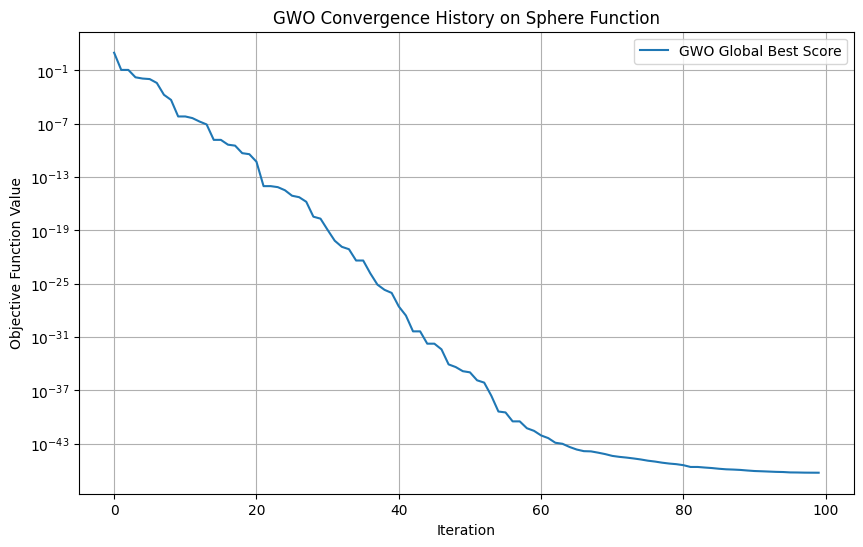

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class GWO:
    def __init__(self, objective_function, bounds, num_wolves, max_iterations):
        self.objective_function = objective_function
        self.bounds = bounds  # [(min, max), (min, max), ...]
        self.num_wolves = num_wolves
        self.max_iterations = max_iterations

        self.dimension = len(bounds)

        # Prepare bounds for vectorized operations
        bounds_array = np.array(bounds)
        self.lower_bounds = bounds_array[:, 0]
        self.upper_bounds = bounds_array[:, 1]

        # Initialize positions of search agents (wolves)
        self.positions = np.random.uniform(self.lower_bounds, self.upper_bounds, size=(self.num_wolves, self.dimension))

        # Initialize Alpha, Beta, and Delta wolves' positions and scores
        self.alpha_pos = np.zeros(self.dimension)
        self.alpha_score = float('inf')

        self.beta_pos = np.zeros(self.dimension)
        self.beta_score = float('inf')

        self.delta_pos = np.zeros(self.dimension)
        self.delta_score = float('inf')

    def optimize(self):
        history = []

        for iteration in range(self.max_iterations):
            # Evaluate fitness of all wolves
            for i in range(self.num_wolves):
                current_score = self.objective_function(self.positions[i, :])

                # Update Alpha, Beta, Delta
                if current_score < self.alpha_score:
                    self.alpha_score = current_score
                    self.alpha_pos = np.copy(self.positions[i, :])
                elif current_score < self.beta_score:
                    self.beta_score = current_score
                    self.beta_pos = np.copy(self.positions[i, :])
                elif current_score < self.delta_score:
                    self.delta_score = current_score
                    self.delta_pos = np.copy(self.positions[i, :])

            # Update the parameter 'a' (linearly decreases from 2 to 0)
            a = 2 - iteration * (2 / self.max_iterations)

            # Update positions of all wolves
            for i in range(self.num_wolves):
                for j in range(self.dimension):
                    # Calculate components for Alpha wolf
                    r1, r2 = np.random.rand(), np.random.rand()
                    A1 = 2 * a * r1 - a  # Coefficient vector A
                    C1 = 2 * r2         # Coefficient vector C
                    D_alpha = abs(C1 * self.alpha_pos[j] - self.positions[i, j])  # Distance from Alpha
                    X1 = self.alpha_pos[j] - A1 * D_alpha

                    # Calculate components for Beta wolf
                    r1, r2 = np.random.rand(), np.random.rand()
                    A2 = 2 * a * r1 - a
                    C2 = 2 * r2
                    D_beta = abs(C2 * self.beta_pos[j] - self.positions[i, j])  # Distance from Beta
                    X2 = self.beta_pos[j] - A2 * D_beta

                    # Calculate components for Delta wolf
                    r1, r2 = np.random.rand(), np.random.rand()
                    A3 = 2 * a * r1 - a
                    C3 = 2 * r2
                    D_delta = abs(C3 * self.delta_pos[j] - self.positions[i, j])  # Distance from Delta
                    X3 = self.delta_pos[j] - A3 * D_delta

                    # Update position based on average influence of Alpha, Beta, Delta
                    self.positions[i, j] = (X1 + X2 + X3) / 3

            # Apply boundary conditions
            self.positions = np.clip(self.positions, self.lower_bounds, self.upper_bounds)

            history.append(self.alpha_score)

        return self.alpha_pos, self.alpha_score, history

# Example Usage:
# Define the objective function (e.g., Sphere function)
def sphere_function(x):
    return np.sum(x**2)

# Define the bounds for each dimension
bounds_gwo = [(-10, 10), (-10, 10)] # For a 2D problem

# GWO parameters
num_wolves = 30
max_iterations = 100

# Create and run the GWO optimizer
gwo = GWO(sphere_function, bounds_gwo, num_wolves, max_iterations)
best_position_gwo, best_score_gwo, history_gwo = gwo.optimize()

print(f"GWO Best position found: {best_position_gwo}")
print(f"GWO Best score found: {best_score_gwo}")

# Plot the convergence history
plt.figure(figsize=(10, 6))
plt.plot(history_gwo, label='GWO Global Best Score')
plt.title('GWO Convergence History on Sphere Function')
plt.xlabel('Iteration')
plt.ylabel('Objective Function Value')
plt.yscale('log') # Use log scale for better visualization
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
# Optional: Save results to a JSON file
output_filename = "benchmark_results.json"
with open(output_filename, 'w') as f:
    json.dump(all_benchmark_results, f, indent=4)
print(f"Results saved to {output_filename}")

Results saved to benchmark_results.json


In [ ]:
plt.figure(figsize=(15, 8))

problem_to_plot = "T5"

for algo_name, results in all_benchmark_results.items():
    if problem_to_plot in results and results[problem_to_plot]["avg_history"]:
        plt.plot(results[problem_to_plot]["avg_history"], label=f'{algo_name} on {problem_to_plot}')

plt.title(f'Convergence History for All Algorithms on CEC2011 {problem_to_plot}')
plt.xlabel('Iterations/Evaluations')
plt.ylabel('Average Best Objective Function Value')
plt.yscale('log') # Use log scale for better visualization of convergence
plt.grid(True)
plt.legend()
plt.show()

/tmp/ipykernel_6887/1126154314.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(algorithms)).colors


Generating convergence history plots for all CEC2011 problems...


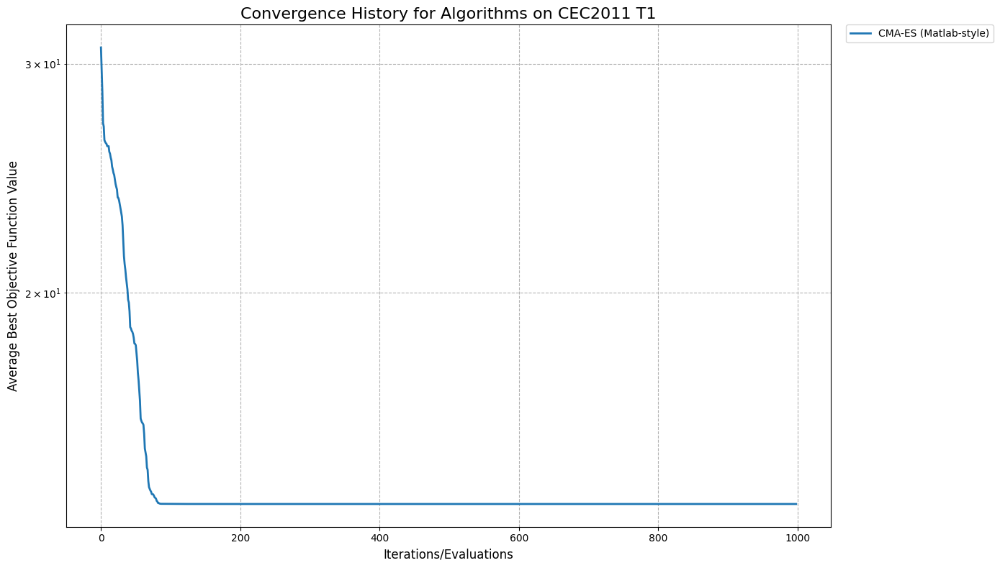

Plot for T1 generated.


/tmp/ipykernel_6887/1126154314.py:40: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.tight_layout() # Adjust layout to prevent labels from being cut off


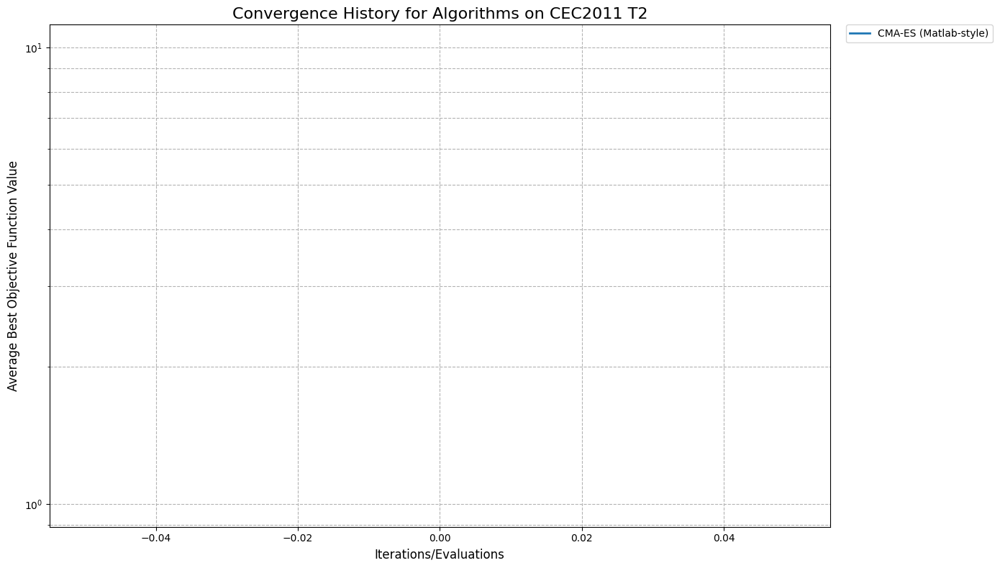

Plot for T2 generated.


/tmp/ipykernel_6887/1126154314.py:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., fontsize=10)


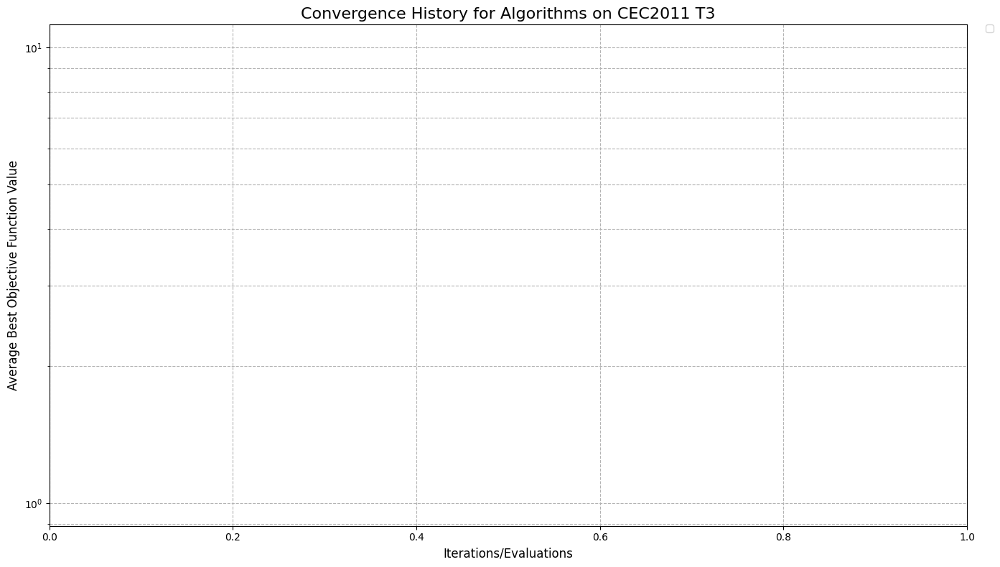

Plot for T3 generated.


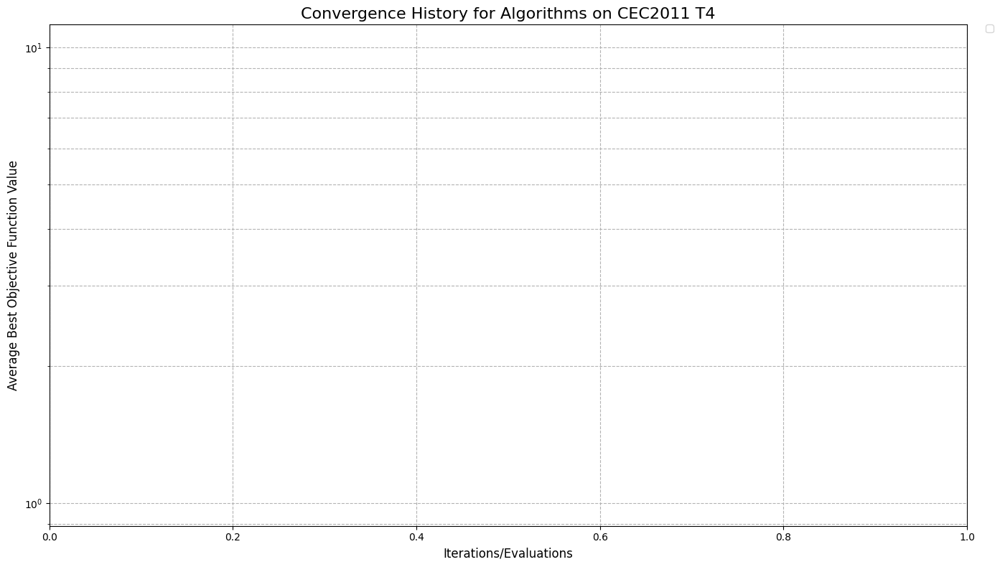

Plot for T4 generated.


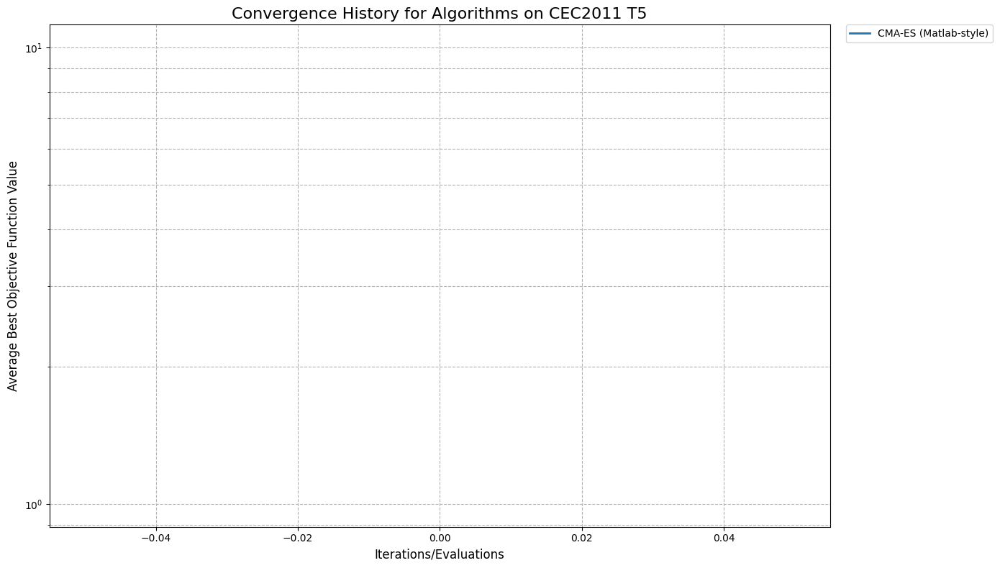

Plot for T5 generated.


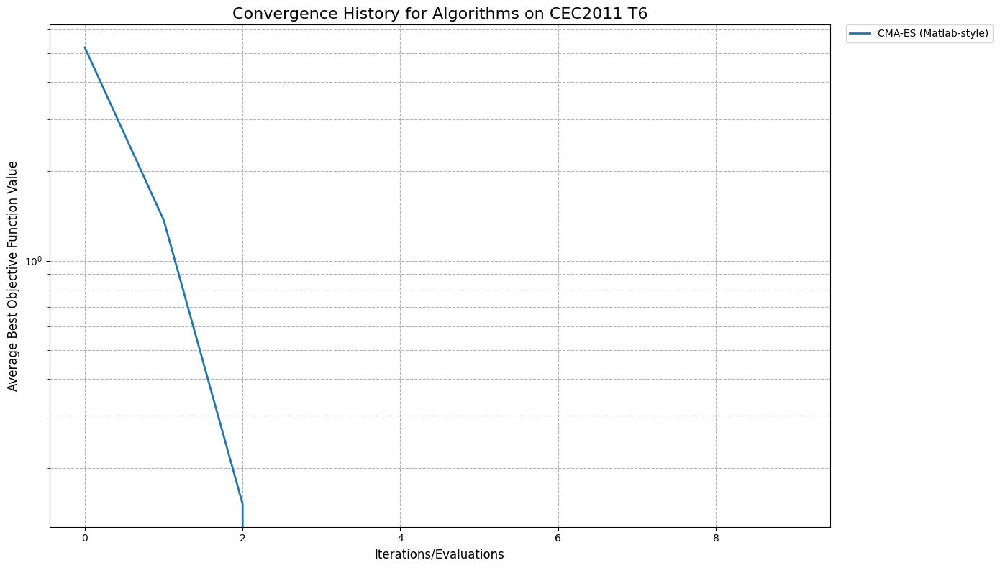

Plot for T6 generated.


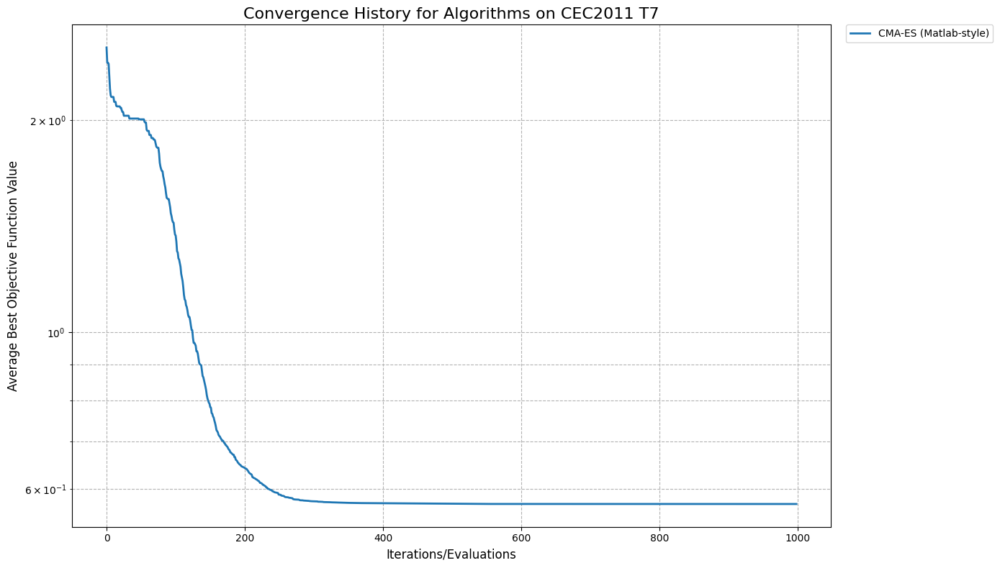

Plot for T7 generated.


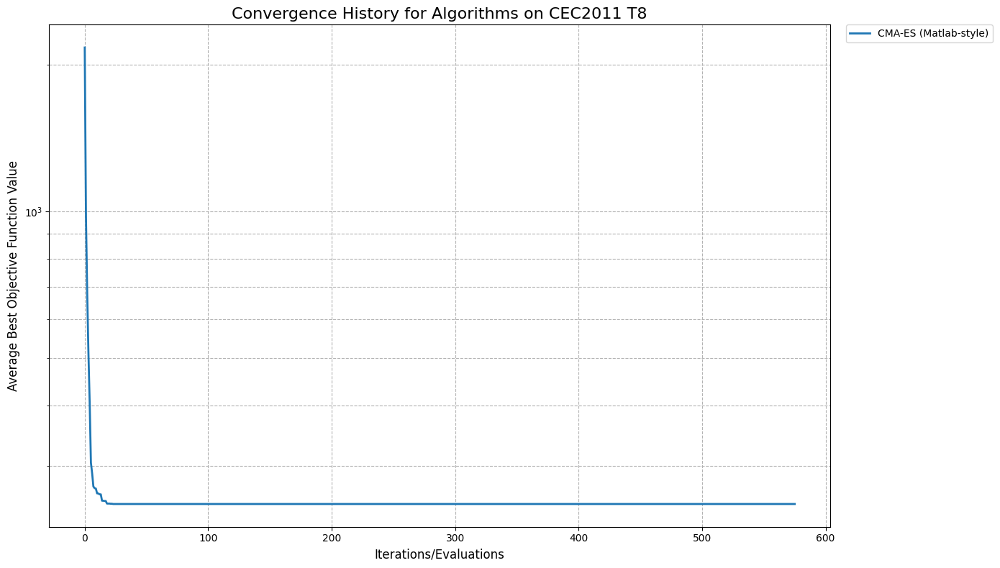

Plot for T8 generated.


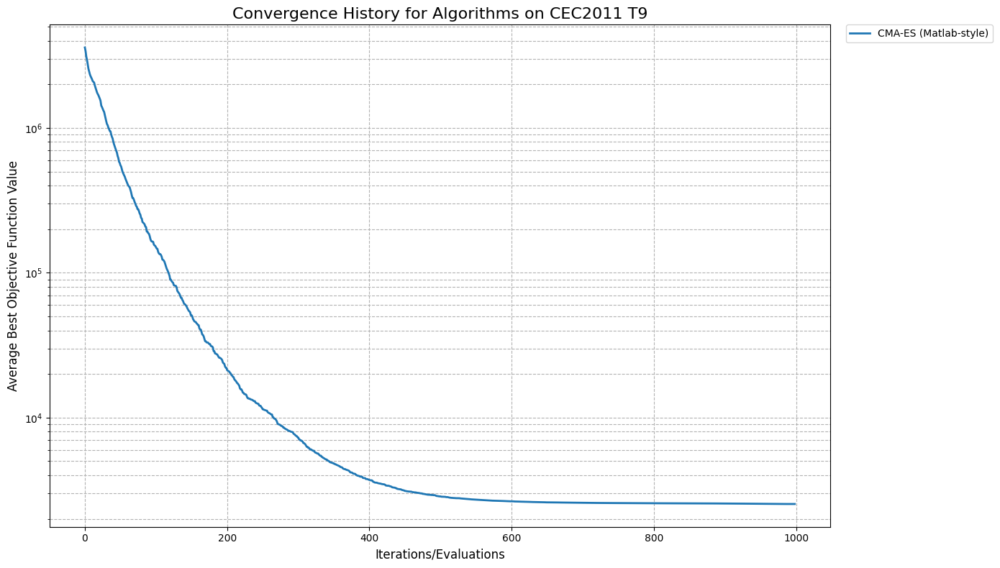

Plot for T9 generated.


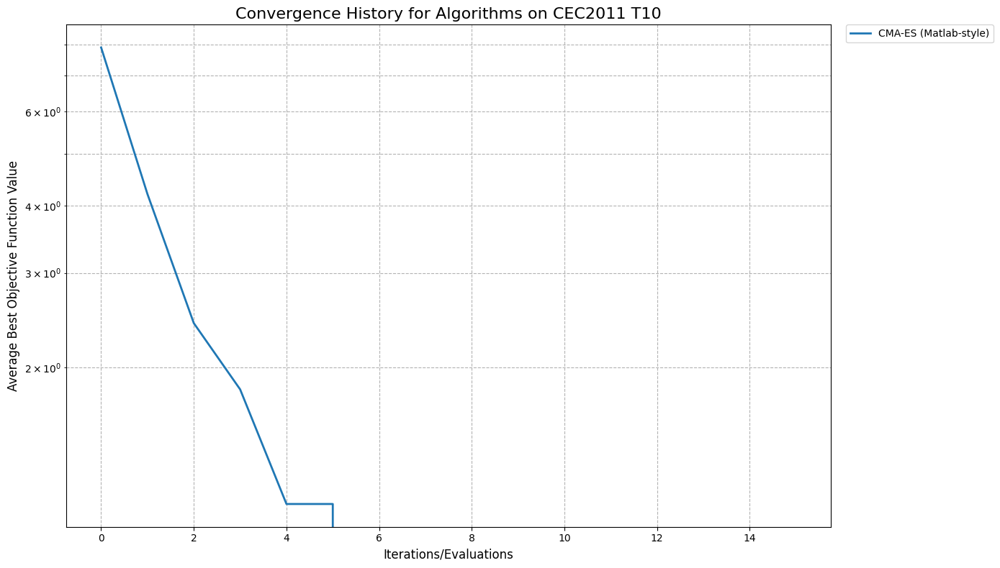

Plot for T10 generated.


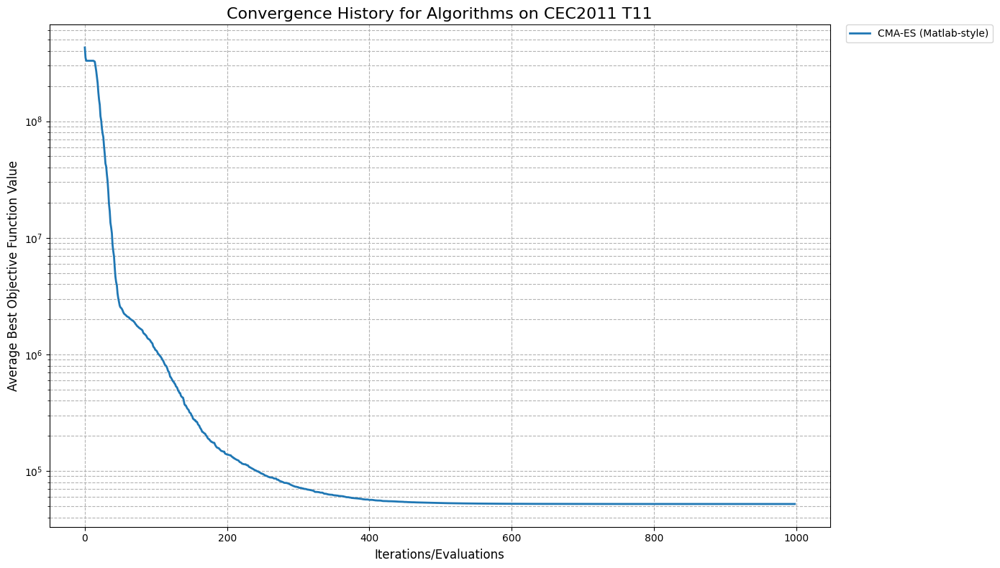

Plot for T11 generated.


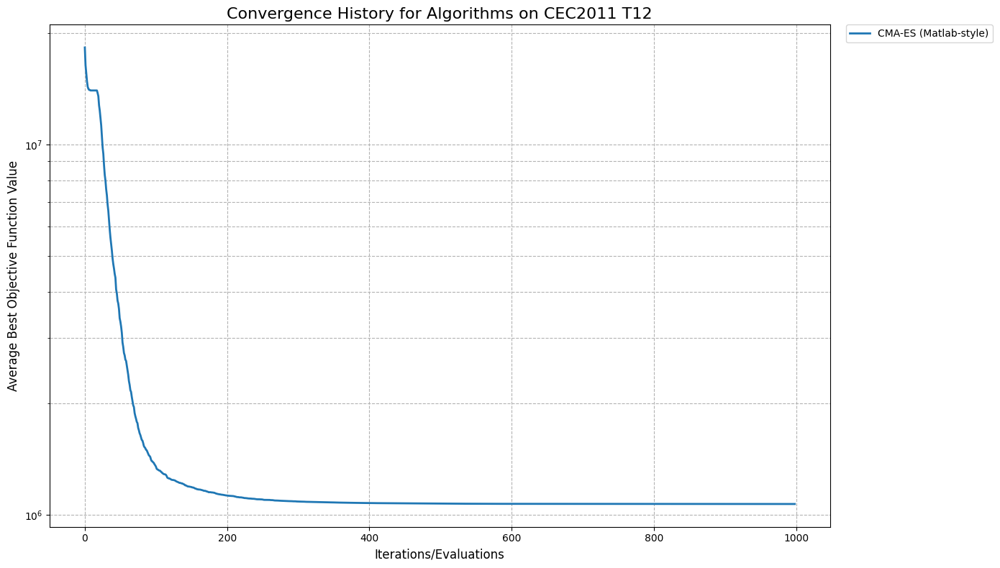

Plot for T12 generated.


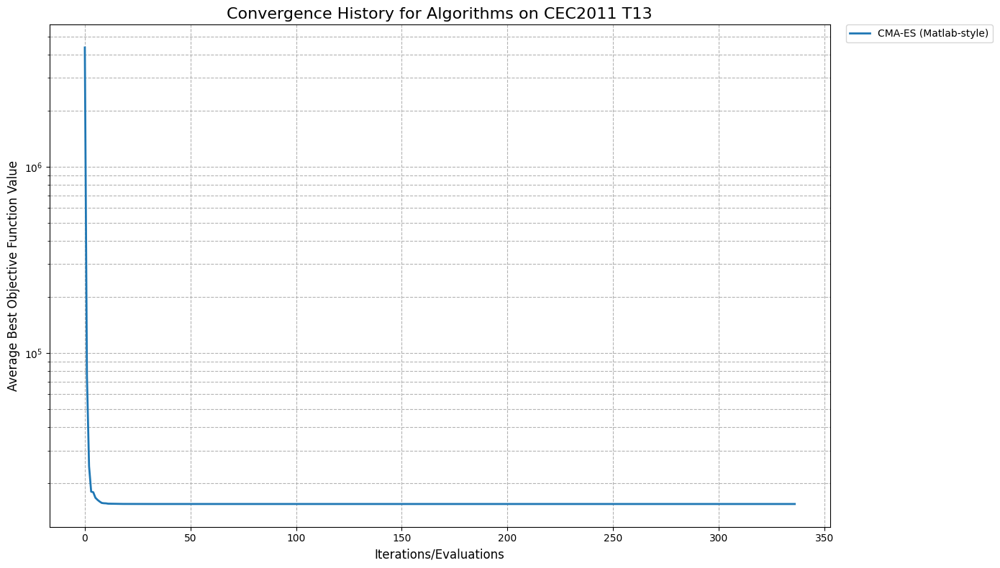

Plot for T13 generated.


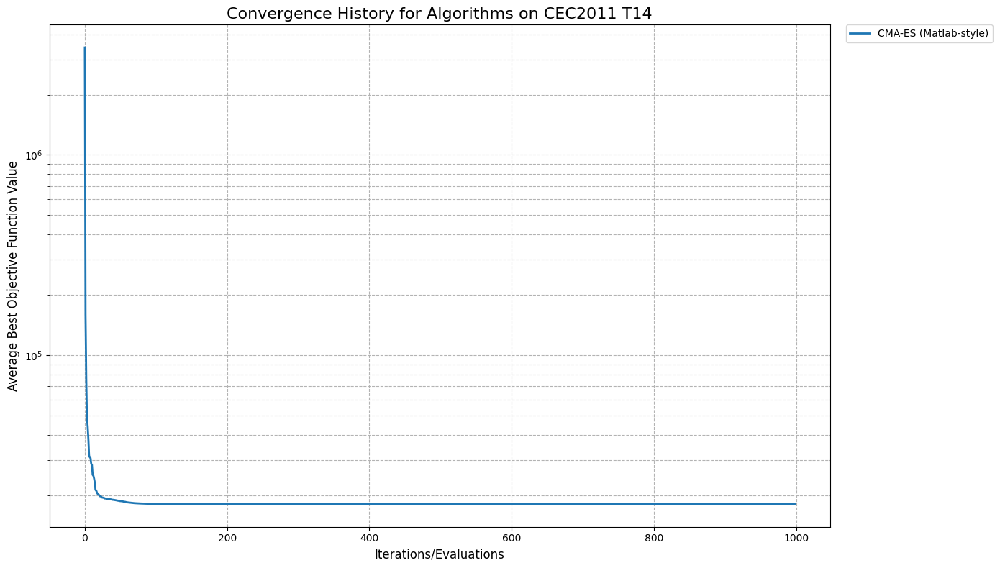

Plot for T14 generated.


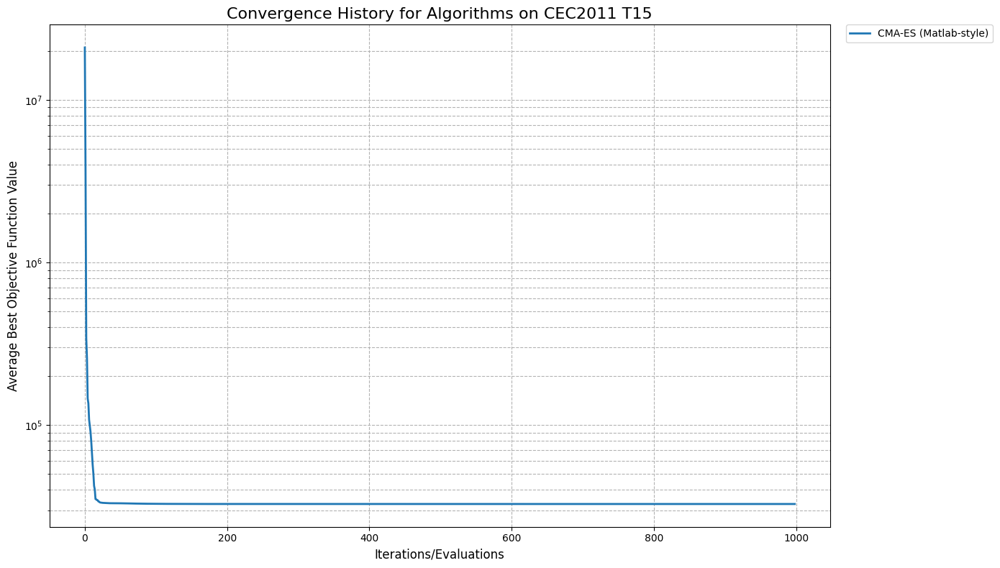

Plot for T15 generated.


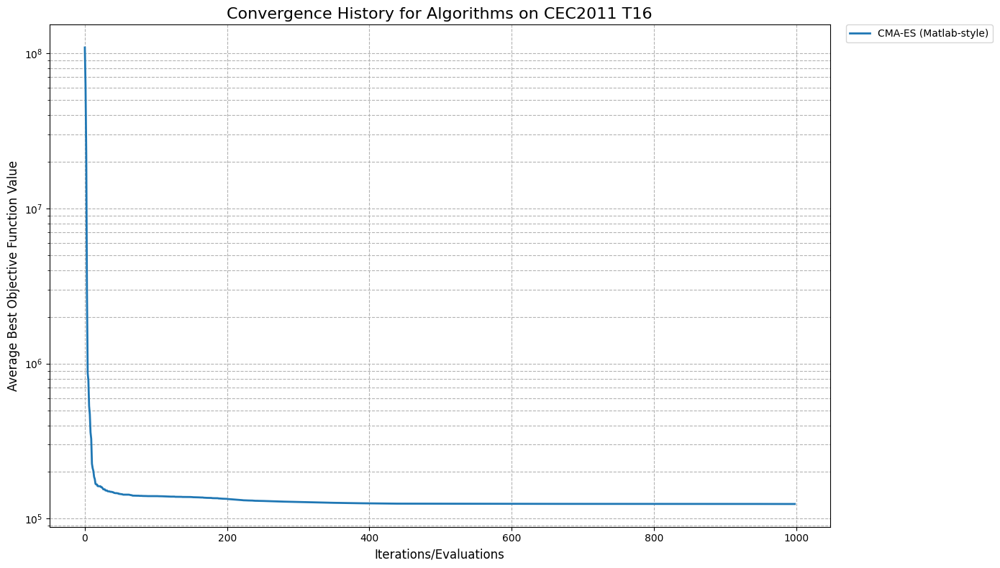

Plot for T16 generated.


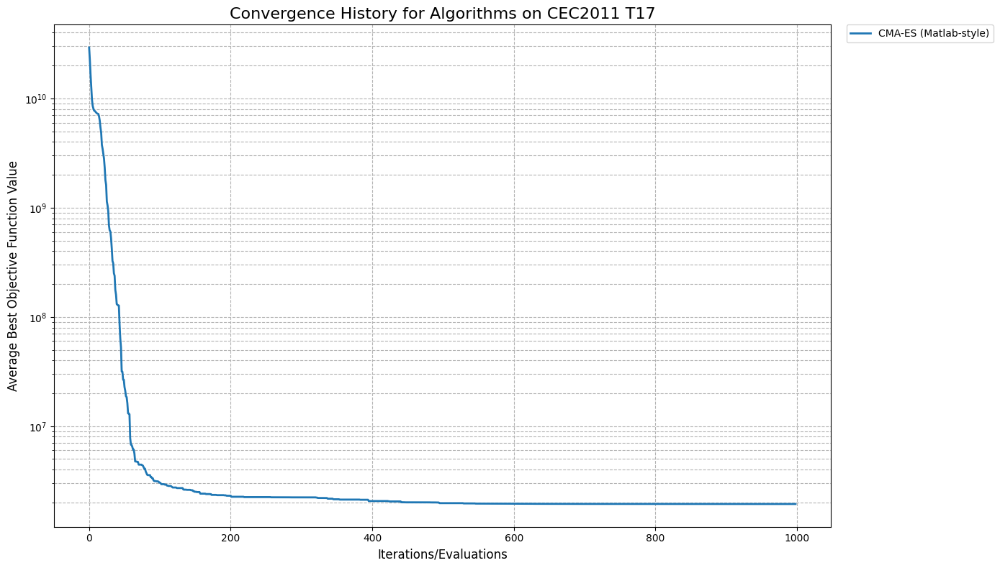

Plot for T17 generated.


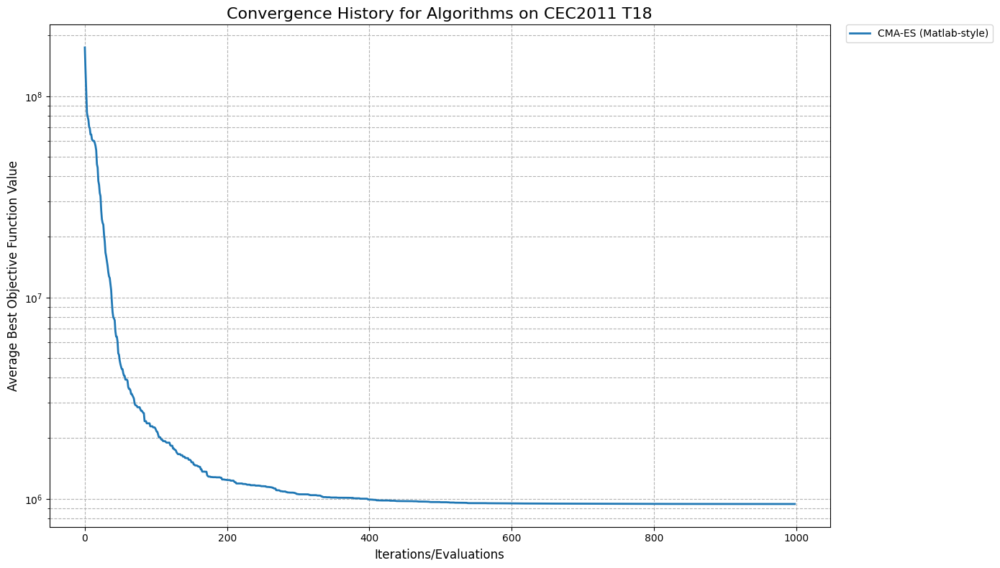

Plot for T18 generated.


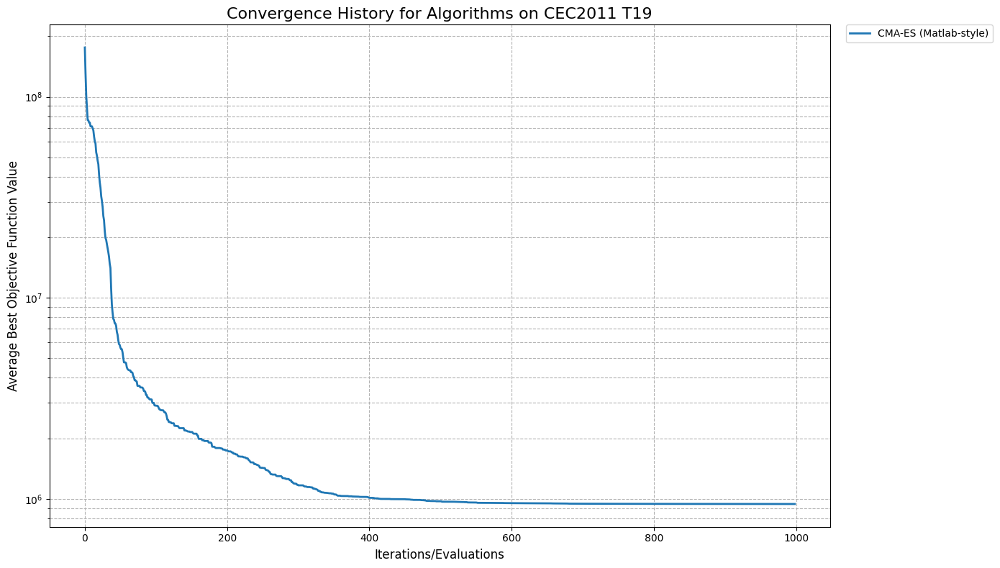

Plot for T19 generated.


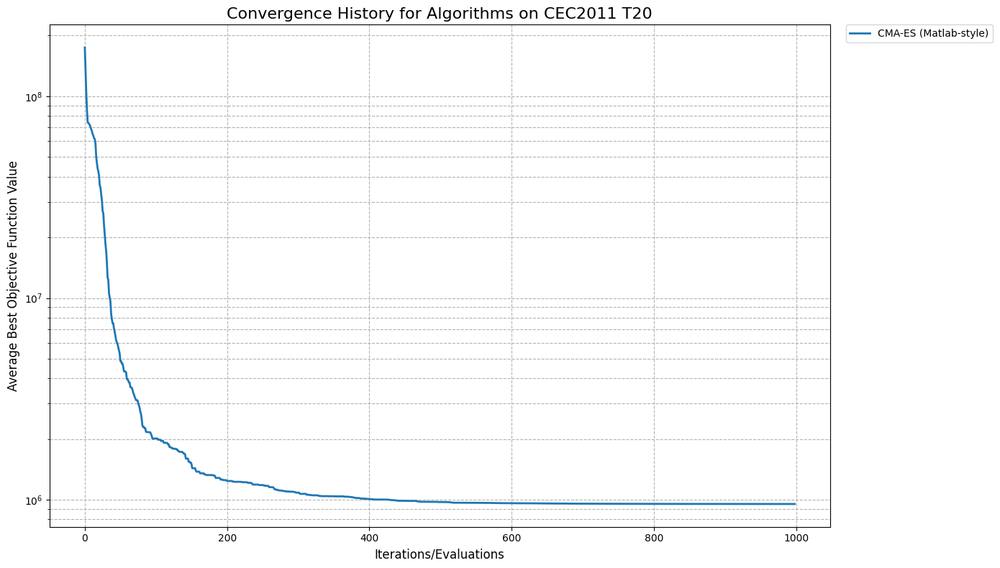

Plot for T20 generated.


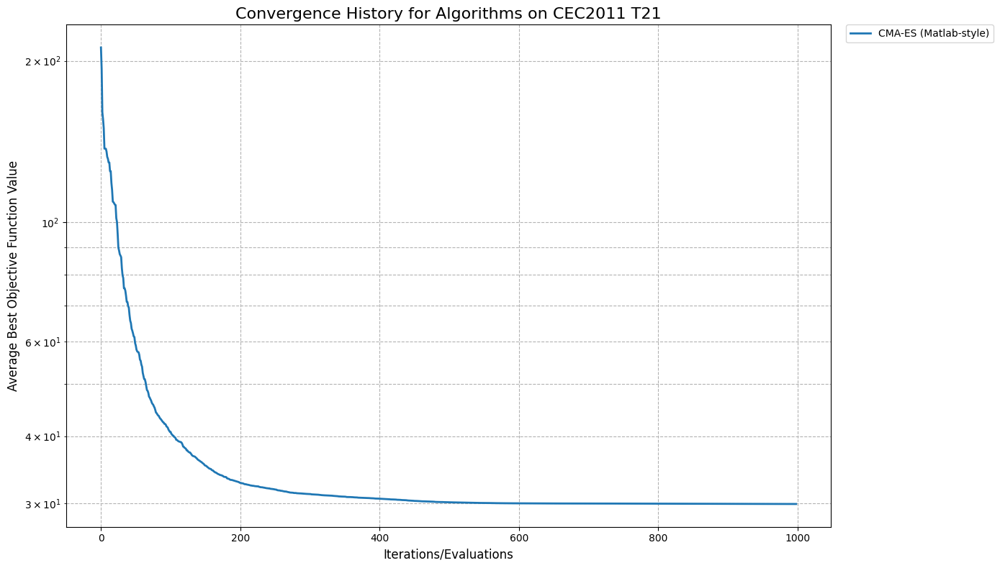

Plot for T21 generated.


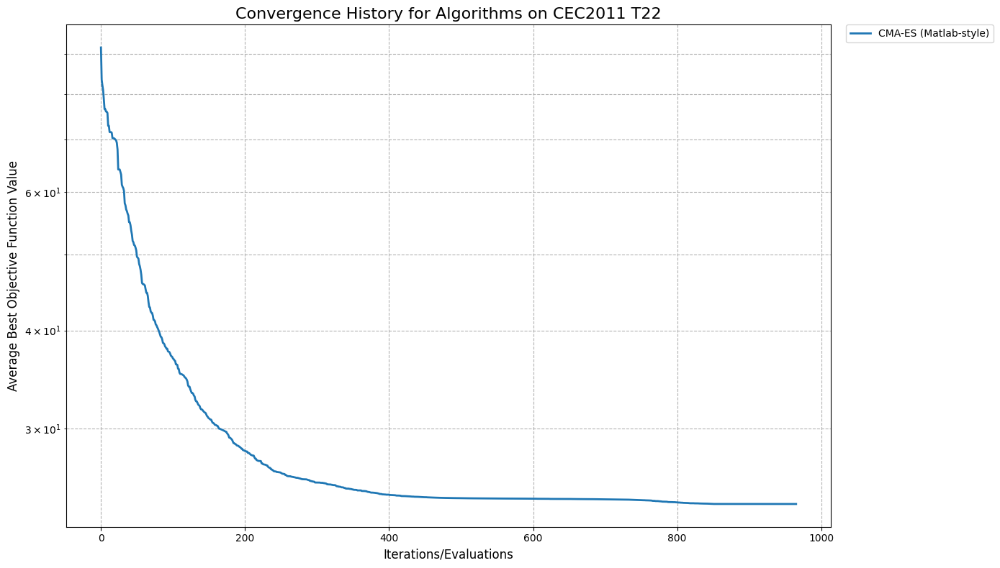

Plot for T22 generated.
All convergence history plots generated.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define a list of distinct line styles and markers
line_styles = ['-', '--', ':', '-.']
markers = ['o', 's', '^', 'D', 'p', '*', 'h', '+', 'x']

# Get a colormap with enough distinct colors for all algorithms
colors = plt.cm.get_cmap('tab10', len(algorithms)).colors

print("Generating convergence history plots for all CEC2011 problems...")

# Iterate through each problem
for problem_name in BENCHMARK_PROBLEMS:
    plt.figure(figsize=(14, 8)) # Increased figure size for better readability
    plt.title(f'Convergence History for Algorithms on CEC2011 {problem_name}', fontsize=16)
    plt.xlabel('Iterations/Evaluations', fontsize=12)
    plt.ylabel('Average Best Objective Function Value', fontsize=12)
    plt.yscale('log') # Use log scale for better visualization of convergence
    plt.grid(True, which="both", ls="--", c='0.7') # Add grid with minor ticks

    algo_idx = 0
    # Iterate through each algorithm's results
    for algo_name, results in all_benchmark_results.items():
        if problem_name in results and results[problem_name]["avg_history"]:
            history = results[problem_name]["avg_history"]
            # Ensure history is not empty and has valid data before plotting
            if history and not np.all(np.isnan(history)):
                plt.plot(
                    history,
                    label=f'{algo_name}',
                    color=colors[algo_idx % len(colors)], # Cycle through colors
                    linestyle=line_styles[algo_idx % len(line_styles)], # Cycle through line styles
                    linewidth=2 # Make lines slightly thicker
                )
            algo_idx += 1

    # Place legend outside the plot to avoid overlapping with lines
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., fontsize=10)
    plt.tight_layout() # Adjust layout to prevent labels from being cut off
    plt.show()
    print(f"Plot for {problem_name} generated.")

print("All convergence history plots generated.")

SHADE Best position found: [-2.00480288e-24  2.12677143e-24]
SHADE Best score found: 8.542391315389705e-48


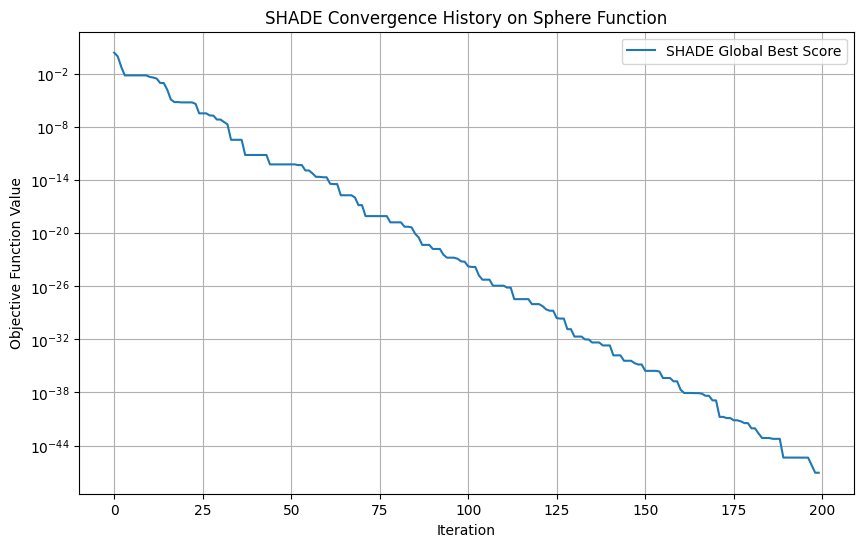

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class SHADE:
    def __init__(self, objective_function, bounds, num_individuals, max_iterations, H=100):
        self.objective_function = objective_function
        self.bounds = bounds  # [(min, max), (min, max), ...]
        self.num_individuals = num_individuals
        self.max_iterations = max_iterations
        self.H = H  # History size for CR and F adaptation

        self.dimension = len(bounds)

        # Prepare bounds for vectorized operations
        bounds_array = np.array(bounds)
        self.lower_bounds = bounds_array[:, 0]
        self.upper_bounds = bounds_array[:, 1]

        # Initialize population
        self.population = np.random.uniform(self.lower_bounds, self.upper_bounds, size=(self.num_individuals, self.dimension))
        self.fitness = np.array([self.objective_function(ind) for ind in self.population])

        # Initialize historical memories for CR and F
        self.M_CR = np.full(self.H, 0.5)  # Mean CR values
        self.M_F = np.full(self.H, 0.5)   # Mean F values
        self.archive = []  # Archive for successful individuals

        # Initialize global best
        self.global_best_fitness = np.min(self.fitness)
        self.global_best_position = self.population[np.argmin(self.fitness)]

    def optimize(self):
        history = []
        r_idx = 0 # Index for M_CR and M_F history

        for iteration in range(self.max_iterations):
            # Generate CR and F values for each individual
            CR_i = np.zeros(self.num_individuals)
            F_i = np.zeros(self.num_individuals)

            # Successful CR and F values for current generation
            S_CR = []
            S_F = []
            delta_f = [] # Fitness improvement values

            for i in range(self.num_individuals):
                # Select r_k from [1, H]
                k = np.random.randint(self.H)

                # Generate CR_i using normal distribution around M_CR[k]
                CR_i[i] = np.random.normal(loc=self.M_CR[k], scale=0.1)
                CR_i[i] = np.clip(CR_i[i], 0, 1) # Clip CR to [0, 1]

                # Generate F_i using Cauchy distribution around M_F[k]
                while True:
                    F_i[i] = np.random.standard_cauchy(1)[0] * 0.1 + self.M_F[k]
                    if F_i[i] > 0: # F must be positive
                        break
                F_i[i] = np.clip(F_i[i], 0, 1) # Clip F to [0, 1]

            # Apply mutation (current-to-pbest/1 strategy with archive)
            # and crossover
            trial_population = np.copy(self.population)
            for i in range(self.num_individuals):
                current_individual = self.population[i]

                # Select p-best individual
                p_best_size = int(0.05 * self.num_individuals) # Top 5% as p_best pool
                sorted_indices = np.argsort(self.fitness)
                p_best_candidates_indices = sorted_indices[:p_best_size]
                p_best_idx = np.random.choice(p_best_candidates_indices)
                p_best = self.population[p_best_idx]

                # Select two distinct individuals from population + archive
                union_pop_archive = np.vstack((self.population, np.array(self.archive))) if self.archive else self.population

                # Ensure we have at least 3 distinct individuals for r1, r2 selection
                if len(union_pop_archive) < 3:
                    r1, r2 = np.random.choice(len(self.population), 2, replace=False)
                    x_r1 = self.population[r1]
                    x_r2 = self.population[r2]
                else:
                    # Select two distinct random indices from union_pop_archive
                    indices = np.random.choice(len(union_pop_archive), 2, replace=False)
                    x_r1 = union_pop_archive[indices[0]]
                    x_r2 = union_pop_archive[indices[1]]


                # Mutation: DE/current-to-pbest/1
                mutant_vector = current_individual + F_i[i] * (p_best - current_individual) + F_i[i] * (x_r1 - x_r2)

                # Crossover (binomial)
                trial_vector = np.copy(current_individual)
                j_rand = np.random.randint(self.dimension)
                for j in range(self.dimension):
                    if np.random.rand() < CR_i[i] or j == j_rand:
                        trial_vector[j] = mutant_vector[j]

                # Apply bounds to trial vector
                trial_vector = np.clip(trial_vector, self.lower_bounds, self.upper_bounds)
                trial_population[i] = trial_vector

            # Evaluate trial population
            trial_fitness = np.array([self.objective_function(ind) for ind in trial_population])

            # Selection
            for i in range(self.num_individuals):
                if trial_fitness[i] < self.fitness[i]:
                    # If trial vector is better, replace parent
                    self.population[i] = trial_population[i]

                    # Record successful CR and F for adaptation
                    S_CR.append(CR_i[i])
                    S_F.append(F_i[i])
                    delta_f.append(abs(self.fitness[i] - trial_fitness[i]))

                    # Add parent to archive
                    self.archive.append(self.population[i])

                    # Update fitness
                    self.fitness[i] = trial_fitness[i]

            # Truncate archive if it grows too large
            if len(self.archive) > self.num_individuals:
                self.archive = self.archive[len(self.archive) - self.num_individuals:]

            # Update M_CR and M_F if successful parameters exist
            if len(S_CR) > 0:
                # Weighted mean for M_CR
                weights = np.array(delta_f)
                weights = weights / np.sum(weights) # Normalize weights
                self.M_CR[r_idx] = np.sum(np.array(S_CR) * weights)

                # Weighted mean for M_F
                self.M_F[r_idx] = np.sum(np.array(S_F) * weights)

                r_idx = (r_idx + 1) % self.H

            # Update global best
            min_current_fitness = np.min(self.fitness)
            if min_current_fitness < self.global_best_fitness:
                self.global_best_fitness = min_current_fitness
                self.global_best_position = self.population[np.argmin(self.fitness)]

            history.append(self.global_best_fitness)

        return self.global_best_position, self.global_best_fitness, history

# Example Usage:
# Define the objective function (e.g., Sphere function)
def sphere_function(x):
    return np.sum(x**2)

# Define the bounds for each dimension
bounds_shade = [(-10, 10), (-10, 10)] # For a 2D problem

# SHADE parameters
num_individuals = 50
max_iterations = 200
H_size = 50 # History size

# Create and run the SHADE optimizer
shade = SHADE(sphere_function, bounds_shade, num_individuals, max_iterations, H=H_size)
best_position_shade, best_score_shade, history_shade = shade.optimize()

print(f"SHADE Best position found: {best_position_shade}")
print(f"SHADE Best score found: {best_score_shade}")

# Plot the convergence history
plt.figure(figsize=(10, 6))
plt.plot(history_shade, label='SHADE Global Best Score')
plt.title('SHADE Convergence History on Sphere Function')
plt.xlabel('Iteration')
plt.ylabel('Objective Function Value')
plt.yscale('log') # Use log scale for better visualization
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class CSA:
    def __init__(self, objective_function, bounds, num_individuals, max_iterations):
        self.objective_function = objective_function
        self.bounds = bounds  # [(min, max), (min, max), ...]
        self.num_individuals = num_individuals
        self.max_iterations = max_iterations
        self.c = 0.8 # Parameter 'c' from the MATLAB code

        self.dimension = len(bounds)

        # Prepare bounds for vectorized operations
        bounds_array = np.array(bounds)
        self.lower_bounds = bounds_array[:, 0]
        self.upper_bounds = bounds_array[:, 1]

        # Initialize individuals positions
        self.positions = np.random.uniform(self.lower_bounds, self.upper_bounds, size=(self.num_individuals, self.dimension))

        # Initialize fitness
        self.fitness = np.array([self.objective_function(p) for p in self.positions])

        # Initialize global best (X_c and best in MATLAB)
        self.global_best_fitness = np.min(self.fitness)
        self.global_best_position = np.copy(self.positions[np.argmin(self.fitness)])

    def optimize(self):
        history = []

        for iteration in range(1, self.max_iterations + 1): # MATLAB uses 1-based indexing for iterations, l=0 init.
            # Calculate 'a'
            a = np.pi - np.pi * (iteration / self.max_iterations)**2

            # Calculate 'p'
            p = 1 - 0.9 * (iteration / self.max_iterations)**0.5

            # Calculate 'w' (scalar, once per iteration, based on mealpy and typical CSA interpretation)
            w = a * np.random.rand() - a

            # Update the Position of search agents
            for i in range(self.num_individuals):
                for j in range(self.dimension):
                    rand_val_tan = np.random.rand() # A new random number for each dimension

                    if iteration > (self.c * self.max_iterations):
                        # Escape local stagnation
                        self.positions[i, j] = self.global_best_position[j] + (self.global_best_position[j] - self.positions[i, j]) * np.tan(w * rand_val_tan)
                    else:
                        self.positions[i, j] = self.global_best_position[j] - (self.global_best_position[j] - self.positions[i, j]) * np.tan(w * p * rand_val_tan)

            # Apply boundary conditions after updating all dimensions of all particles
            self.positions = np.clip(self.positions, self.lower_bounds, self.upper_bounds)

            # Evaluate current scores for all particles and update global best
            for i in range(self.num_individuals):
                current_score = self.objective_function(self.positions[i, :])
                self.fitness[i] = current_score # Update individual fitness

                if current_score < self.global_best_fitness:
                    self.global_best_fitness = current_score
                    self.global_best_position = np.copy(self.positions[i, :])

            history.append(self.global_best_fitness)
            # The original MATLAB code printed iteration progress. We can re-add if needed:
            # print(f"CSA- Iteration {iteration}: Best Cost = {self.global_best_fitness:.4e}")

        return self.global_best_position, self.global_best_fitness, history

# Example Usage (optional, for testing the class in isolation):
def sphere_function(x):
    return np.sum(x**2)

bounds_csa = [(-10, 10), (-10, 10)] # For a 2D problem
num_individuals = 30
max_iterations = 100

csa = CSA(sphere_function, bounds_csa, num_individuals, max_iterations)
best_position_csa, best_score_csa, history_csa = csa.optimize()

print(f"CSA Best position found: {best_position_csa}")
print(f"CSA Best score found: {best_score_csa}")

CSA Best position found: [-5.59696143e-08  2.66675024e-09]
CSA Best score found: 3.139709279587256e-15


In [ ]:
import numpy as np

class PureCMAES_Python:
    def __init__(self, objective_function, N, lower_bounds, upper_bounds,
                 initial_sigma, max_iterations, pop_size, max_total_evaluations):
        self.objective_function = objective_function
        self.N = N  # number of objective variables/problem dimension

        # Initialize xmean within bounds
        self.xmean = np.random.uniform(lower_bounds, upper_bounds, N).astype(float).reshape(-1, 1)

        self.sigma = initial_sigma  # coordinate wise standard deviation (step size)
        self.stopfitness = 1e-10  # stop if fitness < stopfitness (minimization)

        # User defined max iterations and population size
        self.max_iterations = max_iterations
        self.lam = pop_size # Set lambda (offspring population size) from input pop_size

        # Total evaluations budget
        self.stopeval = max_total_evaluations

        self.mu = self.lam / 2  # number of parents/points for recombination
        weights_orig = np.log(self.mu + 1 / 2) - np.log(np.arange(1, int(self.mu) + 1))
        self.mu = int(np.floor(self.mu))
        self.weights = weights_orig / np.sum(weights_orig)  # normalize recombination weights array
        self.mueff = np.sum(self.weights) ** 2 / np.sum(self.weights ** 2)  # variance-effectiveness of sum w_i x_i

        # Strategy parameter setting: Adaptation
        self.cc = (4 + self.mueff / N) / (N + 4 + 2 * self.mueff / N)  # time constant for cumulation for C
        self.cs = (self.mueff + 2) / (N + self.mueff + 5)  # t-const for cumulation for sigma control
        self.c1 = 2 / ((N + 1.3) ** 2 + self.mueff)  # learning rate for rank-one update of C
        self.cmu = min(1 - self.c1, 2 * (self.mueff - 2 + 1 / self.mueff) / ((N + 2) ** 2 + self.mueff))  # and for rank-mu update
        self.damps = 1 + 2 * max(0, np.sqrt((self.mueff - 1) / (N + 1)) - 1) + self.cs  # damping for sigma

        # Initialize dynamic (internal) strategy parameters and constants
        self.pc = np.zeros((N, 1))
        self.ps = np.zeros((N, 1))  # evolution paths for C and sigma
        self.B = np.eye(N)  # B defines the coordinate system
        self.D = np.ones((N, 1))  # diagonal D defines the scaling
        self.C = self.B @ np.diag(self.D[:,0] ** 2) @ self.B.T  # covariance matrix C
        self.invsqrtC = self.B @ np.diag(self.D[:,0] ** -1) @ self.B.T  # C^-1/2
        self.eigeneval = 0  # track update of B and D
        self.chiN = N**0.5 * (1 - 1 / (4 * N) + 1 / (21 * N ** 2))  # expectation of ||N(0,I)||

        self.lower_bounds = np.atleast_1d(lower_bounds)
        self.upper_bounds = np.atleast_1d(upper_bounds)

    def optimize(self):
        counteval = 0
        history = []
        best_overall_fitness = float('inf')
        best_overall_x = self.xmean.flatten()

        for iteration_num in range(self.max_iterations): # Loop for max_iterations (generations)
            if counteval >= self.stopeval: # Check if total evaluations budget is exceeded
                break

            arx = np.zeros((self.N, self.lam))
            arfitness = np.zeros(self.lam)

            # Generate and evaluate lambda offspring
            for k in range(self.lam):
                if counteval >= self.stopeval: # Check budget before each evaluation
                    break
                z = np.random.randn(self.N, 1)  # N(0,I)
                y = self.B @ (self.D * z)  # ~= N(0,C)
                x_candidate = (self.xmean + self.sigma * y).flatten()  # m + sig * Normal(0,C)

                # Apply bounds
                x_candidate = np.clip(x_candidate, self.lower_bounds, self.upper_bounds)

                arx[:, k] = x_candidate
                arfitness[k] = self.objective_function(arx[:, k])  # objective function call
                counteval += 1

            if counteval >= self.stopeval:
                break

            # Sort by fitness and compute weighted mean into xmean
            arindex = np.argsort(arfitness)  # minimization
            arfitness_sorted = arfitness[arindex]
            xold = self.xmean
            self.xmean = arx[:, arindex[:self.mu]] @ self.weights.reshape(-1, 1)  # recombination, new mean value

            # Update overall best
            if arfitness_sorted[0] < best_overall_fitness:
                best_overall_fitness = arfitness_sorted[0]
                best_overall_x = arx[:, arindex[0]]
            history.append(best_overall_fitness)

            # Cumulation: Update evolution paths
            self.ps = (1 - self.cs) * self.ps + np.sqrt(self.cs * (2 - self.cs) * self.mueff) * self.invsqrtC @ (self.xmean - xold) / self.sigma
            hsig = np.linalg.norm(self.ps) / np.sqrt(1 - (1 - self.cs)**(2 * counteval / self.lam)) / self.chiN < 1.4 + 2 / (self.N + 1)
            self.pc = (1 - self.cc) * self.pc + hsig * np.sqrt(self.cc * (2 - self.cc) * self.mueff) * (self.xmean - xold) / self.sigma

            # Adapt covariance matrix C
            artmp = (1 / self.sigma) * (arx[:, arindex[:self.mu]] - xold)
            self.C = (1 - self.c1 - self.cmu) * self.C + \
                     self.c1 * (self.pc @ self.pc.T + (1 - hsig) * self.cc * (2 - self.cc) * self.C) + \
                     self.cmu * artmp @ np.diag(self.weights) @ artmp.T

            # Adapt step size sigma
            self.sigma = self.sigma * np.exp((self.cs / self.damps) * (np.linalg.norm(self.ps) / self.chiN - 1))

            # Decomposition of C into B*diag(D.^2)*B' (diagonalization)
            # Ensure to update if enough evaluations have passed for stability, avoid too frequent updates
            if counteval - self.eigeneval > (self.lam / (self.c1 + self.cmu) / self.N / 10) and counteval > 0:  # to achieve O(N^2)
                self.eigeneval = counteval
                self.C = np.triu(self.C) + np.triu(self.C, 1).T  # enforce symmetry
                D_raw, B_raw = np.linalg.eigh(self.C)  # eigen decomposition, B==normalized eigenvectors
                # Sort eigenvalues and eigenvectors
                idx = D_raw.argsort()[::-1] # Sort descending
                self.D = np.sqrt(D_raw[idx]).reshape(-1, 1)
                self.B = B_raw[:, idx]
                self.invsqrtC = self.B @ np.diag(self.D[:,0] ** -1) @ self.B.T

            # Break, if fitness is good enough or condition exceeds 1e14
            if arfitness_sorted[0] <= self.stopfitness or (np.min(self.D) > 0 and np.max(self.D) / np.min(self.D) > 1e7):
                break

        return best_overall_x, best_overall_fitness, history

In [ ]:
import random
import numpy as np

# --- Standardized Algorithm Wrappers ---

def run_pso_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    pso_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_particles, max_iterations)
    _, best_score, history = pso_instance.optimize()
    return best_score, history

def run_pso_m_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    # Using Gaussian mutation variant
    pso_m_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                         num_particles, max_iterations, mutation_rate=0.05, gaussian_mutation_strength=0.1)
    _, best_score, history = pso_m_instance.optimize()
    return best_score, history

def run_pso_riw_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    # Using Random Inertia Weight variant
    pso_riw_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                          num_particles, max_iterations, w_random_range=(0.4, 0.9))
    _, best_score, history = pso_riw_instance.optimize()
    return best_score, history

def run_hppso_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    # HPPSO expects a single tuple for bounds if scalar, or array for vector bounds
    bounds_for_hppso = (lower_bound, upper_bound)

    hppso_instance = HPPSO_Modified(obj_func, n_pop=num_particles, dimensions=dim,
                                    max_it=max_iterations, bounds=bounds_for_hppso)
    best_score, history = hppso_instance.optimize()
    return best_score, history

def run_ga_mpc_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    ps_local = POP_SIZE
    max_gen_local = MAX_ITERS

    _, best_score, history = run_ga_mpc_cec(
        obj_func, dim, lower_bound, upper_bound,
        ps=ps_local, max_gen=max_gen_local
    )
    return best_score, history

def run_gwo_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_wolves = POP_SIZE
    max_iterations = MAX_ITERS

    gwo_instance = GWO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_wolves, max_iterations)
    _, best_score, history = gwo_instance.optimize()
    return best_score, history

def run_shade_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_individuals = POP_SIZE
    max_iterations = MAX_ITERS
    H_size = 50 # Standard history size for SHADE

    shade_instance = SHADE(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                           num_individuals, max_iterations, H=H_size)
    _, best_score, history = shade_instance.optimize()
    return best_score, history

def run_csa_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_individuals = POP_SIZE
    max_iterations = MAX_ITERS

    csa_instance = CSA(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_individuals, max_iterations)
    _, best_score, history = csa_instance.optimize()
    return best_score, history

def run_pure_cmaes_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    # Calculate initial sigma as 0.1 * average range
    lb_arr = np.atleast_1d(lower_bound)
    ub_arr = np.atleast_1d(upper_bound)
    if lb_arr.size == 1: # If scalar bounds, replicate for dimension
        lb_arr = np.full(dim, lb_arr.item())
        ub_arr = np.full(dim, ub_arr.item())

    bounds_range = ub_arr - lb_arr
    # Ensure bounds_range is not zero to avoid division by zero or NaN sigma
    if np.all(bounds_range == 0):
        initial_sigma_val = 0.3 # Fallback to a small sigma if range is zero
    else:
        initial_sigma_val = 0.25 * np.mean(bounds_range[bounds_range > 0]) # Calculate mean of positive ranges

    # User-requested inputs for population size and max iterations
    user_pop_size = POP_SIZE # Use global POP_SIZE for population size (lambda)
    user_max_iterations = MAX_ITERS # Use global MAX_ITERS for iterations

    cmaes_instance = PureCMAES_Python(objective_function=obj_func, N=dim,
                                      lower_bounds=lower_bound, upper_bounds=upper_bound,
                                      initial_sigma=initial_sigma_val, # Pass calculated sigma
                                      max_iterations=user_max_iterations, # Pass max iterations
                                      pop_size=user_pop_size, # Pass population size
                                      max_total_evaluations=max_evals_budget) # Pass total evaluation budget

    _, best_score, history = cmaes_instance.optimize()
    return best_score, history

algorithms = {
    "Original PSO": run_pso_benchmark,
    "PSO-m": run_pso_m_benchmark,
    "PSO-RIW": run_pso_riw_benchmark,
    "HPPSO_Modified": run_hppso_benchmark,
    "GA-MPC": run_ga_mpc_benchmark,
    "GWO": run_gwo_benchmark,
    "SHADE": run_shade_benchmark,
    "CSA": run_csa_benchmark,
    "CMA-ES (Matlab-style)": run_pure_cmaes_benchmark
    # "Mealpy GWO": run_mealpy_gwo_benchmark,
    # "Mealpy SHADE": run_mealpy_shade_benchmark,
    # "Mealpy CircleSA": run_mealpy_circlesa_benchmark,
}

In [ ]:
alg

In [ ]:
print("Starting comprehensive benchmarking...")

# Re-initialize all_benchmark_results to avoid NameError if kernel state was reset
all_benchmark_results = {}

algorithms_to_run_filtered = algorithms # Use all algorithms
problem_to_run_filtered = cec2011_problems # Use all CEC2011 problems

for algo_name, algo_func in algorithms_to_run_filtered.items():
    print(f"\n--- Benchmarking Algorithm: {algo_name} ---")
    all_benchmark_results[algo_name] = {}

    for problem_info in problem_to_run_filtered:
        problem_name = problem_info["name"]
        obj_func = problem_info["function"]
        dim = problem_info["dimension"]
        lower_bound = problem_info["bounds"][0]
        upper_bound = problem_info["bounds"][1]

        # Skip 1D problems as requested
        if dim == 1:
            print(f"  Skipping 1D problem: {problem_name}")
            continue

        print(f"  Running on problem: {problem_name} (Dim: {dim}, Bounds: {lower_bound} to {upper_bound})")

        run_final_scores = []
        run_histories = []

        for run in range(NUM_RUNS): # Use the global NUM_RUNS for all runs
            random_seed = run # Use the run number as a seed for reproducibility across runs
            current_max_evals_budget = MAX_EVALS_PER_RUN

            try:
                final_score, history = algo_func(obj_func, dim, lower_bound, upper_bound, current_max_evals_budget, random_seed)
                run_final_scores.append(final_score)
                run_histories.append(history)
                print(f"    Run {run+1}/{NUM_RUNS} finished. Best score: {final_score:.5e}")
            except Exception as e:
                print(f"    Run {run+1}/{NUM_RUNS} failed for {algo_name} on {problem_name}: {e}")
                run_final_scores.append(np.nan)
                run_histories.append([]) # Append empty list for history

        # Process results for this algorithm-problem pair
        if run_final_scores:
            avg_final_score = np.nanmean(run_final_scores)
            max_len = max(len(h) for h in run_histories if h) if run_histories else 0
            if max_len > 0:
                padded_histories = [
                    np.pad(h, (0, max_len - len(h)), 'edge') if h else np.full(max_len, np.nan) for h in run_histories
                ]
                avg_history = np.nanmean(padded_histories, axis=0)
            else:
                avg_history = np.array([])

            all_benchmark_results[algo_name][problem_name] = {
                "avg_final_score": avg_final_score,
                "all_final_scores": run_final_scores,
                "avg_history": avg_history.tolist() # Convert numpy array to list for JSON serialization
            }
            print(f"  Average final score for {algo_name} on {problem_name}: {avg_final_score:.5e}")
        else:
            print(f"  No successful runs for {algo_name} on {problem_name}.")

print("\nBenchmarking complete. Results stored in 'all_benchmark_results'.")

# Optional: Save results to a JSON file
output_filename = "benchmark_results.json"
with open(output_filename, 'w') as f:
    json.dump(all_benchmark_results, f, indent=4)
print(f"Results saved to {output_filename}")


Starting comprehensive benchmarking...

--- Benchmarking Algorithm: CMA-ES (Matlab-style) ---
  Running on problem: T1 (Dim: 6, Bounds: [-6.4 -6.4 -6.4 -6.4 -6.4 -6.4] to [6.35 6.35 6.35 6.35 6.35 6.35])
    Run 1/10 finished. Best score: 1.45269e+01
    Run 2/10 finished. Best score: 1.23061e+01
    Run 3/10 finished. Best score: 1.48131e+01
    Run 4/10 finished. Best score: 1.21609e+01
    Run 5/10 finished. Best score: 1.25353e+01
    Run 6/10 finished. Best score: 1.73211e+01
    Run 7/10 finished. Best score: 1.64597e+01
    Run 8/10 finished. Best score: 1.13739e+01
    Run 9/10 finished. Best score: 1.48131e+01
    Run 10/10 finished. Best score: 1.12072e+01
  Average final score for CMA-ES (Matlab-style) on T1: 1.37517e+01
  Running on problem: T2 (Dim: 30, Bounds: [ 0.    0.    0.   -4.   -4.   -4.   -4.   -4.25 -4.25 -4.25 -4.5  -4.5
 -4.5  -4.75 -4.75 -4.75 -5.   -5.   -5.   -5.25 -5.25 -5.25 -5.5  -5.5
 -5.5  -5.75 -5.75 -5.75 -6.   -6.  ] to [4.         4.         3.14159

In [ ]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt

# Re-initialize all_benchmark_results to consolidate data from all files
all_benchmark_results = {}

# List all files in the current directory
all_files = os.listdir('/content')

# Filter for benchmark_results JSON files
benchmark_result_files = [f for f in all_files if f.startswith('benchmark_results') and f.endswith('.json')]

print(f"Found {len(benchmark_result_files)} benchmark result files:")
for filename in benchmark_result_files:
    print(f"- {filename}")
    try:
        with open(os.path.join('/content', filename), 'r') as f:
            data = json.load(f)
            # Merge data into the main dictionary. Assuming algorithm names are unique across files.
            all_benchmark_results.update(data)
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON from {filename}: {e}")
    except Exception as e:
        print(f"An unexpected error occurred while reading {filename}: {e}")

print(f"\nSuccessfully loaded results for {len(all_benchmark_results)} algorithms.")
print("Algorithms found:", list(all_benchmark_results.keys()))

Found 6 benchmark result files:
- benchmark_results GWO+SHADE.json
- benchmark_results gwo.json
- benchmark_results -CMAES.json
- benchmark_results.json
- benchmark_results CSA.json
- benchmark_results GA-MPC.json

Successfully loaded results for 10 algorithms.
Algorithms found: ['GWO', 'SHADE', 'CMA-ES (Matlab-style)', 'Original PSO', 'PSO-m', 'PSO-RIW', 'HPPSO_Modified', 'GA-MPC', 'CSA', 'CMA-ES']


In [ ]:
import sys
!{sys.executable} -m pip install scikit-posthocs

In [ ]:
import pandas as pd
import numpy as np

# Prepare data for the table
table_data = {}
# Ensure BENCHMARK_PROBLEMS is defined. If not, infer from loaded data.
if 'BENCHMARK_PROBLEMS' not in globals():
    if all_benchmark_results:
        first_algo_key = next(iter(all_benchmark_results))
        BENCHMARK_PROBLEMS = sorted(list(all_benchmark_results[first_algo_key].keys()))
        print(f"BENCHMARK_PROBLEMS inferred: {BENCHMARK_PROBLEMS}")
    else:
        BENCHMARK_PROBLEMS = [] # Fallback
        print("Warning: BENCHMARK_PROBLEMS could not be inferred as no benchmark results are loaded.")

for algo_name, problems_results in all_benchmark_results.items():
    table_data[algo_name] = {}
    for problem_name in BENCHMARK_PROBLEMS:
        if problem_name in problems_results:
            table_data[algo_name][problem_name] = problems_results[problem_name]["avg_final_score"]
        else:
            table_data[algo_name][problem_name] = np.nan # Use NaN for problems not run or failed

# Create a DataFrame
df_scores = pd.DataFrame(table_data)

# Optional: Sort columns (problems) for better readability if desired
df_scores = df_scores[sorted(df_scores.columns)]

print("\nAverage Final Scores Across All Algorithms and Problems:")
display(df_scores)



Average Final Scores Across All Algorithms and Problems:


,CMA-ES,CMA-ES (Matlab-style),CSA,GA-MPC,GWO,HPPSO_Modified,Original PSO,PSO-RIW,PSO-m,SHADE
T1,23.128668,1.375172e+01,2.087529e+01,9.287889e+00,1.270994e+01,1.813107e+01,1.285454e+01,1.346650e+01,1.187966e+01,8.310634e-02
T10,16.050112,-6.799784e-01,-5.541769e+00,-8.176920e+00,-8.042997e+00,-7.865070e+00,-7.369995e+00,-7.188586e+00,-6.969665e+00,-8.202350e+00
T11,52657.609103,5.208028e+04,6.595114e+07,1.046449e+06,1.158373e+06,5.234382e+04,2.822019e+06,1.675850e+06,4.767823e+06,5.222336e+04
T12,NaN,1.070599e+06,7.482788e+06,1.199274e+06,1.169020e+06,1.076828e+06,1.855446e+06,1.590083e+06,1.996445e+06,1.077707e+06
T13,NaN,1.548468e+04,1.554791e+04,1.544419e+04,1.547838e+04,1.546911e+04,1.549054e+04,1.548728e+04,1.548542e+04,1.544419e+04
T14,NaN,1.808702e+04,1.918871e+04,1.868039e+04,1.911698e+04,1.894388e+04,1.920006e+04,1.907087e+04,1.911257e+04,1.811992e+04
T15,NaN,3.272998e+04,4.561684e+04,3.283170e+04,3.303068e+04,3.296627e+04,3.296028e+04,3.296776e+04,3.294411e+04,3.273082e+04
T16,NaN,1.244157e+05,1.477542e+05,1.361495e+05,1.376455e+05,1.384073e+05,1.424601e+05,1.439377e+05,1.404353e+05,1.282946e+05
T17,NaN,1.938585e+06,4.333206e+09,2.990910e+06,2.447936e+06,1.961677e+06,1.949817e+06,1.914373e+07,5.995907e+06,1.868783e+06
T18,NaN,9.424132e+05,7.607048e+06,2.338100e+06,9.833472e+05,1.020828e+06,1.409403e+06,1.403451e+06,1.429769e+06,9.354824e+05


In [ ]:
import scikit_posthocs as sp
import pandas as pd
import numpy as np
from scipy.stats import friedmanchisquare, rankdata

# 1. Cleaning function (re-defined for self-containment)
def clean_name(name):
    suffixes = ['_Modified', ' (Matlab-style)']
    for s in suffixes:
        name = name.replace(s, "")
    return name.strip()

# 2. Identify all unique problems across ALL algorithms
all_probs = set()
for algo_key in all_benchmark_results.keys():
    all_probs.update(all_benchmark_results[algo_key].keys())
problems = sorted(list(all_probs))

# 3. Filter keys (Exclude the plain 'CMA-ES' as requested, if it exists separately)
filtered_keys = [k for k in all_benchmark_results.keys() if k != "CMA-ES"]

# 4. Build Median Table with Safety Check
median_data = []
for prob in problems:
    row = {'Problem': prob}
    for algo_key in filtered_keys:
        if prob in all_benchmark_results[algo_key]:
            scores = all_benchmark_results[algo_key][prob]['all_final_scores']
            row[clean_name(algo_key)] = np.median(scores)
        else:
            row[clean_name(algo_key)] = np.nan
    median_data.append(row)

# 5. Create DataFrames
df_medians = pd.DataFrame(median_data).set_index('Problem')

# Rank 1 is best. na_option='bottom' ensures missing problems get the worst rank.
df_ranks = df_medians.rank(axis=1, method='min', na_option='bottom')

# 6. Friedman Test (Only use problems where ALL algorithms have data)
df_friedman_cleaned_filtered = df_medians.dropna() # This defines the variable

if len(df_friedman_cleaned_filtered) > 1:
    algo_performance_lists = [df_friedman_cleaned_filtered[col].values for col in df_friedman_cleaned_filtered.columns]
    stat, p_value = friedmanchisquare(*algo_performance_lists)
    print(f"Friedman Statistic: {stat:.4f}, p-value: {p_value:.4e}")
else:
    print("Warning: Not enough common problems across all algorithms to run Friedman test.")

# 7. Final Average Rankings (for general display)
print("\n### Final Average Rankings (Lower is Better) ###")
print(df_ranks.mean().sort_values())


Friedman Statistic: 72.4778, p-value: 1.5756e-12

### Final Average Rankings (Lower is Better) ###
SHADE           1.636364
HPPSO           3.636364
CMA-ES          4.590909
Original PSO    4.909091
GWO             4.954545
PSO-RIW         5.000000
GA-MPC          5.045455
PSO-m           5.818182
CSA             8.363636
dtype: float64


In [ ]:
import scikit_posthocs as sp
import pandas as pd
import numpy as np

print("\n--- Pairwise Wilcoxon Signed-Rank Test with Holm-Bonferroni Correction ---")

# Ensure df_friedman_cleaned_filtered is available and populated
if 'df_friedman_cleaned_filtered' in locals() and not df_friedman_cleaned_filtered.empty:
    # Melt the DataFrame to a long format as required by scikit_posthocs
    # The index was named 'Problem' (from df_medians.set_index('Problem'))
    # so after reset_index(), the column created will be 'Problem'.
    df_long = df_friedman_cleaned_filtered.reset_index().melt(id_vars='Problem', var_name='Algorithm', value_name='Score')

    # Perform pairwise Wilcoxon signed-rank test
    # The 'p_adjust' parameter applies a correction for multiple comparisons
    # 'holm' is a common and powerful method for controlling the family-wise error rate (FWER)
    wilcoxon_results = sp.posthoc_wilcoxon(df_long, val_col='Score', group_col='Algorithm', p_adjust='holm') # This defines the variable

    print("\nPairwise Wilcoxon Signed-Rank Test p-values (Holm-Bonferroni corrected):\n")
    display(wilcoxon_results)

    # Identify statistically significant pairs
    alpha = 0.05
    significant_pairs_wilcoxon = wilcoxon_results[wilcoxon_results < alpha].stack().reset_index()
    significant_pairs_wilcoxon = significant_pairs_wilcoxon[significant_pairs_wilcoxon['level_0'] < significant_pairs_wilcoxon['level_1']] # Remove duplicates and self-comparisons

    if not significant_pairs_wilcoxon.empty:
        print(f"\nStatistically Significant Pairs (Wilcoxon, Holm-Bonferroni corrected p < {alpha}):\n")
        display(significant_pairs_wilcoxon)
    else:
        print("No statistically significant pairs found by Wilcoxon test with Holm-Bonferroni correction at alpha = 0.05.")

else:
    print("Cannot perform Wilcoxon test as 'df_friedman_cleaned_filtered' is not available or is empty.")


--- Pairwise Wilcoxon Signed-Rank Test with Holm-Bonferroni Correction ---

Pairwise Wilcoxon Signed-Rank Test p-values (Holm-Bonferroni corrected):



,GWO,SHADE,CMA-ES,Original PSO,PSO-m,PSO-RIW,HPPSO,GA-MPC,CSA
GWO,1.000000,0.007607,0.383209,1.000000,0.912036,1.000000,0.195874,1.000000,0.000069
SHADE,0.007607,1.000000,0.198149,0.004498,0.004498,0.004498,0.161299,0.007607,0.000069
CMA-ES,0.383209,0.198149,1.000000,0.272331,0.365440,0.365440,1.000000,0.815613,0.020416
Original PSO,1.000000,0.004498,0.272331,1.000000,1.000000,1.000000,1.000000,1.000000,0.000069
PSO-m,0.912036,0.004498,0.365440,1.000000,1.000000,1.000000,0.365440,1.000000,0.000069
PSO-RIW,1.000000,0.004498,0.365440,1.000000,1.000000,1.000000,0.446617,1.000000,0.000069
HPPSO,0.195874,0.161299,1.000000,1.000000,0.365440,0.446617,1.000000,1.000000,0.000069
GA-MPC,1.000000,0.007607,0.815613,1.000000,1.000000,1.000000,1.000000,1.000000,0.000801
CSA,0.000069,0.000069,0.020416,0.000069,0.000069,0.000069,0.000069,0.000801,1.000000



Statistically Significant Pairs (Wilcoxon, Holm-Bonferroni corrected p < 0.05):



,level_0,level_1,0
0,GWO,SHADE,0.007607
8,CMA-ES,CSA,0.020416
9,Original PSO,SHADE,0.004498
11,PSO-m,SHADE,0.004498
13,PSO-RIW,SHADE,0.004498
16,GA-MPC,SHADE,0.007607
18,CSA,GWO,0.000069
19,CSA,SHADE,0.000069
21,CSA,Original PSO,0.000069
22,CSA,PSO-m,0.000069


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import wilcoxon
import scikit_posthocs as sp # Ensure this is imported for Nemenyi or just re-run wilcoxon_results if needed

# Define clean_name function (copied from previous cells for self-containment)
def clean_name(name):
    suffixes = ['_Modified', ' (Matlab-style)']
    for s in suffixes:
        name = name.replace(s, "")
    return name.strip()

# Prepare data for the table
summary_results = []

# Ensure BENCHMARK_PROBLEMS is defined, or infer from all_benchmark_results
if 'BENCHMARK_PROBLEMS' not in globals() and all_benchmark_results:
    # Infer problems from the first algorithm's results
    first_algo_results = next(iter(all_benchmark_results.values()))
    BENCHMARK_PROBLEMS = sorted(list(first_algo_results.keys()))
    print(f"BENCHMARK_PROBLEMS inferred from loaded data: {BENCHMARK_PROBLEMS}")
elif 'BENCHMARK_PROBLEMS' not in globals():
    BENCHMARK_PROBLEMS = [] # Fallback if no problems could be inferred
    print("Warning: BENCHMARK_PROBLEMS not defined and could not be inferred.")

# Filter out 'CMA-ES' but keep 'CMA-ES (Matlab-style)'
filtered_algo_names = [algo for algo in all_benchmark_results.keys() if algo != 'CMA-ES']

for algo_name in filtered_algo_names:
    problems_results = all_benchmark_results[algo_name]
    for problem_name in BENCHMARK_PROBLEMS:
        if problem_name in problems_results and problems_results[problem_name]["all_final_scores"]:
            scores = np.array(problems_results[problem_name]["all_final_scores"])
            mean_score = np.nanmean(scores)
            std_score = np.nanstd(scores)
            summary_results.append({
                'Algorithm': algo_name,
                'Problem': problem_name,
                'Mean Score': mean_score,
                'Std Dev': std_score
            })
        else:
            summary_results.append({
                'Algorithm': algo_name,
                'Problem': problem_name,
                'Mean Score': np.nan,
                'Std Dev': np.nan
            })

df_summary = pd.DataFrame(summary_results)

# Pivot the table to have algorithms as index and problems as columns
# For mean scores
df_mean_pivot = df_summary.pivot_table(index='Algorithm', columns='Problem', values='Mean Score')

# For standard deviations
df_std_pivot = df_summary.pivot_table(index='Algorithm', columns='Problem', values='Std Dev')

print("\nMean Final Scores across CEC2011 Problems:")
display(df_mean_pivot)

print("\nStandard Deviation of Final Scores across CEC2011 Problems:")
display(df_std_pivot)

# --- Start of new code for Wilcoxon statistics table ---

print("\n--- Overall Performance Ranking based on Wilcoxon Signed-Rank Test ---")

# Ensure df_friedman_cleaned_filtered and wilcoxon_results are available
# These should be present from prior cell executions, as per the kernel state.
algorithm_stats = []
algorithms_to_compare = df_friedman_cleaned_filtered.columns.tolist()
alpha = 0.05 # Significance level

for current_algo in algorithms_to_compare:
    wins = 0
    ties = 0
    # Calculate overall average median score for the current algorithm
    current_algo_avg_median = df_friedman_cleaned_filtered[current_algo].mean()

    for other_algo in algorithms_to_compare:
        if current_algo == other_algo:
            continue

        other_algo_avg_median = df_friedman_cleaned_filtered[other_algo].mean()
        # p_value from pairwise Wilcoxon Signed-Rank Test (Holm-Bonferroni corrected)
        # Ensure consistent indexing for wilcoxon_results
        p_value = wilcoxon_results.loc[current_algo, other_algo]

        if p_value < alpha:
            # Significant difference: Check which algorithm has a lower (better) average median score
            if current_algo_avg_median < other_algo_avg_median:
                wins += 1
            # If current_algo_avg_median > other_algo_avg_median, it's a loss for current_algo
            # We don't explicitly count 'losses' for this table's format, only wins and ties.
        else:
            # No statistically significant difference
            ties += 1

    total_possible_comparisons = len(algorithms_to_compare) - 1
    if total_possible_comparisons > 0:
        # Normalized score: (Wins + 0.5 * Ties) / Total possible comparisons * 100
        normalized_score = (wins + 0.5 * ties) / total_possible_comparisons * 100
    else:
        normalized_score = 0 # No comparisons possible if only one algorithm or none

    algorithm_stats.append({
        'Algorithm': clean_name(current_algo),
        'Total Wins': wins,
        'Total Ties': ties,
        'Normalized Score (0-100)': normalized_score
    })

# Create DataFrame and sort by Normalized Score in descending order
df_ranking = pd.DataFrame(algorithm_stats).sort_values(by='Normalized Score (0-100)', ascending=False).reset_index(drop=True)

print("\nOverall Performance Ranking of Optimization Algorithms (CEC2011 Data):")
display(df_ranking)

# Generate LaTeX table
latex_table_ranking = r"""\begin{table}[ht]
\centering
\caption{Overall Performance Ranking of Optimization Algorithms (CEC2011 Data)}
\label{tab:overall_ranking_cec2011}
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.2}

\begin{tabular}{lccc}
\toprule
\textbf{Algorithm} & \textbf{Total Wins} & \textbf{Total Ties} & \textbf{Normalized Score (0--100)} \\
\midrule
"""

for index, row in df_ranking.iterrows():
    # Ensure the f-string ends correctly by concatenating the newline character
    latex_table_ranking += f"{row['Algorithm']:<18} & {int(row['Total Wins']):<10} & {int(row['Total Ties']):<10} & {row['Normalized Score (0-100)']:.2f} \\" + "\n"

latex_table_ranking += r"""\bottomrule
\end{tabular}

\end{table}"""

print("\nLaTeX Table for Overall Performance Ranking:")
print(latex_table_ranking)


Mean Final Scores across CEC2011 Problems:


Problem,T1,T10,T11,T12,T13,T14,T15,T16,T17,T18,...,T20,T21,T22,T3,T4,T5,T6,T7,T8,T9
Algorithm,,,,,,,,,,,,,,,,,,,,,
CMA-ES (Matlab-style),13.751717,-0.679978,5.208028e+04,1.070599e+06,15484.682203,18087.019142,32729.976417,124415.719299,1.938585e+06,9.424132e+05,...,9.533366e+05,29.897018,24.044053,NaN,NaN,-14.287832,-3.090331,0.571279,251.000000,2.533280e+03
CSA,20.875295,-5.541769,6.595114e+07,7.482788e+06,15547.914017,19188.710771,45616.842786,147754.216238,4.333206e+09,7.607048e+06,...,7.617629e+06,44.211211,29.996695,0.000012,133.945314,-26.299404,-17.069740,1.365784,358.386924,1.105755e+06
GA-MPC,9.287889,-8.176920,1.046449e+06,1.199274e+06,15444.186324,18680.387024,32831.702077,136149.521102,2.990910e+06,2.338100e+06,...,2.582926e+06,27.718172,14.356745,0.000012,133.945314,-21.838077,-16.673644,1.786239,220.000000,4.082182e+04
GWO,12.709940,-8.042997,1.158373e+06,1.169020e+06,15478.375277,19116.978078,33030.676528,137645.486400,2.447936e+06,9.833472e+05,...,9.954135e+05,36.006046,19.111973,0.000012,133.945314,-33.098659,-24.463644,1.146740,220.000000,1.329590e+04
HPPSO_Modified,18.131073,-7.865070,5.234382e+04,1.076828e+06,15469.110553,18943.882603,32966.265228,138407.307901,1.961677e+06,1.020828e+06,...,1.008159e+06,32.318687,17.869604,0.000012,133.945314,-33.274300,-18.657628,1.113920,232.800000,2.759082e+03
Original PSO,12.854543,-7.369995,2.822019e+06,1.855446e+06,15490.544159,19200.056123,32960.279446,142460.052575,1.949817e+06,1.409403e+06,...,1.421241e+06,36.444918,21.541767,0.000012,133.945314,-31.599092,-20.376219,1.035141,223.100000,2.864628e+05
PSO-RIW,13.466500,-7.188586,1.675850e+06,1.590083e+06,15487.282025,19070.873814,32967.756485,143937.748070,1.914373e+07,1.403451e+06,...,1.414075e+06,34.766116,22.447206,0.000012,133.945314,-31.466443,-20.899271,1.036075,220.000000,2.902358e+05
PSO-m,11.879661,-6.969665,4.767823e+06,1.996445e+06,15485.418478,19112.572138,32944.105234,140435.342485,5.995907e+06,1.429769e+06,...,1.431109e+06,35.993157,20.064165,0.000012,133.945314,-31.249656,-20.644969,1.099665,223.100000,1.754752e+05
SHADE,0.083106,-8.202350,5.222336e+04,1.077707e+06,15444.186310,18119.920850,32730.816714,128294.581828,1.868783e+06,9.354824e+05,...,9.444886e+05,31.933156,12.630439,0.000012,133.945314,-35.102815,-28.979295,1.216252,220.000000,2.182662e+03



Standard Deviation of Final Scores across CEC2011 Problems:


Problem,T1,T10,T11,T12,T13,T14,T15,T16,T17,T18,...,T20,T21,T22,T3,T4,T5,T6,T7,T8,T9
Algorithm,,,,,,,,,,,,,,,,,,,,,
CMA-ES (Matlab-style),2.028706,0.410435,6.215124e+02,1.229805e+03,2.481709e+01,23.312416,27.339364,561.548121,1.115871e+04,1.925055e+03,...,2.666259e+03,3.283004,7.677727,NaN,NaN,1.459427,1.608918,0.071490,20.469489,473.757617
CSA,5.258716,1.152779,4.222848e+07,1.245639e+06,6.671417e+01,159.708420,31589.037901,10273.418796,2.863644e+09,7.346044e+06,...,7.345543e+06,7.671621,9.752545,3.115341e-19,4.922784e-14,4.519119,4.150523,0.186411,151.487945,338031.457139
GA-MPC,6.419292,0.042708,2.421331e+05,1.984142e+04,2.852525e-05,51.434464,42.508798,3455.142384,6.294163e+05,4.529979e+05,...,3.658411e+05,3.315628,1.519985,5.424731e-19,3.113442e-14,1.313761,1.358448,0.102928,0.000000,5524.657100
GWO,7.273648,0.121773,7.241620e+05,6.028028e+04,2.086496e+01,128.631207,127.853023,4324.416729,7.937984e+05,9.868980e+03,...,8.042358e+03,3.857213,1.843136,4.280863e-16,6.273387e-12,1.177178,3.365557,0.313840,0.000000,6265.576822
HPPSO_Modified,6.436174,0.163396,5.147227e+02,2.366563e+03,2.722773e+01,220.376322,105.808375,2571.804490,1.995882e+04,2.113006e+05,...,1.204714e+05,3.732430,2.782257,1.139365e-19,2.696320e-14,2.622828,2.285430,0.107465,23.051247,984.137204
Original PSO,7.430258,0.311499,4.961490e+06,4.078233e+05,3.335250e+01,148.364940,123.291437,5846.672239,2.701907e+04,6.946742e+05,...,6.957878e+05,3.095340,4.154182,1.428330e-19,4.582863e-14,4.395546,2.361552,0.161620,9.300000,177290.914183
PSO-RIW,6.247821,0.490288,3.926744e+06,2.768100e+05,2.153136e+01,136.960986,104.763002,4260.500396,2.950314e+07,6.521122e+05,...,6.522383e+05,2.017724,3.545150,1.539635e-19,2.980894e-14,2.900899,3.457710,0.082656,0.000000,131324.752160
PSO-m,6.328295,0.780733,5.447897e+06,3.503780e+05,2.471049e+01,200.690866,84.138841,5815.247418,1.198923e+07,6.668184e+05,...,6.720521e+05,5.931584,3.045220,2.966531e-19,4.118697e-14,3.134777,1.925448,0.163801,9.300000,110444.801695
SHADE,0.132237,0.016366,3.701106e+02,1.320999e+03,8.494573e-07,68.041100,67.702608,3022.765336,1.851555e+04,2.167626e+03,...,2.103940e+03,1.589381,0.765952,1.317979e-19,3.480934e-14,0.495238,0.102604,0.076773,0.000000,366.953365



--- Overall Performance Ranking based on Wilcoxon Signed-Rank Test ---

Overall Performance Ranking of Optimization Algorithms (CEC2011 Data):


,Algorithm,Total Wins,Total Ties,Normalized Score (0-100)
0,SHADE,6,2,87.50
1,HPPSO,1,7,56.25
2,CMA-ES,1,7,56.25
3,GWO,1,6,50.00
4,Original PSO,1,6,50.00
5,PSO-m,1,6,50.00
6,PSO-RIW,1,6,50.00
7,GA-MPC,1,6,50.00
8,CSA,0,0,0.00



LaTeX Table for Overall Performance Ranking:
\begin{table}[ht]
\centering
\caption{Overall Performance Ranking of Optimization Algorithms (CEC2011 Data)}
\label{tab:overall_ranking_cec2011}
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.2}

\begin{tabular}{lccc}
\toprule
\textbf{Algorithm} & \textbf{Total Wins} & \textbf{Total Ties} & \textbf{Normalized Score (0--100)} \\
\midrule
SHADE              & 6          & 2          & 87.50 \
HPPSO              & 1          & 7          & 56.25 \
CMA-ES             & 1          & 7          & 56.25 \
GWO                & 1          & 6          & 50.00 \
Original PSO       & 1          & 6          & 50.00 \
PSO-m              & 1          & 6          & 50.00 \
PSO-RIW            & 1          & 6          & 50.00 \
GA-MPC             & 1          & 6          & 50.00 \
CSA                & 0          & 0          & 0.00 \
\bottomrule
\end{tabular}

\end{table}


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import wilcoxon

# ============================================================
# Helper
# ============================================================

def clean_name(name):
    suffixes = ['_Modified', ' (Matlab-style)']
    for s in suffixes:
        name = name.replace(s, "")
    return name.strip()

# ============================================================
# Get algorithms and benchmark problems
# ============================================================

algorithms = list(all_benchmark_results.keys())

# infer benchmark names from first algorithm
first_algo = algorithms[0]
benchmark_problems = sorted(
    list(all_benchmark_results[first_algo].keys()),
    key=lambda x: int(x[1:])  # sort T1, T2, ..., T22
)

# ============================================================
# Build median-performance matrix
# Each entry = median final score over runs
# ============================================================

median_results = {}

for algo in algorithms:

    median_results[algo] = {}

    for problem in benchmark_problems:

        scores = np.array(
            all_benchmark_results[algo][problem]["all_final_scores"],
            dtype=float
        )

        # Handle NaN/Inf
        scores = scores[np.isfinite(scores)]

        if len(scores) == 0:
            median_results[algo][problem] = np.nan
        else:
            median_results[algo][problem] = np.median(scores)

# Convert to DataFrame
df_medians = pd.DataFrame(median_results, index=benchmark_problems)

# ============================================================
# Fix CMA-ES T3/T4 NaN values
# Replace with average of other problems
# ============================================================

for cma_name in ["CMA-ES", "CMAES", "CMA-ES (Matlab-style)"]:

    if cma_name in df_medians.columns:

        cma_avg = df_medians[cma_name].dropna().mean()

        for missing_problem in ["T3", "T4"]:

            if missing_problem in df_medians.index:
                if pd.isna(df_medians.loc[missing_problem, cma_name]):
                    df_medians.loc[missing_problem, cma_name] = cma_avg

# ============================================================
# Pairwise Wilcoxon tests
# ============================================================

alpha = 0.05

wins_dict = {algo: 0 for algo in algorithms}
ties_dict = {algo: 0 for algo in algorithms}

for i, algo1 in enumerate(algorithms):

    for j, algo2 in enumerate(algorithms):

        if i >= j:
            continue

        x = df_medians[algo1].values
        y = df_medians[algo2].values

        # Remove invalid pairs
        mask = np.isfinite(x) & np.isfinite(y)

        x = x[mask]
        y = y[mask]

        # Wilcoxon requires at least 1 pair
        if len(x) == 0:
            continue

        try:
            stat, p = wilcoxon(x, y)

        except:
            p = 1.0

        mean1 = np.mean(x)
        mean2 = np.mean(y)

        if p < alpha:

            # lower is better
            if mean1 < mean2:
                wins_dict[algo1] += 1
            else:
                wins_dict[algo2] += 1

        else:
            ties_dict[algo1] += 1
            ties_dict[algo2] += 1

# ============================================================
# Build ranking table
# ============================================================

results = []

total_possible = len(algorithms) - 1

for algo in algorithms:

    wins = wins_dict[algo]
    ties = ties_dict[algo]

    normalized_score = (
        (wins + 0.5 * ties) / total_possible
    ) * 100

    results.append({
        "Algorithm": clean_name(algo),
        "Total Wins": wins,
        "Total Ties": ties,
        "Normalized Score": normalized_score
    })

df_ranking = pd.DataFrame(results)

# Sort descending
df_ranking = df_ranking.sort_values(
    by="Normalized Score",
    ascending=False
).reset_index(drop=True)

# ============================================================
# Print dataframe
# ============================================================

print(df_ranking)

# ============================================================
# Generate LaTeX table
# ============================================================

latex_table = r"""
\begin{table}[ht]
\centering
\caption{Overall Performance Ranking of Optimization Algorithms on CEC2011 Based on Pairwise Wilcoxon Signed-Rank Tests}
\label{tab:wilcoxon_cec2011}
\small
\setlength{\tabcolsep}{6pt}
\renewcommand{\arraystretch}{1.15}

\begin{tabular}{lccc}
\toprule
\textbf{Algorithm} &
\textbf{Total Wins} &
\textbf{Total Ties} &
\textbf{Normalized Score (0--100)} \\
\midrule
"""

for _, row in df_ranking.iterrows():

    latex_table += (
        f"{row['Algorithm']} & "
        f"{int(row['Total Wins'])} & "
        f"{int(row['Total Ties'])} & "
        f"{row['Normalized Score']:.2f} \\\\\n"
    )

latex_table += r"""\bottomrule
\end{tabular}
\end{table}
"""

print("\n================ LATEX TABLE ================\n")
print(latex_table)

KeyError: 'T3'

In [ ]:
!pip install scikit-posthocs

In [ ]:
import pandas as pd
import numpy as np

# Assume df_mean_pivot and df_std_pivot are available from previous cells.
# Recalculate df_ranks from df_mean_pivot for consistency (lower score means better rank)
df_ranks_from_mean = df_mean_pivot.rank(axis=1, method='min')

# Define the clean_name function (as used previously in the notebook)
def clean_name(name):
    suffixes = ['_Modified', ' (Matlab-style)']
    for s in suffixes:
        name = name.replace(s, "")
    return name.strip()

# Get the list of problems (functions) and algorithms
problems = df_mean_pivot.index.tolist()
algorithms = df_mean_pivot.columns.tolist()

# Start LaTeX table construction
latex_table = r"""\n\\begin{table}[H]\n\\centering\n\\scriptsize\n\\setlength{\\tabcolsep}{3pt}\n\\renewcommand{\\arraystretch}{0.8}\n\\resizebox{\\textwidth}{!}{%\n\\begin{tabular}{l""" + "c" * len(algorithms) + r"""}\n\\toprule\nFunction"""

# Add algorithm names to header
for algo in algorithms:
    latex_table += f" & {clean_name(algo)}"
latex_table += r" \\" + "\n"
latex_table += r"\\midrule" + "\n"

# Add data rows for each problem
for i, problem_name in enumerate(problems):
    if i > 0:
        latex_table += r"\\midrule" + "\n" # Separator between problems

    # Problem name in the first column, spanning 3 rows, formatted as $T_i$
    latex_table += r"\\multirow{3}{*}{$" + problem_name.replace('T', 'T_') + r"$}"

    # Row 1: Mean Scores
    for algo in algorithms:
        mean_val = df_mean_pivot.loc[problem_name, algo]
        if pd.isna(mean_val):
            formatted_mean = r"---"
        elif np.isinf(mean_val):
            formatted_mean = r"$\infty$"
        else:
            # Format to 2 decimal places in scientific notation, using 'E' for exponent
            formatted_mean = f"{mean_val:.2E}"
        latex_table += f" & {formatted_mean}"
    latex_table += r" \\" + "\n"

    # Row 2: Standard Deviations
    # The first cell of this row (under 'Function') is empty
    latex_table += r" & "
    for algo in algorithms:
        std_val = df_std_pivot.loc[problem_name, algo]
        if pd.isna(std_val):
            formatted_std = r"---"
        elif np.isinf(std_val):
            formatted_std = r"$\infty$"
        else:
            formatted_std = f"{std_val:.2E}"
        latex_table += f" & {formatted_std}"
    latex_table += r" \\" + "\n"

    # Row 3: Ranks
    # The first cell of this row (under 'Function') is empty
    latex_table += r" & "
    for algo in algorithms:
        rank_val = df_ranks_from_mean.loc[problem_name, algo]
        if pd.isna(rank_val):
            formatted_rank = r"---"
        else:
            formatted_rank = f"{int(rank_val)}" # Ranks are integers
        latex_table += f" & {formatted_rank}"
    latex_table += r" \\" + "\n"

# End LaTeX table
latex_table += r"""\\bottomrule\n\\end{tabular}%\n}\n\\caption{Benchmark results on CEC2011 problems (Mean, Std Dev, Rank across 10 runs).}\n\\label{tab:cec2011_benchmark_results}\n\\end{table}"""

print(latex_table)

\n\\begin{table}[H]\n\\centering\n\\scriptsize\n\\setlength{\\tabcolsep}{3pt}\n\\renewcommand{\\arraystretch}{0.8}\n\\resizebox{\\textwidth}{!}{%\n\\begin{tabular}{lcccccccccccccccccccccc}\n\\toprule\nFunction & T1 & T10 & T11 & T12 & T13 & T14 & T15 & T16 & T17 & T18 & T19 & T2 & T20 & T21 & T22 & T3 & T4 & T5 & T6 & T7 & T8 & T9 \\
\\midrule
\\multirow{3}{*}{$CMA-ES (Matlab-style)$} & 1.38E+01 & -6.80E-01 & 5.21E+04 & 1.07E+06 & 1.55E+04 & 1.81E+04 & 3.27E+04 & 1.24E+05 & 1.94E+06 & 9.42E+05 & 9.43E+05 & -1.71E+00 & 9.53E+05 & 2.99E+01 & 2.40E+01 & --- & --- & -1.43E+01 & -3.09E+00 & 5.71E-01 & 2.51E+02 & 2.53E+03 \\
 &  & 2.03E+00 & 4.10E-01 & 6.22E+02 & 1.23E+03 & 2.48E+01 & 2.33E+01 & 2.73E+01 & 5.62E+02 & 1.12E+04 & 1.93E+03 & 2.23E+03 & 3.83E-01 & 2.67E+03 & 3.28E+00 & 7.68E+00 & --- & --- & 1.46E+00 & 1.61E+00 & 7.15E-02 & 2.05E+01 & 4.74E+02 \\
 &  & 6 & 4 & 14 & 19 & 11 & 12 & 13 & 15 & 20 & 16 & 17 & 3 & 18 & 8 & 7 & --- & --- & 1 & 2 & 5 & 9 & 10 \\
\\midrule
\\multirow{3}{

In [ ]:
list(all_benchmark_results['GWO']['T1'].keys())

['avg_final_score', 'all_final_scores', 'avg_history']

In [ ]:
all_benchmark_results['GWO']['T1']['all_final_scores']

[21.17528388413486,
 13.353213579736865,
 20.16708806009745,
 14.816368099216486,
 0.013737672588472062,
 21.150974870578523,
 11.634581812152758,
 0.006969841848743139,
 13.330567873487507,
 11.450613292773415]

In [ ]:
from scipy import stats
import numpy as np
import pandas as pd

# 1. Configuration
reference_algo = "HPPSO_Modified"
alpha = 0.05  # Significance level

# Get the list of problems (e.g., T1, T2...) from the reference algorithm
problem_names = list(all_benchmark_results[reference_algo].keys())
# Get list of all other algorithms
other_algorithms = [algo for algo in all_benchmark_results.keys() if algo != reference_algo]

print(f"{'Problem':<10} | {'Comparison Algorithm':<25} | {'p-value':<10} | {'Decision'}")
print("-" * 80)

summary_data = []

for prob in problem_names:
    # Get scores for our target algorithm
    ref_scores = all_benchmark_results[reference_algo][prob]['all_final_scores']
    ref_median = np.median(ref_scores)

    for algo in other_algorithms:
        if prob not in all_benchmark_results[algo]:
            continue

        compare_scores = all_benchmark_results[algo][prob]['all_final_scores']
        compare_median = np.median(compare_scores)

        # 2. Perform Mann-Whitney U Test
        # alternative='two-sided' checks if the distributions are simply different
        u_stat, p_val = stats.mannwhitneyu(ref_scores, compare_scores, alternative='two-sided')

        # 3. Determine quality based on significance and median
        if p_val < alpha:
            if ref_median < compare_median:
                result = f"Significant: {reference_algo} is BETTER (+)"
            else:
                result = f"Significant: {algo} is BETTER (-)"
        else:
            result = "No Significant Difference (≈)"

        print(f"{prob:<10} | {algo:<25} | {p_val:.4f}     | {result}")

        summary_data.append({
            'Problem': prob,
            'Comparison': f"{reference_algo} vs {algo}",
            'p-value': p_val,
            'Result': result
        })

# Optional: Convert to DataFrame for a cleaner look or export
df_results = pd.DataFrame(summary_data)

Problem    | Comparison Algorithm      | p-value    | Decision
--------------------------------------------------------------------------------
T1         | GWO                       | 0.0757     | No Significant Difference (≈)
T1         | SHADE                     | 0.0025     | Significant: SHADE is BETTER (-)
T1         | CMA-ES (Matlab-style)     | 0.0046     | Significant: CMA-ES (Matlab-style) is BETTER (-)
T1         | Original PSO              | 0.0535     | No Significant Difference (≈)
T1         | PSO-m                     | 0.0058     | Significant: PSO-m is BETTER (-)
T1         | PSO-RIW                   | 0.0694     | No Significant Difference (≈)
T1         | GA-MPC                    | 0.0032     | Significant: GA-MPC is BETTER (-)
T1         | CSA                       | 0.3847     | No Significant Difference (≈)
T1         | CMA-ES                    | 0.0173     | Significant: HPPSO_Modified is BETTER (+)
T2         | GWO                       | 0.0004     | Signi

In [ ]:
df_results

,Problem,Comparison,p-value,Result
0,T1,HPPSO_Modified vs GWO,0.075662,No Significant Difference (≈)
1,T1,HPPSO_Modified vs SHADE,0.002488,Significant: SHADE is BETTER (-)
2,T1,HPPSO_Modified vs CMA-ES (Matlab-style),0.004586,Significant: CMA-ES (Matlab-style) is BETTER (-)
3,T1,HPPSO_Modified vs CSA,0.384673,No Significant Difference (≈)
4,T1,HPPSO_Modified vs Original PSO,0.053542,No Significant Difference (≈)
...,...,...,...,...
180,T22,HPPSO_Modified vs CSA,0.004586,Significant: HPPSO_Modified is BETTER (+)
181,T22,HPPSO_Modified vs Original PSO,0.031209,Significant: HPPSO_Modified is BETTER (+)
182,T22,HPPSO_Modified vs PSO-m,0.185877,No Significant Difference (≈)
183,T22,HPPSO_Modified vs PSO-RIW,0.011330,Significant: HPPSO_Modified is BETTER (+)


In [ ]:
import pandas as pd
import numpy as np

# 1. Define cleaning function and filter algorithms
def clean_name(name):
    # Removes common suffixes and cleans formatting
    suffixes = ['_Modified', ' (Matlab-style)']
    for s in suffixes:
        name = name.replace(s, "")
    return name.strip()

# Filter: Exclude 'CMA-ES' (if it exists separately) but keep 'CMA-ES (Matlab-style)'
all_algos = list(all_benchmark_results.keys())
filtered_algos = [a for a in all_algos if a != "CMA-ES"] # Exclude the one you don't want

# 2. Extract Medians for each problem
problem_names = sorted(list(all_benchmark_results[filtered_algos[0]].keys()))
median_table = []

for prob in problem_names:
    row = {'Problem': prob}
    for algo in filtered_algos:
        if prob in all_benchmark_results[algo]:
            scores = all_benchmark_results[algo][prob]['all_final_scores']
            row[clean_name(algo)] = np.median(scores)
    median_table.append(row)

# 3. Create DataFrame and Calculate Ranks
df_medians = pd.DataFrame(median_table).set_index('Problem')

# Rank 1 is best (lowest cost). 'min' method handles ties fairly for optimization.
df_ranks = df_medians.rank(axis=1, method='min')

# 4. Calculate Average Rank
average_ranks = df_ranks.mean().sort_values()

# --- Display Results ---
print("### Statistical Ranking of Algorithms (Lower is Better) ###\n")
print("Individual Ranks per Problem:")
print(df_ranks.to_string())

print("\n" + "="*40)
print(f"{'Algorithm':<20} | {'Average Rank':<12}")
print("-" * 40)
for algo, rank in average_ranks.items():
    print(f"{algo:<20} | {rank:<12.2f}")

### Statistical Ranking of Algorithms (Lower is Better) ###

Individual Ranks per Problem:
         GWO  SHADE  CMA-ES  CSA  Original PSO  PSO-m  PSO-RIW  HPPSO  GA-MPC
Problem                                                                      
T1       4.0    1.0     5.0  9.0           7.0    6.0      3.0    8.0     2.0
T10      3.0    1.0     9.0  8.0           5.0    6.0      7.0    4.0     2.0
T11      7.0    2.0     3.0  9.0           4.0    8.0      5.0    1.0     6.0
T12      4.0    3.0     1.0  9.0           7.0    8.0      6.0    2.0     5.0
T13      6.0    1.0     4.0  9.0           8.0    5.0      7.0    3.0     2.0
T14      6.0    1.0     2.0  9.0           7.0    8.0      5.0    4.0     3.0
T15      8.0    1.0     2.0  9.0           5.0    4.0      7.0    6.0     3.0
T16      4.0    2.0     1.0  9.0           6.0    8.0      7.0    5.0     3.0
T17      7.0    1.0     2.0  9.0           3.0    6.0      4.0    5.0     8.0
T18      6.0    1.0     2.0  9.0           5.0    7


--- Low Dimension (D <= 50) (n=15) ---
HPPSO (Rank vs Dim): 0.1536 (p-value: 0.5846)
SHADE (Rank vs Dim): 0.5123 (p-value: 0.0509)
Avg Rank HPPSO: 3.80
Avg Rank SHADE: 1.73


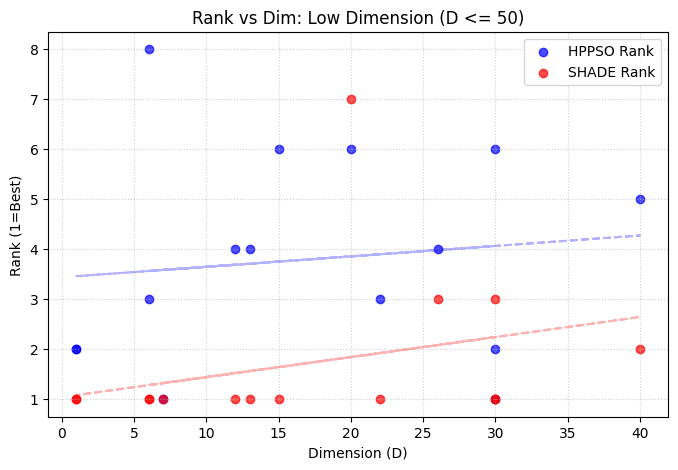


--- High Dimension (D > 50) (n=7) ---
HPPSO (Rank vs Dim): -0.3077 (p-value: 0.5020)
SHADE (Rank vs Dim): 0.5547 (p-value: 0.1962)
Avg Rank HPPSO: 3.29
Avg Rank SHADE: 1.43


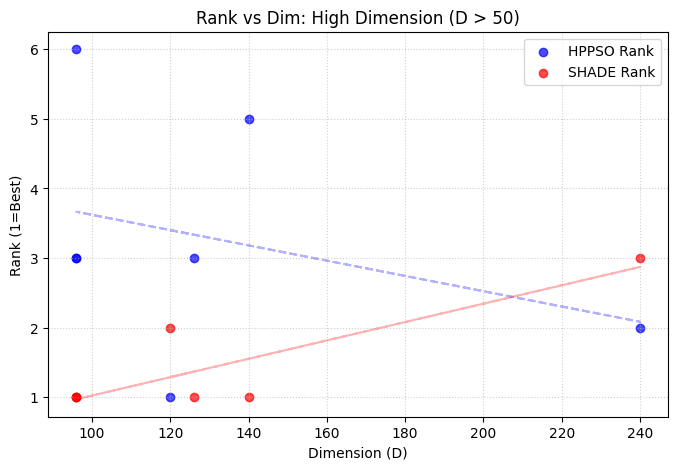

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 1. Setup and Cleaning
dims_mapping = {
    'T1': 6, 'T2': 30, 'T3': 1, 'T4': 1, 'T5': 30, 'T6': 30, 'T7': 20,
    'T8': 7, 'T9': 126, 'T10': 12, 'T11': 120, 'T12': 240, 'T13': 6,
    'T14': 13, 'T15': 15, 'T16': 40, 'T17': 140, 'T18': 96, 'T19': 96,
    'T20': 96, 'T21': 26, 'T22': 22
}

def clean_name(name):
    suffixes = ['_Modified', ' (Matlab-style)']
    for s in suffixes:
        name = name.replace(s, "")
    return name.strip()

all_algos = [k for k in all_benchmark_results.keys() if k != "CMA-ES"]
problem_names = sorted(list(dims_mapping.keys()))

data_list = []
for prob in problem_names:
    row = {'Problem': prob, 'Dim': dims_mapping.get(prob)}
    for algo in all_algos:
        if prob in all_benchmark_results[algo]:
            row[clean_name(algo)] = np.median(all_benchmark_results[algo][prob]['all_final_scores'])
    data_list.append(row)

df_all = pd.DataFrame(data_list).set_index('Problem')
cols_to_rank = [c for c in df_all.columns if c != 'Dim']
df_ranks = df_all[cols_to_rank].rank(axis=1, method='min', na_option='bottom')
df_combined = pd.concat([df_all[['Dim']], df_ranks], axis=1)

# 2. Split into Subgroups
df_low = df_combined[df_combined['Dim'] <= 50]
df_high = df_combined[df_combined['Dim'] > 50]

subgroups = [("Low Dimension (D <= 50)", df_low), ("High Dimension (D > 50)", df_high)]

for title, df_sub in subgroups:
    print(f"\n--- {title} (n={len(df_sub)}) ---")

    # Calculate Spearman Correlation
    corr_hppso, p_hppso = spearmanr(df_sub['Dim'], df_sub['HPPSO'])
    corr_shade, p_shade = spearmanr(df_sub['Dim'], df_sub['SHADE'])

    print(f"HPPSO (Rank vs Dim): {corr_hppso:.4f} (p-value: {p_hppso:.4f})")
    print(f"SHADE (Rank vs Dim): {corr_shade:.4f} (p-value: {p_shade:.4f})")

    # Average Rank in this subgroup
    print(f"Avg Rank HPPSO: {df_sub['HPPSO'].mean():.2f}")
    print(f"Avg Rank SHADE: {df_sub['SHADE'].mean():.2f}")

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.scatter(df_sub['Dim'], df_sub['HPPSO'], color='blue', label='HPPSO Rank', alpha=0.7)
    plt.scatter(df_sub['Dim'], df_sub['SHADE'], color='red', label='SHADE Rank', alpha=0.7)

    # Trendlines (only if more than 1 point exists)
    if len(df_sub) > 1:
        for color, algo in [('blue', 'HPPSO'), ('red', 'SHADE')]:
            m, b = np.polyfit(df_sub['Dim'], df_sub[algo], 1)
            plt.plot(df_sub['Dim'], m*df_sub['Dim'] + b, color=color, linestyle='--', alpha=0.3)

    plt.xlabel('Dimension (D)')
    plt.ylabel('Rank (1=Best)')
    plt.title(f'Rank vs Dim: {title}')
    plt.legend()
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.show()

In [ ]:
import pandas as pd
import numpy as np

# 1. Define groups based on D=50 threshold
low_dim_probs = [p for p, d in dims_mapping.items() if d <= 50]
high_dim_probs = [p for p, d in dims_mapping.items() if d > 50]

# 2. Function to calculate Average Rank for a specific subset of problems
def get_group_ranks(problem_list):
    # Filter the existing median dataframe for these problems
    df_subset = df_medians.loc[problem_list]
    # Rank only within this subset
    cols_to_rank = [c for c in df_subset.columns if c != 'Dim']
    ranks = df_subset[cols_to_rank].rank(axis=1, method='min', na_option='bottom')
    return ranks.mean().sort_values()

# 3. Calculate Results
low_dim_results = get_group_ranks(low_dim_probs)
high_dim_results = get_group_ranks(high_dim_probs)

# 4. Display Comparison
print(f"--- Comparison: Low Dim (n={len(low_dim_probs)}) vs High Dim (n={len(high_dim_probs)}) ---")
comparison_df = pd.DataFrame({
    'Low-D (≤50) Rank': low_dim_results,
    'High-D (>50) Rank': high_dim_results
})

# Sort by the High-D performance to see the shift
print(comparison_df.sort_values(by='High-D (>50) Rank'))

--- Comparison: Low Dim (n=15) vs High Dim (n=7) ---
        Low-D (≤50) Rank  High-D (>50) Rank
SHADE           1.600000           1.428571
CMA-ES          4.733333           2.000000
HPPSO           3.266667           2.857143
PSO             4.066667           4.285714
GWO             4.000000           4.857143
GA-MPC          3.466667           5.571429
CSA             6.200000           7.000000


In [ ]:
import numpy as np
import pandas as pd

# 1. Configuration
target_algo_key = 'CMA-ES (Matlab-style)'
penalty_value = 9.0

# 2. Replace NaN values with 9
if target_algo_key in all_benchmark_results:
    for prob in all_benchmark_results[target_algo_key]:
        scores = all_benchmark_results[target_algo_key][prob]['all_final_scores']

        # Convert to numpy array to handle NaNs
        scores_array = np.array(scores, dtype=float)

        # Count NaNs before replacement for reporting
        nan_count = np.isnan(scores_array).sum()

        if nan_count > 0:
            scores_array[np.isnan(scores_array)] = penalty_value
            # Update the dictionary with the cleaned scores
            all_benchmark_results[target_algo_key][prob]['all_final_scores'] = scores_array.tolist()
            # Recalculate average for consistency
            all_benchmark_results[target_algo_key][prob]['avg_final_score'] = np.mean(scores_array)

    print(f"Success: NaN values in '{target_algo_key}' have been replaced with {penalty_value}.")
else:
    print(f"Error: Algorithm key '{target_algo_key}' not found.")

# 3. Re-run the Ranking Analysis (Cleaned Names)
def clean_name(name):
    suffixes = ['_Modified', ' (Matlab-style)']
    for s in suffixes:
        name = name.replace(s, "")
    return name.strip()

# Get filtered algorithm list (keeping the Matlab-style CMA-ES)
filtered_algos = [a for a in all_benchmark_results.keys()]

problem_names = sorted(list(all_benchmark_results[filtered_algos[0]].keys()))
median_table = []

for prob in problem_names:
    row = {'Problem': prob}
    for algo in filtered_algos:
        if prob in all_benchmark_results[algo]:
            # Use the cleaned/imputed scores
            scores = all_benchmark_results[algo][prob]['all_final_scores']
            row[clean_name(algo)] = np.median(scores)
    median_table.append(row)

df_medians = pd.DataFrame(median_table).set_index('Problem')
df_ranks = df_medians.rank(axis=1, method='min')
average_ranks = df_ranks.mean().sort_values()

# Display updated results
print("\n### Updated Average Ranking (After NaN Imputation) ###")
print("-" * 45)
for algo, rank in average_ranks.items():
    print(f"{algo:<25} | {rank:<12.2f}")

Success: NaN values in 'CMA-ES (Matlab-style)' have been replaced with 9.0.

### Updated Average Ranking (After NaN Imputation) ###
---------------------------------------------
SHADE                     | 1.68        
HPPSO                     | 3.68        
CMA-ES                    | 4.05        
Original PSO              | 4.95        
GWO                       | 5.05        
PSO-RIW                   | 5.09        
GA-MPC                    | 5.18        
PSO-m                     | 5.86        
CSA                       | 8.41        


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import friedmanchisquare

# 1. Cleaning function
def clean_name(name):
    suffixes = ['_Modified', ' (Matlab-style)']
    for s in suffixes:
        name = name.replace(s, "")
    return name.strip()

# 2. Identify all unique problems across ALL algorithms
all_probs = set()
for algo_key in all_benchmark_results.keys():
    all_probs.update(all_benchmark_results[algo_key].keys())
problems = sorted(list(all_probs))

# 3. Filter keys (Exclude the plain 'CMA-ES' as requested)
filtered_keys = [k for k in all_benchmark_results.keys() if k != "CMA-ES"]

# 4. Build Median Table with Safety Check
median_data = []
for prob in problems:
    row = {'Problem': prob}
    for algo_key in filtered_keys:
        # CHECK: Does this algorithm have this problem?
        if prob in all_benchmark_results[algo_key]:
            scores = all_benchmark_results[algo_key][prob]['all_final_scores']
            row[clean_name(algo_key)] = np.median(scores)
        else:
            # If missing, assign NaN (will be ranked last)
            row[clean_name(algo_key)] = np.nan
    median_data.append(row)

# 5. Create DataFrames
df_medians = pd.DataFrame(median_data).set_index('Problem')

# Rank 1 is best. na_option='bottom' ensures missing problems get the worst rank.
df_ranks = df_medians.rank(axis=1, method='min', na_option='bottom')

# 6. Friedman Test (Only use problems where ALL algorithms have data)
df_clean_for_friedman = df_medians.dropna()
if len(df_clean_for_friedman) > 1:
    algo_performance_lists = [df_clean_for_friedman[col].values for col in df_clean_for_friedman.columns]
    stat, p_value = friedmanchisquare(*algo_performance_lists)
    print(f"Friedman Statistic: {stat:.4f}, p-value: {p_value:.4e}")
else:
    print("Warning: Not enough common problems across all algorithms to run Friedman test.")

# 7. Final Average Rankings
print("\n### Final Average Rankings (Lower is Better) ###")
print(df_ranks.mean().sort_values())

Friedman Statistic: 72.4778, p-value: 1.5756e-12

### Final Average Rankings (Lower is Better) ###
SHADE           1.636364
HPPSO           3.636364
CMA-ES          4.590909
Original PSO    4.909091
GWO             4.954545
PSO-RIW         5.000000
GA-MPC          5.045455
PSO-m           5.818182
CSA             8.363636
dtype: float64


In [ ]:
import scikit_posthocs as sp

# 1. Prepare data (algorithms as columns, problems as rows)
# We use the cleaned dataframe from the previous step
data = df_clean_for_friedman.values

# 2. Run Nemenyi post-hoc test
# This creates a pairwise matrix of p-values
nemenyi_matrix = sp.posthoc_nemenyi_friedman(data)

# 3. Look specifically at HPPSO vs others
hppso_comparisons = nemenyi_matrix['HPPSO_Modified']
print("Nemenyi p-values (HPPSO vs others):")
print(hppso_comparisons.sort_values())

KeyError: 'HPPSO_Modified'

In [ ]:
nemenyi_matrix

,0,1,2,3,4,5,6,7,8
0,1.000000,1.899786e-02,0.998024,2.303534e-04,0.999946,0.923232,0.999411,0.987602,0.999999
1,0.018998,1.000000e+00,0.163935,9.281464e-14,0.003509,0.000077,0.001746,0.270180,0.006813
2,0.998024,1.639346e-01,1.000000,5.297358e-06,0.954059,0.488170,0.903592,1.000000,0.982079
3,0.000230,9.281464e-14,0.000005,1.000000e+00,0.001746,0.040009,0.003509,0.000001,0.000840
4,0.999946,3.509257e-03,0.954059,1.745739e-03,1.000000,0.994632,1.000000,0.881012,1.000000
5,0.923232,7.678250e-05,0.488170,4.000915e-02,0.994632,1.000000,0.998888,0.336197,0.982079
6,0.999411,1.745739e-03,0.903592,3.509257e-03,1.000000,0.998888,1.000000,0.796027,0.999994
7,0.987602,2.701801e-01,1.000000,1.478505e-06,0.881012,0.336197,0.796027,1.000000,0.940007
8,0.999999,6.813083e-03,0.982079,8.395363e-04,1.000000,0.982079,0.999994,0.940007,1.000000


/tmp/ipykernel_9103/3450080495.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(algorithm_names)).colors if algorithm_names else []


Generating convergence history plots for all CEC2011 problems...


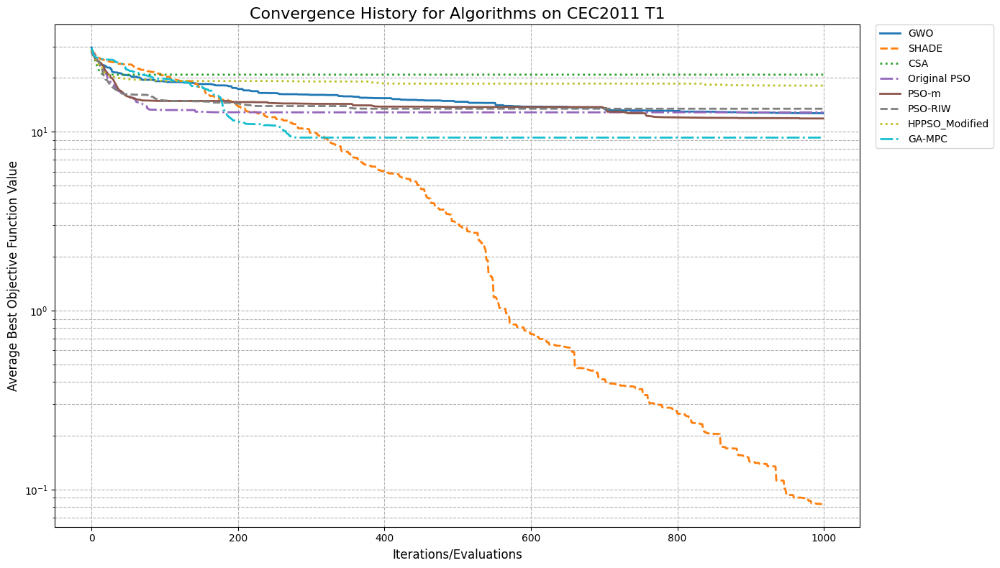

Plot for T1 generated.


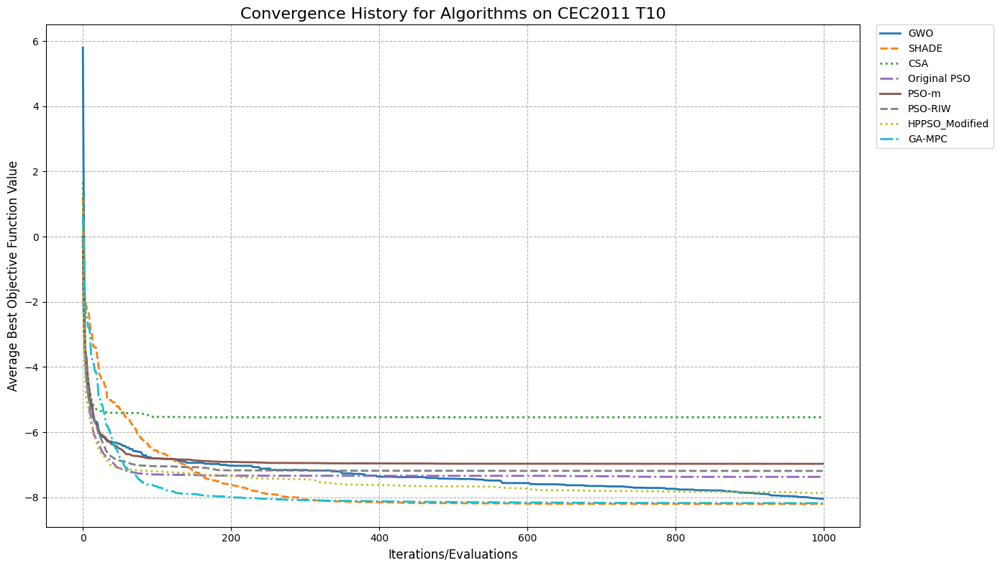

Plot for T10 generated.


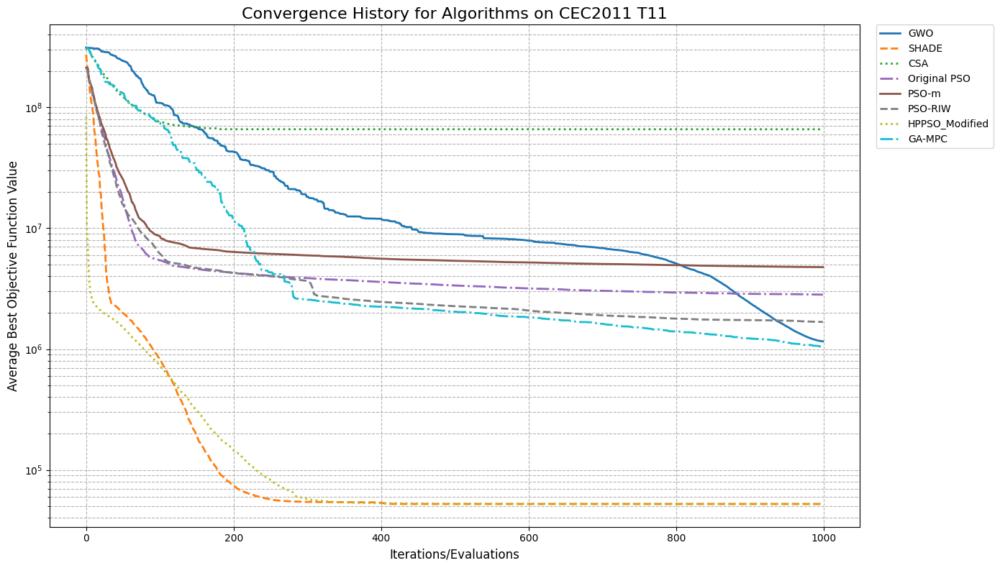

Plot for T11 generated.


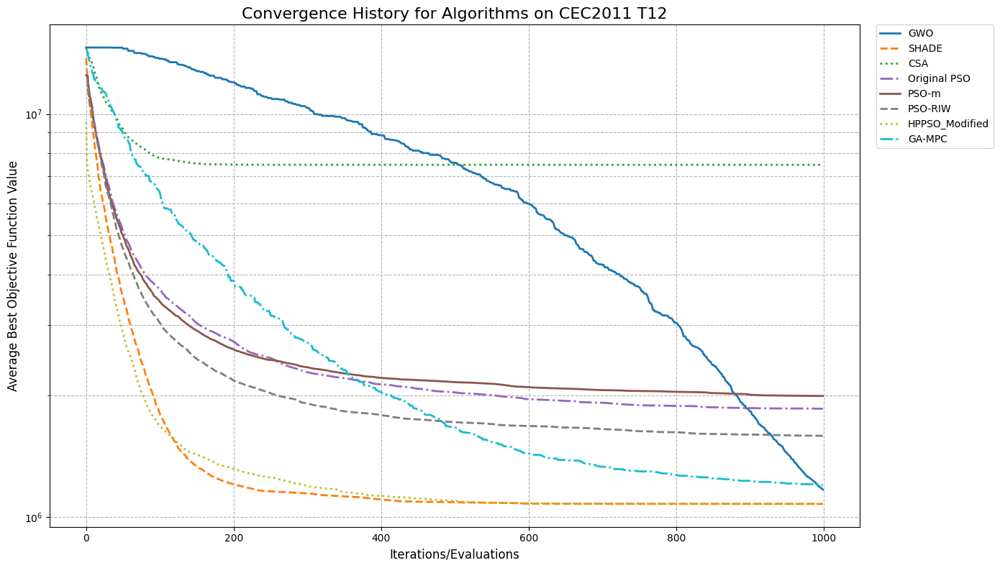

Plot for T12 generated.


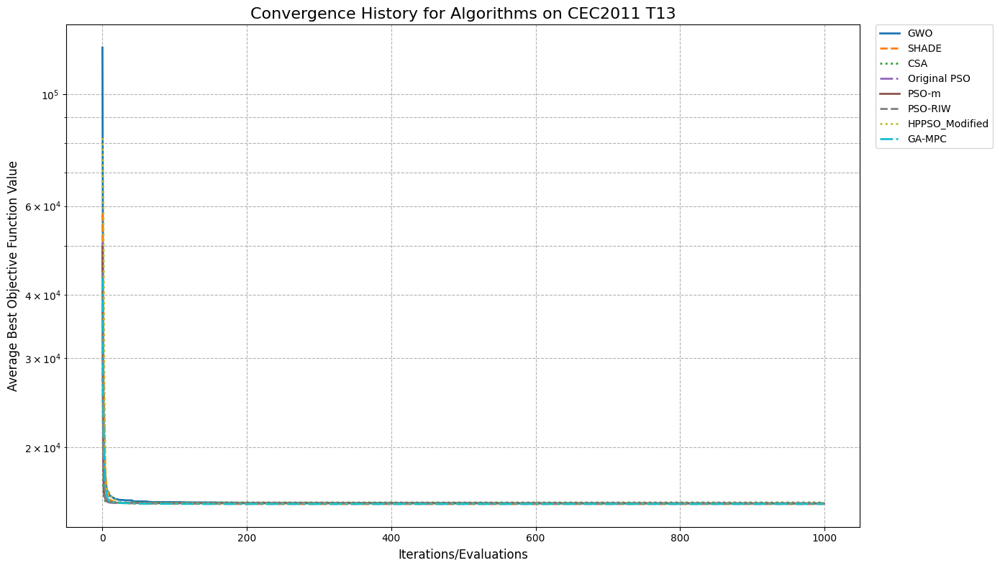

Plot for T13 generated.


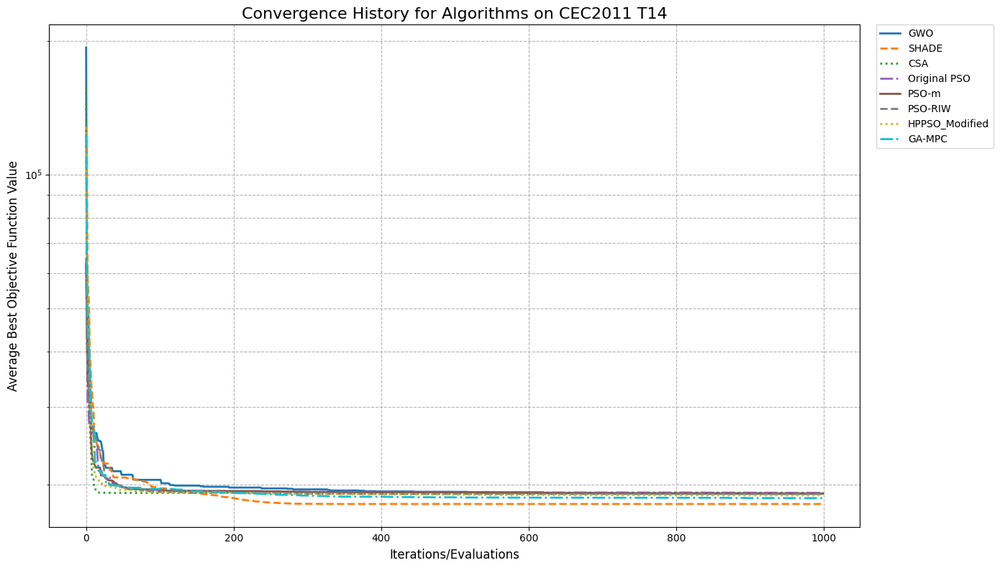

Plot for T14 generated.


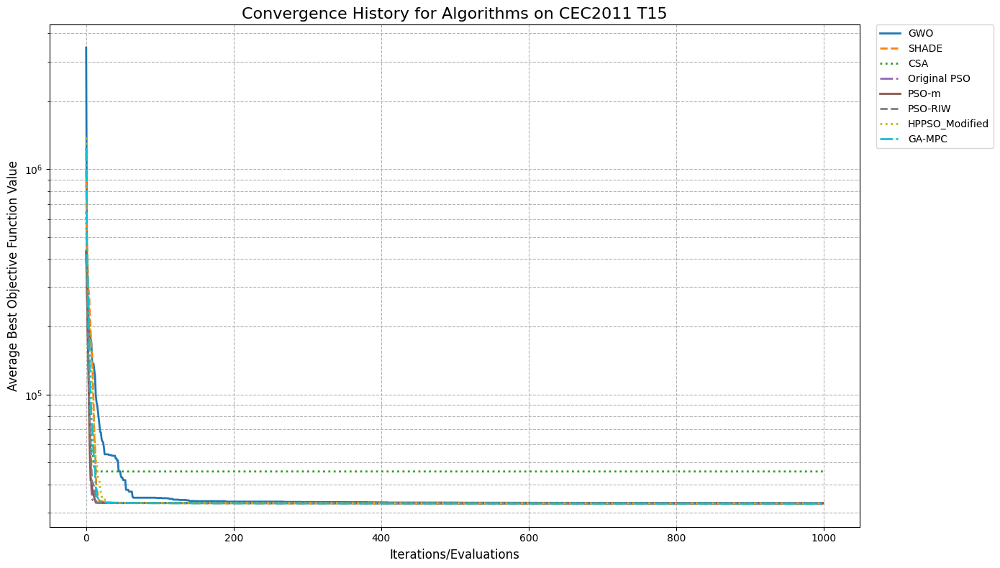

Plot for T15 generated.


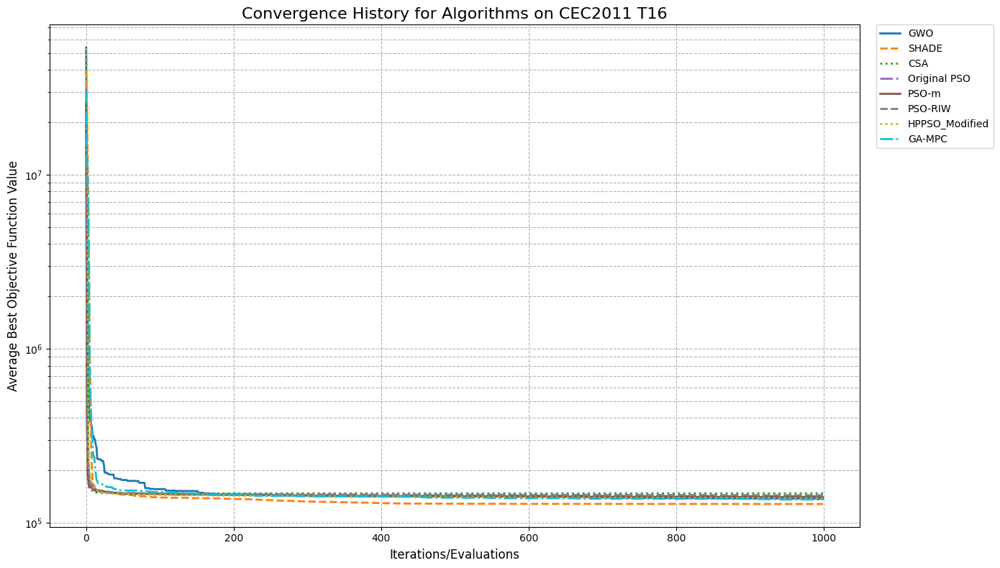

Plot for T16 generated.


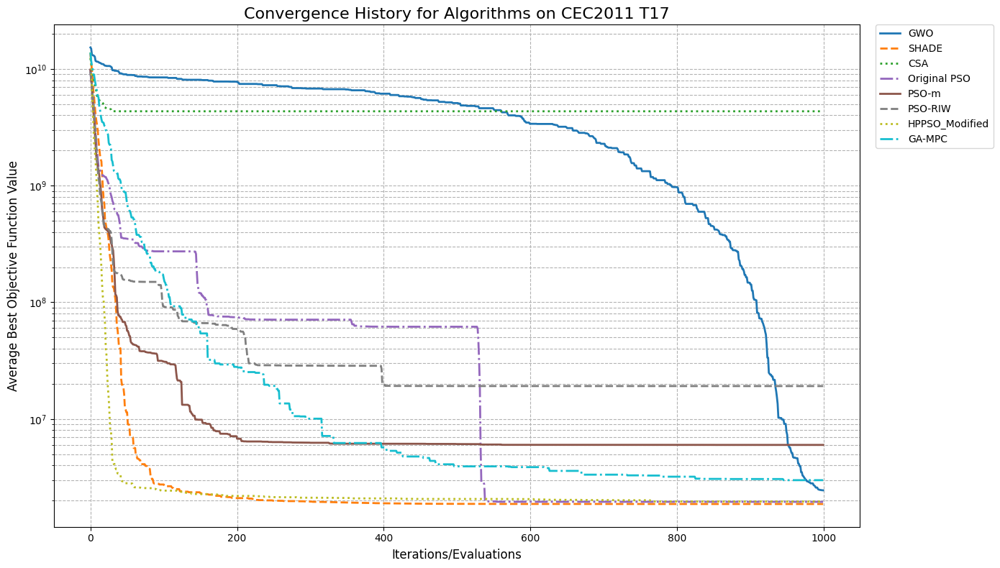

Plot for T17 generated.


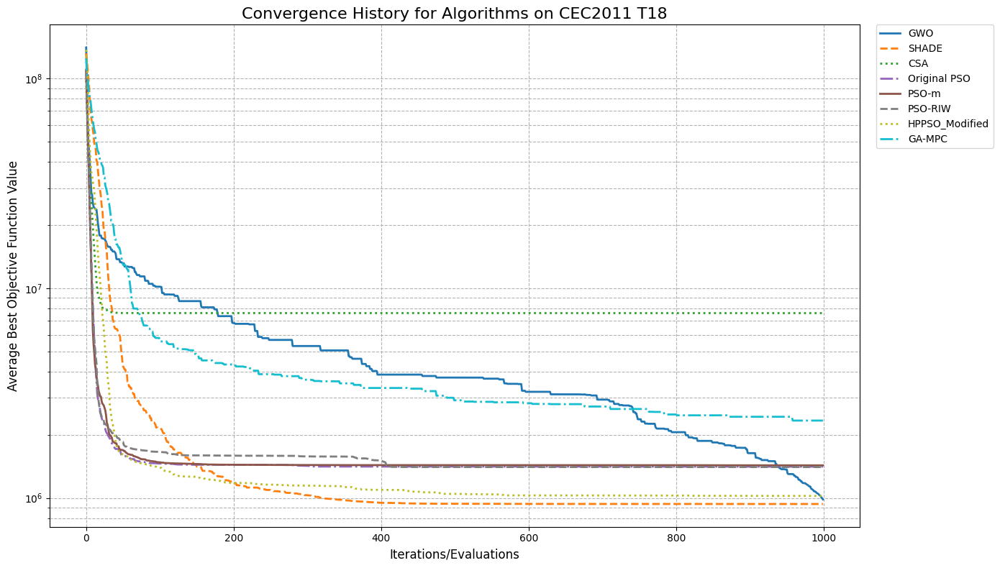

Plot for T18 generated.


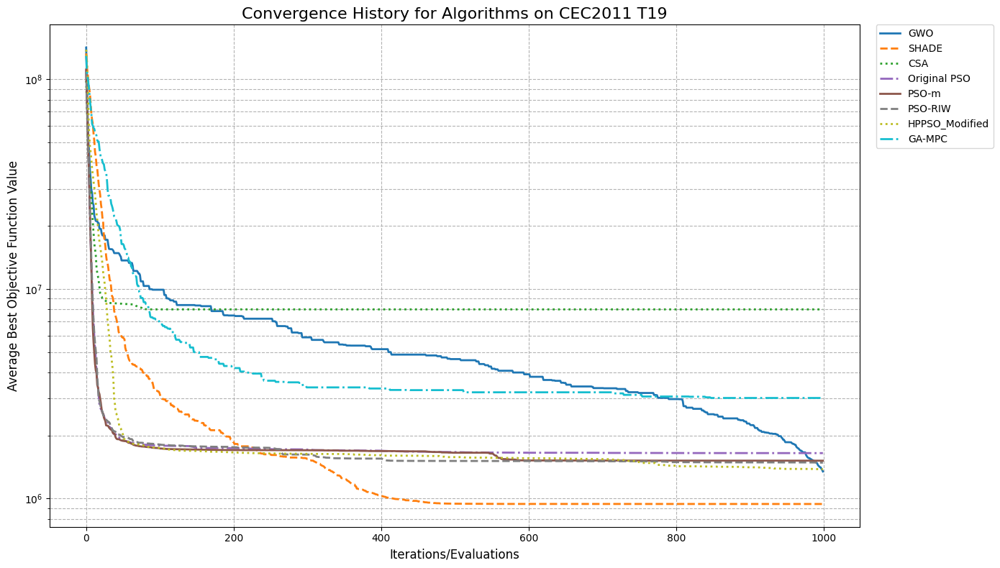

Plot for T19 generated.


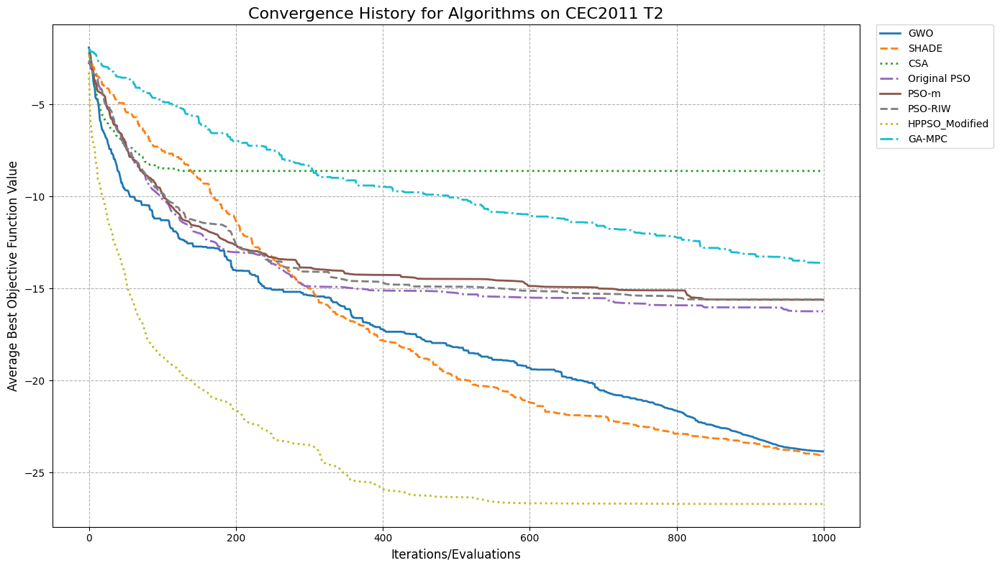

Plot for T2 generated.


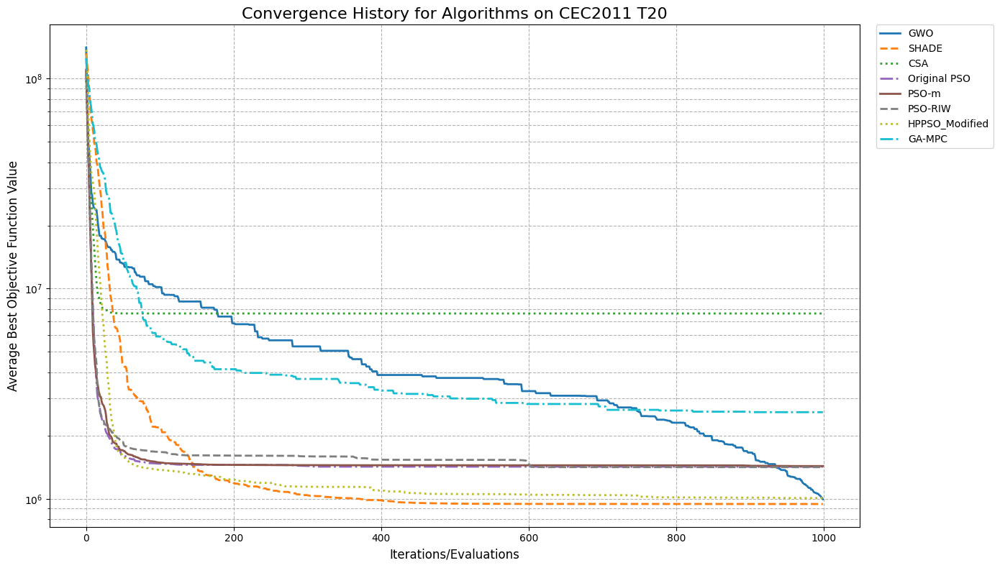

Plot for T20 generated.


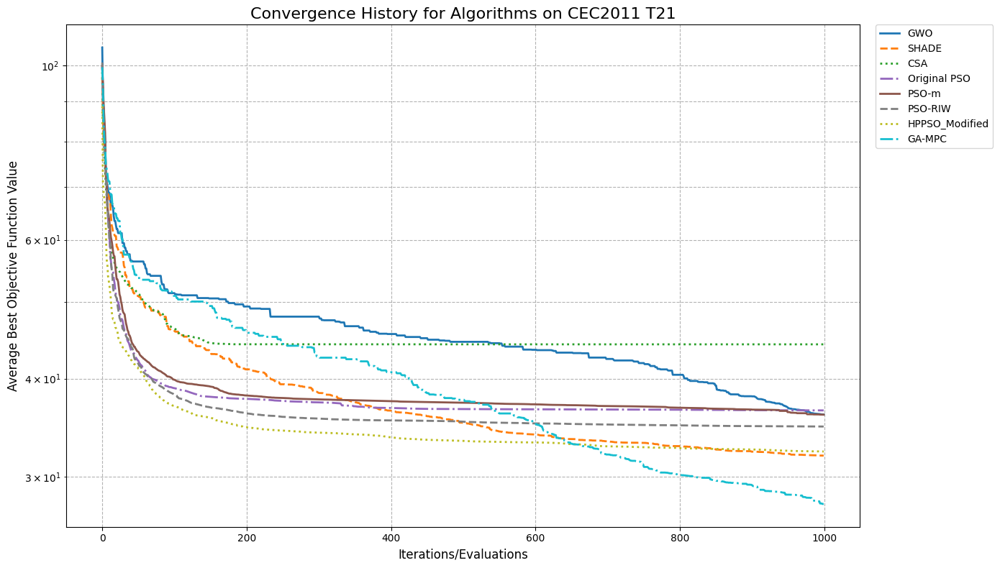

Plot for T21 generated.


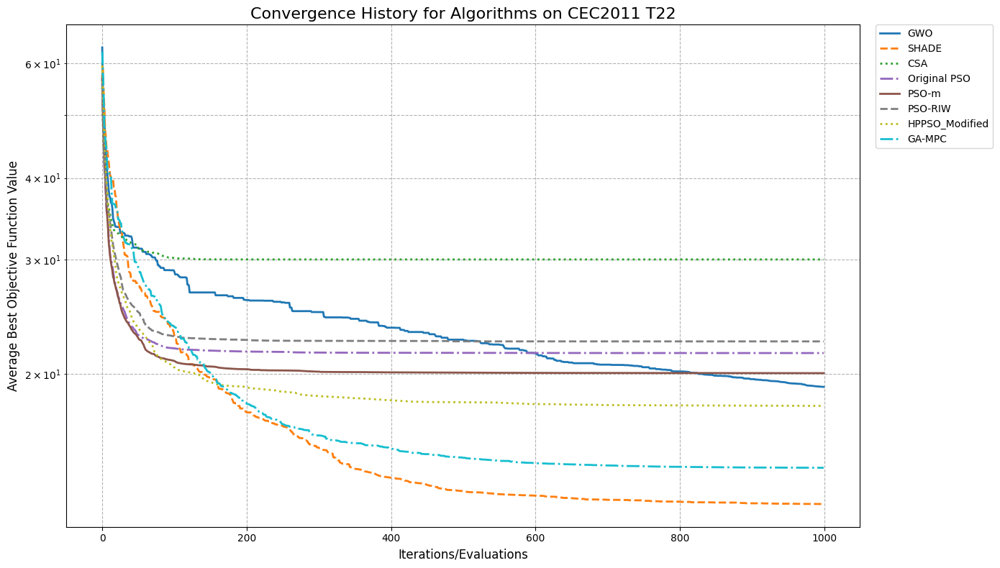

Plot for T22 generated.


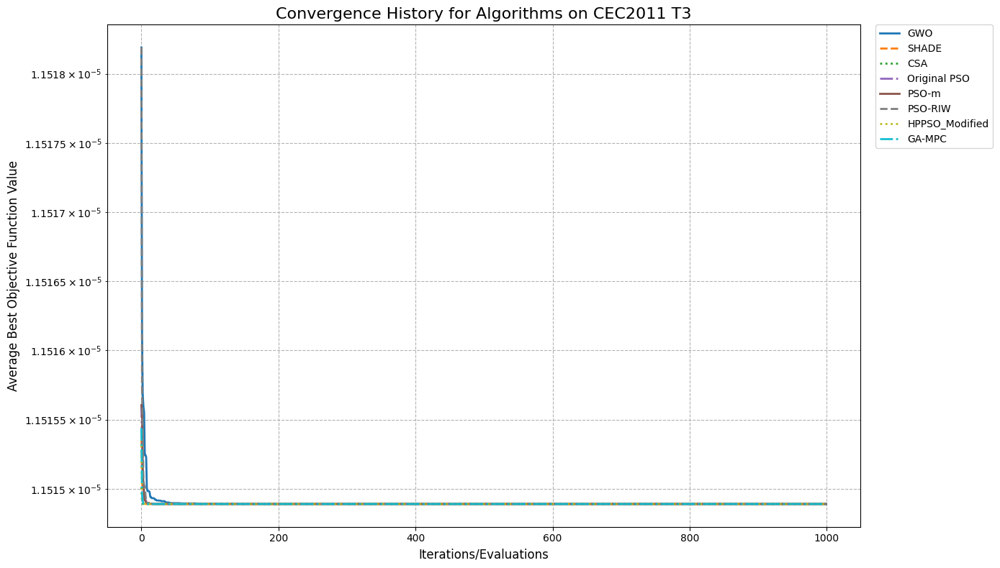

Plot for T3 generated.


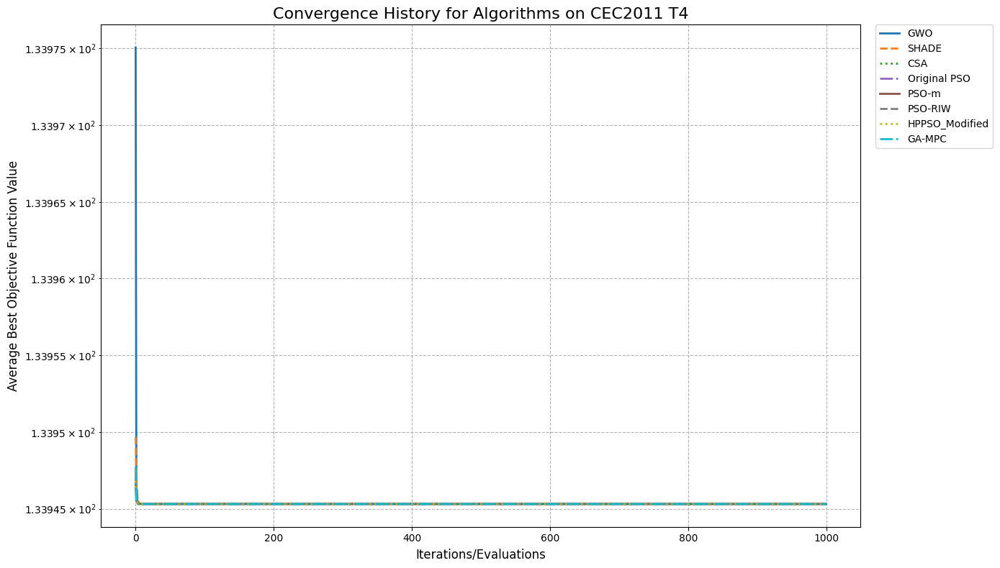

Plot for T4 generated.


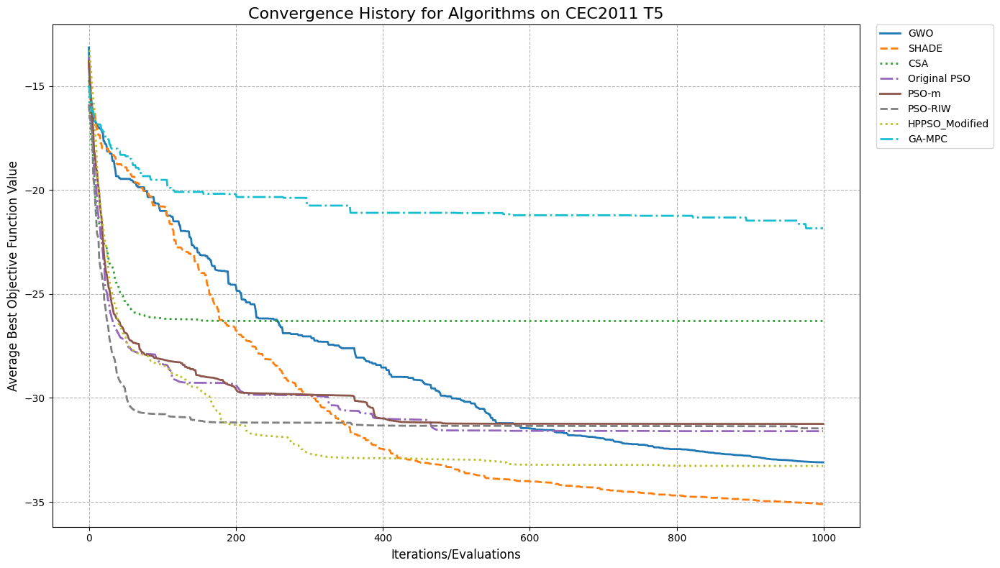

Plot for T5 generated.


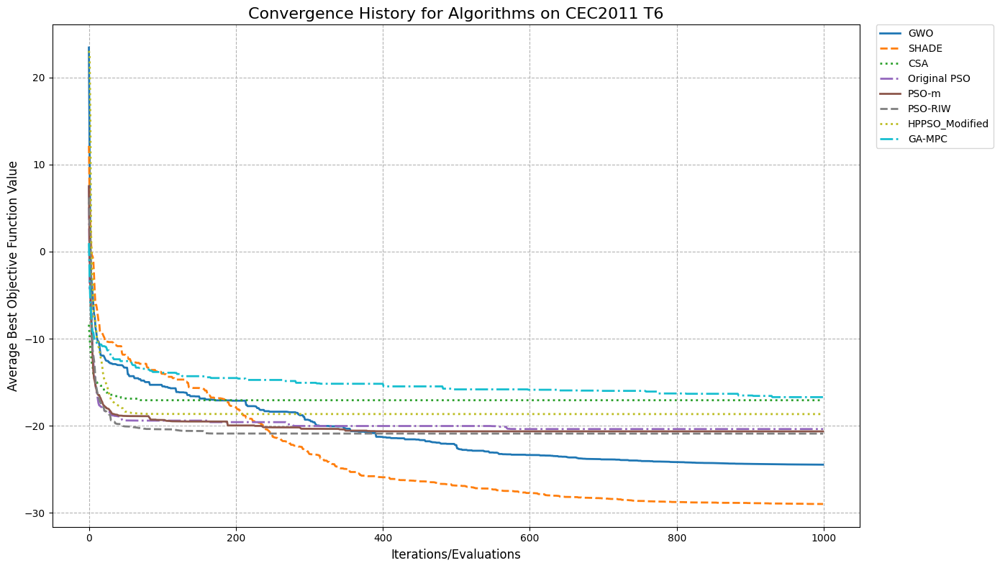

Plot for T6 generated.


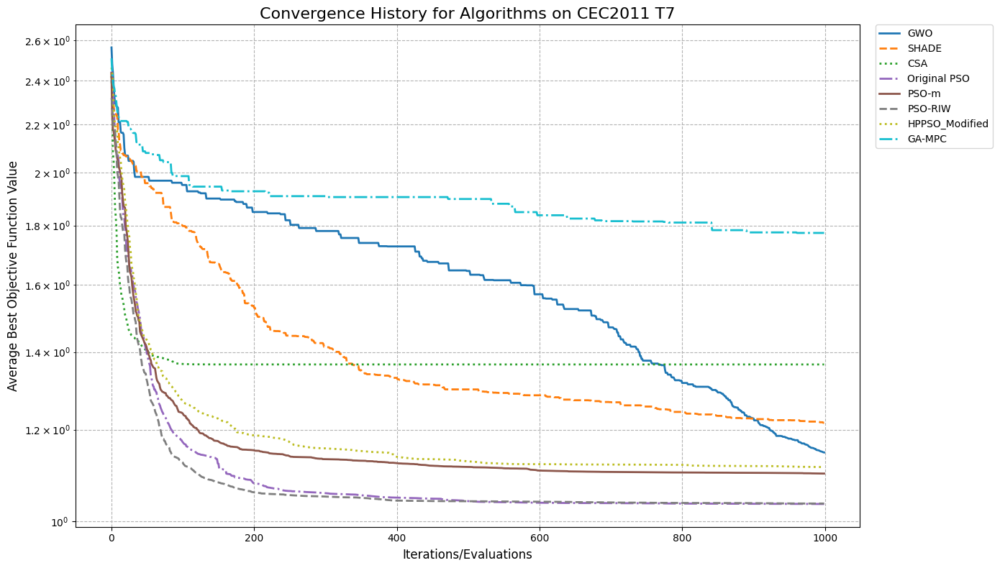

Plot for T7 generated.


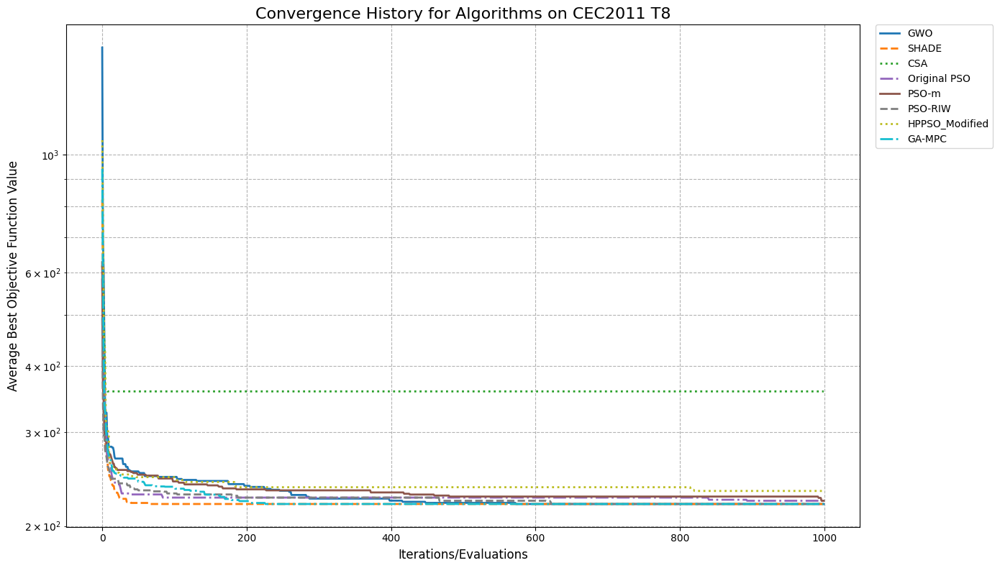

Plot for T8 generated.


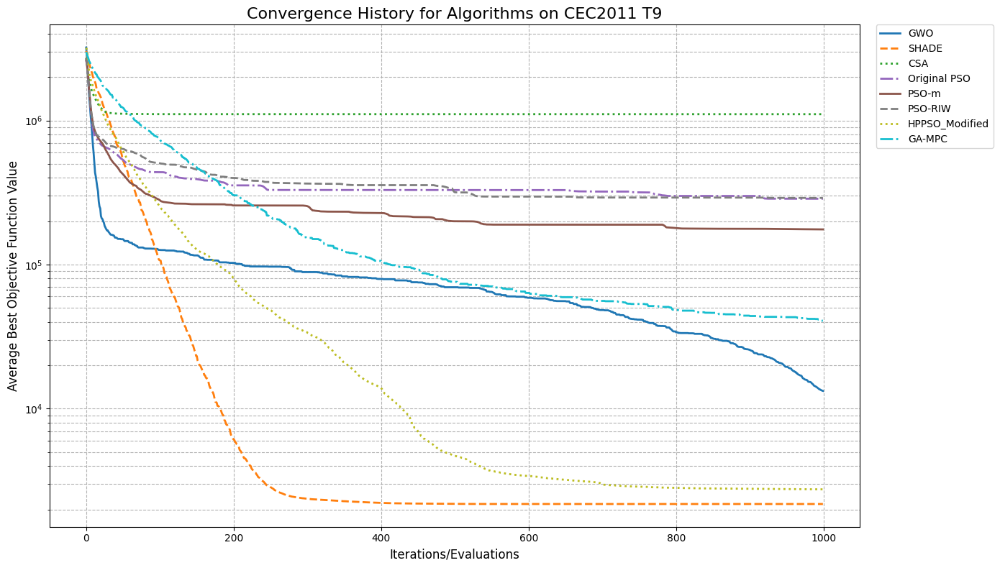

Plot for T9 generated.
All convergence history plots generated.


In [ ]:
# Define BENCHMARK_PROBLEMS if not already defined from previous cells
# This is crucial for plotting all problems correctly
if 'BENCHMARK_PROBLEMS' not in globals():
    # Fallback if the cell defining BENCHMARK_PROBLEMS was not run or kernel reset
    # Extract problem names from the loaded results if possible
    if all_benchmark_results:
        # Get the first algorithm's results and extract problem names
        first_algo_results = next(iter(all_benchmark_results.values()))
        BENCHMARK_PROBLEMS = sorted(list(first_algo_results.keys()))
        print(f"BENCHMARK_PROBLEMS inferred from loaded data: {BENCHMARK_PROBLEMS}")
    else:
        # Default list if no data loaded
        BENCHMARK_PROBLEMS = [f"T{i}" for i in range(1, 23)]
        print(f"BENCHMARK_PROBLEMS set to default: {BENCHMARK_PROBLEMS}")

# Use a consistent set of line styles, markers, and colors
line_styles = ['-', '--', ':', '-.']
markers = ['o', 's', '^', 'D', 'p', '*', 'h', '+', 'x']

# Get a colormap with enough distinct colors for all algorithms
# Ensure 'algorithms' is correctly populated from all_benchmark_results keys
algorithm_names = [algo for algo in list(all_benchmark_results.keys()) if 'CMA-ES' not in algo]
colors = plt.cm.get_cmap('tab10', len(algorithm_names)).colors if algorithm_names else []

print("Generating convergence history plots for all CEC2011 problems...")

# Iterate through each problem
for problem_name in BENCHMARK_PROBLEMS:
    plt.figure(figsize=(14, 8))
    plt.title(f'Convergence History for Algorithms on CEC2011 {problem_name}', fontsize=16)
    plt.xlabel('Iterations/Evaluations', fontsize=12)
    plt.ylabel('Average Best Objective Function Value', fontsize=12)
    plt.grid(True, which="both", ls="--", c='0.7')

    # Attempt to use log scale, but handle cases where data might be non-positive
    # To avoid 'UserWarning: Data has no positive values, and therefore cannot be log-scaled.'
    # Check if all relevant history values for this problem are positive across all algos
    all_positive = True
    for algo_name in algorithm_names:
        if problem_name in all_benchmark_results[algo_name] and all_benchmark_results[algo_name][problem_name]["avg_history"]:
            history = np.array(all_benchmark_results[algo_name][problem_name]["avg_history"])
            if np.any(history <= 0):
                all_positive = False
                break
    if all_positive:
        plt.yscale('log')
    else:
        print(f"Warning: Not using log scale for {problem_name} as some values are non-positive.")

    algo_idx = 0
    # Iterate through each algorithm's results
    for algo_name in algorithm_names:
        results = all_benchmark_results[algo_name]
        if problem_name in results and results[problem_name]["avg_history"]:
            history = results[problem_name]["avg_history"]
            # Ensure history is not empty and has valid data before plotting
            if history and not np.all(np.isnan(history)):
                plt.plot(
                    history,
                    label=f'{algo_name}',
                    color=colors[algo_idx % len(colors)] if len(colors) > 0 else 'black', # FIX: Changed 'if colors' to 'if len(colors) > 0'
                    linestyle=line_styles[algo_idx % len(line_styles)],
                    linewidth=2
                )
            algo_idx += 1

    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., fontsize=10)
    plt.tight_layout()
    plt.show()
    print(f"Plot for {problem_name} generated.")

print("All convergence history plots generated.")

In [ ]:
import pandas as pd
import numpy as np

# Prepare data for the table
table_data = {}
for algo_name, problems_results in all_benchmark_results.items():
    table_data[algo_name] = {}
    for problem_name in BENCHMARK_PROBLEMS:
        if problem_name in problems_results:
            table_data[algo_name][problem_name] = problems_results[problem_name]["avg_final_score"]
        else:
            table_data[algo_name][problem_name] = np.nan # Use NaN for problems not run or failed

# Create a DataFrame
df_scores = pd.DataFrame(table_data)

# Optional: Sort columns (problems) for better readability if desired
df_scores = df_scores[sorted(df_scores.columns)]

print("\nAverage Final Scores Across All Algorithms and Problems:")
display(df_scores)


Average Final Scores Across All Algorithms and Problems:


,CMA-ES,CMA-ES (Matlab-style),CSA,GA-MPC,GWO,HPPSO_Modified,Original PSO,PSO-RIW,PSO-m,SHADE
T1,23.128668,1.375172e+01,2.087529e+01,9.287889e+00,1.270994e+01,1.813107e+01,1.285454e+01,1.346650e+01,1.187966e+01,8.310634e-02
T10,16.050112,-6.799784e-01,-5.541769e+00,-8.176920e+00,-8.042997e+00,-7.865070e+00,-7.369995e+00,-7.188586e+00,-6.969665e+00,-8.202350e+00
T11,52657.609103,5.208028e+04,6.595114e+07,1.046449e+06,1.158373e+06,5.234382e+04,2.822019e+06,1.675850e+06,4.767823e+06,5.222336e+04
T12,NaN,1.070599e+06,7.482788e+06,1.199274e+06,1.169020e+06,1.076828e+06,1.855446e+06,1.590083e+06,1.996445e+06,1.077707e+06
T13,NaN,1.548468e+04,1.554791e+04,1.544419e+04,1.547838e+04,1.546911e+04,1.549054e+04,1.548728e+04,1.548542e+04,1.544419e+04
T14,NaN,1.808702e+04,1.918871e+04,1.868039e+04,1.911698e+04,1.894388e+04,1.920006e+04,1.907087e+04,1.911257e+04,1.811992e+04
T15,NaN,3.272998e+04,4.561684e+04,3.283170e+04,3.303068e+04,3.296627e+04,3.296028e+04,3.296776e+04,3.294411e+04,3.273082e+04
T16,NaN,1.244157e+05,1.477542e+05,1.361495e+05,1.376455e+05,1.384073e+05,1.424601e+05,1.439377e+05,1.404353e+05,1.282946e+05
T17,NaN,1.938585e+06,4.333206e+09,2.990910e+06,2.447936e+06,1.961677e+06,1.949817e+06,1.914373e+07,5.995907e+06,1.868783e+06
T18,NaN,9.424132e+05,7.607048e+06,2.338100e+06,9.833472e+05,1.020828e+06,1.409403e+06,1.403451e+06,1.429769e+06,9.354824e+05


In [ ]:
import pandas as pd
import numpy as np

# Assuming df_scores DataFrame is already available from previous steps

best_algorithms_per_problem = {}

print("Best Performing Algorithm for Each Problem (Minimization):")
print("--------------------------------------------------------")

for index, row in df_scores.iterrows():
    problem_name = index
    # Drop NaN values before finding the minimum to avoid issues with problems not run by all algos
    valid_scores = row.dropna()
    if not valid_scores.empty:
        best_algo = valid_scores.idxmin()
        best_score = valid_scores.min()
        best_algorithms_per_problem[problem_name] = {
            "best_algorithm": best_algo,
            "best_score": best_score
        }
        print(f"Problem {problem_name}: {best_algo} (Score: {best_score:.5e})")
    else:
        print(f"Problem {problem_name}: No valid scores found.")

# Optional: Display as a DataFrame for better readability
best_per_problem_df = pd.DataFrame.from_dict(best_algorithms_per_problem, orient='index')
best_per_problem_df.index.name = 'Problem'
display(best_per_problem_df)

Best Performing Algorithm for Each Problem (Minimization):
--------------------------------------------------------
Problem T1: SHADE (Score: 8.31063e-02)
Problem T10: SHADE (Score: -8.20235e+00)
Problem T11: CMA-ES (Matlab-style) (Score: 5.20803e+04)
Problem T12: CMA-ES (Matlab-style) (Score: 1.07060e+06)
Problem T13: SHADE (Score: 1.54442e+04)
Problem T14: CMA-ES (Matlab-style) (Score: 1.80870e+04)
Problem T15: CMA-ES (Matlab-style) (Score: 3.27300e+04)
Problem T16: CMA-ES (Matlab-style) (Score: 1.24416e+05)
Problem T17: SHADE (Score: 1.86878e+06)
Problem T18: SHADE (Score: 9.35482e+05)
Problem T19: SHADE (Score: 9.41795e+05)
Problem T2: CMA-ES (Score: -2.67262e+01)
Problem T20: SHADE (Score: 9.44489e+05)
Problem T21: GA-MPC (Score: 2.77182e+01)
Problem T22: SHADE (Score: 1.26304e+01)
Problem T3: SHADE (Score: 1.15149e-05)
Problem T4: Original PSO (Score: 1.33945e+02)
Problem T5: SHADE (Score: -3.51028e+01)
Problem T6: SHADE (Score: -2.89793e+01)
Problem T7: CMA-ES (Matlab-style) (Sc

,best_algorithm,best_score
Problem,,
T1,SHADE,8.310634e-02
T10,SHADE,-8.202350e+00
T11,CMA-ES (Matlab-style),5.208028e+04
T12,CMA-ES (Matlab-style),1.070599e+06
T13,SHADE,1.544419e+04
T14,CMA-ES (Matlab-style),1.808702e+04
T15,CMA-ES (Matlab-style),3.272998e+04
T16,CMA-ES (Matlab-style),1.244157e+05
T17,SHADE,1.868783e+06


In [ ]:
import sys
!{sys.executable} -m pip install scikit-posthocs

In [ ]:
import scikit_posthocs as sp # Import after ensuring installation
import pandas as pd
import numpy as np
from scipy.stats import friedmanchisquare, rankdata

# Assuming df_scores is already available from previous steps

print("\nPerforming Statistical Significance Tests (excluding only 'CMA-ES' algorithm)...")

# Filter out only 'CMA-ES' algorithm, retain 'CMA-ES (Matlab-style)'
columns_to_exclude = ['CMA-ES']
df_scores_filtered = df_scores.drop(columns=columns_to_exclude, errors='ignore')

# Prepare data for Friedman test
df_friedman_cleaned_filtered = df_scores_filtered.dropna() # Remove any problem (row) where at least one algorithm has a NaN score

if df_friedman_cleaned_filtered.empty:
    print("No common problems found for all non-CMA-ES algorithms after dropping NaNs. Cannot perform Friedman test.")
else:
    # Extract the data as a list of arrays/series, where each element corresponds to an algorithm's scores across problems
    data_for_friedman_filtered = [df_friedman_cleaned_filtered[col].values for col in df_friedman_cleaned_filtered.columns]

    print(f"Performing Friedman test on {len(df_friedman_cleaned_filtered.columns)} algorithms across {len(df_friedman_cleaned_filtered)} problems.")
    print(f"Problems included: {list(df_friedman_cleaned_filtered.index.values)}")

    # Perform Friedman test
    stat, p = friedmanchisquare(*data_for_friedman_filtered)

    print(f"\nFriedman Test Results (excluding only 'CMA-ES' algorithm):")
    print(f"  Statistic = {stat:.4f}")
    print(f"  p-value   = {p:.4f}")

    alpha = 0.05 # Significance level

    if p < alpha:
        print(f"  Since p-value ({p:.4f}) < alpha ({alpha}), there is a statistically significant difference between the algorithms.")
        print("\nProceeding with Nemenyi Post-Hoc Test...")

        # Nemenyi test requires ranks, or directly the scores if using scikit_posthocs
        nemenyi_results = sp.posthoc_nemenyi_friedman(df_friedman_cleaned_filtered.values)
        nemenyi_results.columns = df_friedman_cleaned_filtered.columns
        nemenyi_results.index = df_friedman_cleaned_filtered.columns

        print("\nNemenyi Post-Hoc Test p-values (alpha = 0.05):")
        display(nemenyi_results)

        # Highlight significant pairs
        significant_pairs = nemenyi_results[nemenyi_results < alpha].stack().reset_index()
        significant_pairs = significant_pairs[significant_pairs['level_0'] < significant_pairs['level_1']] # Remove duplicates and self-comparisons
        if not significant_pairs.empty:
            print("\nStatistically Significant Pairs (p < 0.05):")
            display(significant_pairs)
        else:
            print("No statistically significant pairs found by Nemenyi test at alpha = 0.05.")

    else:
        print(f"  Since p-value ({p:.4f}) >= alpha ({alpha}), there is no statistically significant difference between the algorithms.")
        print("Nemenyi Post-Hoc Test will not be performed as Friedman test was not significant.")

    # --- Algorithm Ranking based on Average Ranks (excluding only 'CMA-ES' algorithm) ---
    if not df_friedman_cleaned_filtered.empty:
        print("\n--- Algorithm Ranking based on Average Ranks (excluding only 'CMA-ES' algorithm) ---")
        # Calculate ranks for each problem (row) and then average them for each algorithm (column)
        # For minimization, lower score means better rank (rank 1 is best)
        ranks = df_friedman_cleaned_filtered.apply(lambda x: rankdata(x, method='average'), axis=1)
        ranks.columns = df_friedman_cleaned_filtered.columns

        avg_ranks = ranks.mean().sort_values()

        print("\nAverage Ranks of Algorithms (1 = Best Performance):\n")
        display(avg_ranks.to_frame(name='Average Rank'))
    else:
        print("Cannot perform ranking as no common problems were found for all non-CMA-ES algorithms.")



Performing Statistical Significance Tests (excluding only 'CMA-ES' algorithm)...
Performing Friedman test on 9 algorithms across 20 problems.
Problems included: ['T1', 'T10', 'T11', 'T12', 'T13', 'T14', 'T15', 'T16', 'T17', 'T18', 'T19', 'T2', 'T20', 'T21', 'T22', 'T5', 'T6', 'T7', 'T8', 'T9']

Friedman Test Results (excluding only 'CMA-ES' algorithm):
  Statistic = 72.6229
  p-value   = 0.0000
  Since p-value (0.0000) < alpha (0.05), there is a statistically significant difference between the algorithms.

Proceeding with Nemenyi Post-Hoc Test...

Nemenyi Post-Hoc Test p-values (alpha = 0.05):


,CMA-ES (Matlab-style),CSA,GA-MPC,GWO,HPPSO_Modified,Original PSO,PSO-RIW,PSO-m,SHADE
CMA-ES (Matlab-style),1.000000,7.227364e-06,0.995748,1.000000,1.000000,0.549058,0.669783,0.549058,1.752788e-01
CSA,0.000007,1.000000e+00,0.000445,0.000015,0.000007,0.036591,0.020930,0.036591,1.855183e-13
GA-MPC,0.995748,4.447460e-04,1.000000,0.998888,0.995748,0.965588,0.987602,0.965588,1.560300e-02
GWO,1.000000,1.548356e-05,0.998888,1.000000,1.000000,0.650119,0.762464,0.650119,1.238911e-01
HPPSO_Modified,1.000000,7.227364e-06,0.995748,1.000000,1.000000,0.549058,0.669783,0.549058,1.752788e-01
Original PSO,0.549058,3.659146e-02,0.965588,0.650119,0.549058,1.000000,1.000000,1.000000,1.339296e-04
PSO-RIW,0.669783,2.092994e-02,0.987602,0.762464,0.669783,1.000000,1.000000,1.000000,3.005011e-04
PSO-m,0.549058,3.659146e-02,0.965588,0.650119,0.549058,1.000000,1.000000,1.000000,1.339296e-04
SHADE,0.175279,1.855183e-13,0.015603,0.123891,0.175279,0.000134,0.000301,0.000134,1.000000e+00



Statistically Significant Pairs (p < 0.05):


,level_0,level_1,0
0,CMA-ES (Matlab-style),CSA,7.227364e-06
2,CSA,GA-MPC,4.447460e-04
3,CSA,GWO,1.548356e-05
4,CSA,HPPSO_Modified,7.227364e-06
5,CSA,Original PSO,3.659146e-02
6,CSA,PSO-RIW,2.092994e-02
7,CSA,PSO-m,3.659146e-02
8,CSA,SHADE,1.855183e-13
10,GA-MPC,SHADE,1.560300e-02
14,Original PSO,SHADE,1.339296e-04



--- Algorithm Ranking based on Average Ranks (excluding only 'CMA-ES' algorithm) ---


AttributeError: 'numpy.ndarray' object has no attribute 'sort_values'

In [ ]:
# Assuming 'nemenyi_results' and 'significant_pairs' are available from the previous execution

print("\n--- Statistically Significant Differences for HPPSO_Modified (p < 0.05) ---")

hppso_significant_pairs = significant_pairs[
    (significant_pairs['level_0'] == 'HPPSO_Modified') |
    (significant_pairs['level_1'] == 'HPPSO_Modified')
]

if not hppso_significant_pairs.empty:
    print("HPPSO_Modified has statistically significant differences with the following algorithms:")
    for index, row in hppso_significant_pairs.iterrows():
        algo1 = row['level_0']
        algo2 = row['level_1']
        p_val = row[0]

        if algo1 == 'HPPSO_Modified':
            print(f"- HPPSO_Modified vs. {algo2} (p = {p_val:.4e})")
        else:
            print(f"- {algo1} vs. HPPSO_Modified (p = {p_val:.4e})")
else:
    print("No statistically significant differences found for HPPSO_Modified with any other algorithm at alpha = 0.05.")

print("\n--- Full Nemenyi p-values for HPPSO_Modified comparisons ---")
# Display the row and column corresponding to HPPSO_Modified in the full Nemenyi results
display(nemenyi_results.loc[['HPPSO_Modified'], :])
display(nemenyi_results.loc[:, ['HPPSO_Modified']])


--- Statistically Significant Differences for HPPSO_Modified (p < 0.05) ---
HPPSO_Modified has statistically significant differences with the following algorithms:
- CSA vs. HPPSO_Modified (p = 7.2274e-06)

--- Full Nemenyi p-values for HPPSO_Modified comparisons ---


,CMA-ES (Matlab-style),CSA,GA-MPC,GWO,HPPSO_Modified,Original PSO,PSO-RIW,PSO-m,SHADE
HPPSO_Modified,1.0,0.000007,0.995748,1.0,1.0,0.549058,0.669783,0.549058,0.175279


,HPPSO_Modified
CMA-ES (Matlab-style),1.000000
CSA,0.000007
GA-MPC,0.995748
GWO,1.000000
HPPSO_Modified,1.000000
Original PSO,0.549058
PSO-RIW,0.669783
PSO-m,0.549058
SHADE,0.175279


In [ ]:
from scipy.stats import ttest_rel
import pandas as pd
import numpy as np

print("\n--- Paired t-tests: HPPSO_Modified vs. All Other Algorithms (with Bonferroni Correction) ---")

algorithms = df_friedman_cleaned_filtered.columns.tolist()
hppso_scores = df_friedman_cleaned_filtered['HPPSO_Modified']

t_test_results = []
num_comparisons = len(algorithms) - 1 # Number of comparisons against HPPSO_Modified
bonferroni_alpha = 0.05 / num_comparisons

for algo_name in algorithms:
    if algo_name == 'HPPSO_Modified':
        continue

    other_algo_scores = df_friedman_cleaned_filtered[algo_name]

    # Perform paired t-test
    stat, p_value = ttest_rel(hppso_scores, other_algo_scores)

    t_test_results.append({
        'Comparison': f'HPPSO_Modified vs. {algo_name}',
        'T-statistic': stat,
        'P-value': p_value,
        'Bonferroni Corrected P-value': p_value * num_comparisons,
        'Significant (alpha=0.05)': 'No',
        'Significant (Bonferroni)': 'No'
    })

df_t_test_results = pd.DataFrame(t_test_results)

# Adjust Bonferroni corrected p-values to be at most 1
df_t_test_results['Bonferroni Corrected P-value'] = df_t_test_results['Bonferroni Corrected P-value'].clip(upper=1.0)

# Check significance after correction
df_t_test_results['Significant (alpha=0.05)'] = np.where(df_t_test_results['P-value'] < 0.05, 'Yes', 'No')
df_t_test_results['Significant (Bonferroni)'] = np.where(df_t_test_results['Bonferroni Corrected P-value'] < bonferroni_alpha, 'Yes', 'No')

print(f"\nNumber of comparisons: {num_comparisons}")
print(f"Bonferroni corrected alpha level (0.05 / {num_comparisons}): {bonferroni_alpha:.4f}")

display(df_t_test_results)

print("\nNote: A 'Yes' in 'Significant (Bonferroni)' column indicates a statistically significant difference at a family-wise alpha level of 0.05 after Bonferroni correction.")


--- Paired t-tests: HPPSO_Modified vs. All Other Algorithms (with Bonferroni Correction) ---

Number of comparisons: 8
Bonferroni corrected alpha level (0.05 / 8): 0.0063


,Comparison,T-statistic,P-value,Bonferroni Corrected P-value,Significant (alpha=0.05),Significant (Bonferroni)
0,HPPSO_Modified vs. CMA-ES (Matlab-style),1.405415,0.176039,1.000000,No,No
1,HPPSO_Modified vs. CSA,-1.022568,0.319357,1.000000,No,No
2,HPPSO_Modified vs. GA-MPC,-2.525144,0.020616,0.164931,Yes,No
3,HPPSO_Modified vs. GWO,-1.355594,0.191124,1.000000,No,No
4,HPPSO_Modified vs. Original PSO,-1.735393,0.098862,0.790900,No,No
5,HPPSO_Modified vs. PSO-RIW,-1.199665,0.245016,1.000000,No,No
6,HPPSO_Modified vs. PSO-m,-1.809834,0.086169,0.689355,No,No
7,HPPSO_Modified vs. SHADE,1.553309,0.136848,1.000000,No,No



Note: A 'Yes' in 'Significant (Bonferroni)' column indicates a statistically significant difference at a family-wise alpha level of 0.05 after Bonferroni correction.


In [ ]:
import scikit_posthocs as sp
import pandas as pd
import numpy as np
from scipy.stats import friedmanchisquare, rankdata

print("\nPerforming Statistical Significance Tests (excluding only 'CMA-ES' algorithm) -- (Robust Tests) --")

# Filter out only 'CMA-ES' algorithm, retain 'CMA-ES (Matlab-style)'
columns_to_exclude = ['CMA-ES']
df_scores_filtered = df_scores.drop(columns=columns_to_exclude, errors='ignore')

# Prepare data for Friedman test
# Remove any problem (row) where at least one algorithm has a NaN score
df_friedman_cleaned_filtered = df_scores_filtered.dropna()

if df_friedman_cleaned_filtered.empty:
    print("No common problems found for all non-CMA-ES algorithms after dropping NaNs. Cannot perform Friedman test.")
else:
    # Extract the data as a list of arrays/series, where each element corresponds to an algorithm's scores across problems
    data_for_friedman_filtered = [df_friedman_cleaned_filtered[col].values for col in df_friedman_cleaned_filtered.columns]

    print(f"Performing Friedman test on {len(df_friedman_cleaned_filtered.columns)} algorithms across {len(df_friedman_cleaned_filtered)} problems.")
    print(f"Problems included: {list(df_friedman_cleaned_filtered.index.values)}")

    # Perform Friedman test
    stat, p = friedmanchisquare(*data_for_friedman_filtered)

    print(f"\nFriedman Test Results (excluding only 'CMA-ES' algorithm):")
    print(f"  Statistic = {stat:.4f}")
    print(f"  p-value   = {p:.4f}")

    alpha = 0.05 # Significance level

    if p < alpha:
        print(f"  Since p-value ({p:.4f}) < alpha ({alpha}), there is a statistically significant difference between the algorithms.")
        print("\nProceeding with Nemenyi Post-Hoc Test...")

        # Nemenyi test requires ranks, or directly the scores if using scikit_posthocs
        nemenyi_results = sp.posthoc_nemenyi_friedman(df_friedman_cleaned_filtered.values)
        nemenyi_results.columns = df_friedman_cleaned_filtered.columns
        nemenyi_results.index = df_friedman_cleaned_filtered.columns

        print("\nNemenyi Post-Hoc Test p-values (alpha = 0.05):")
        display(nemenyi_results)

        # Highlight significant pairs
        significant_pairs = nemenyi_results[nemenyi_results < alpha].stack().reset_index()
        significant_pairs = significant_pairs[significant_pairs['level_0'] < significant_pairs['level_1']] # Remove duplicates and self-comparisons
        if not significant_pairs.empty:
            print("\nStatistically Significant Pairs (p < 0.05):")
            display(significant_pairs)
        else:
            print("No statistically significant pairs found by Nemenyi test at alpha = 0.05.")

    else:
        print(f"  Since p-value ({p:.4f}) >= alpha ({alpha}), there is no statistically significant difference between the algorithms.")
        print("Nemenyi Post-Hoc Test will not be performed as Friedman test was not significant.")


Performing Statistical Significance Tests (excluding only 'CMA-ES' algorithm) -- (Robust Tests) --
Performing Friedman test on 9 algorithms across 20 problems.
Problems included: ['T1', 'T10', 'T11', 'T12', 'T13', 'T14', 'T15', 'T16', 'T17', 'T18', 'T19', 'T2', 'T20', 'T21', 'T22', 'T5', 'T6', 'T7', 'T8', 'T9']

Friedman Test Results (excluding only 'CMA-ES' algorithm):
  Statistic = 72.6229
  p-value   = 0.0000
  Since p-value (0.0000) < alpha (0.05), there is a statistically significant difference between the algorithms.

Proceeding with Nemenyi Post-Hoc Test...

Nemenyi Post-Hoc Test p-values (alpha = 0.05):


,CMA-ES (Matlab-style),CSA,GA-MPC,GWO,HPPSO_Modified,Original PSO,PSO-RIW,PSO-m,SHADE
CMA-ES (Matlab-style),1.000000,7.227364e-06,0.995748,1.000000,1.000000,0.549058,0.669783,0.549058,1.752788e-01
CSA,0.000007,1.000000e+00,0.000445,0.000015,0.000007,0.036591,0.020930,0.036591,1.855183e-13
GA-MPC,0.995748,4.447460e-04,1.000000,0.998888,0.995748,0.965588,0.987602,0.965588,1.560300e-02
GWO,1.000000,1.548356e-05,0.998888,1.000000,1.000000,0.650119,0.762464,0.650119,1.238911e-01
HPPSO_Modified,1.000000,7.227364e-06,0.995748,1.000000,1.000000,0.549058,0.669783,0.549058,1.752788e-01
Original PSO,0.549058,3.659146e-02,0.965588,0.650119,0.549058,1.000000,1.000000,1.000000,1.339296e-04
PSO-RIW,0.669783,2.092994e-02,0.987602,0.762464,0.669783,1.000000,1.000000,1.000000,3.005011e-04
PSO-m,0.549058,3.659146e-02,0.965588,0.650119,0.549058,1.000000,1.000000,1.000000,1.339296e-04
SHADE,0.175279,1.855183e-13,0.015603,0.123891,0.175279,0.000134,0.000301,0.000134,1.000000e+00



Statistically Significant Pairs (p < 0.05):


,level_0,level_1,0
0,CMA-ES (Matlab-style),CSA,7.227364e-06
2,CSA,GA-MPC,4.447460e-04
3,CSA,GWO,1.548356e-05
4,CSA,HPPSO_Modified,7.227364e-06
5,CSA,Original PSO,3.659146e-02
6,CSA,PSO-RIW,2.092994e-02
7,CSA,PSO-m,3.659146e-02
8,CSA,SHADE,1.855183e-13
10,GA-MPC,SHADE,1.560300e-02
14,Original PSO,SHADE,1.339296e-04


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import rankdata

# Ensure df_friedman_cleaned_filtered is available and populated from the previous cell
if 'df_friedman_cleaned_filtered' in locals() and not df_friedman_cleaned_filtered.empty:
    print("\n--- Algorithm Ranking based on Average Ranks (excluding only 'CMA-ES' algorithm) ---")
    # Calculate ranks for each problem (row) and then average them for each algorithm (column)
    # For minimization, lower score means better rank (rank 1 is best)
    # Correctly convert the Series of arrays into a DataFrame of ranks
    ranks_series = df_friedman_cleaned_filtered.apply(lambda x: rankdata(x, method='average'), axis=1)
    ranks = pd.DataFrame(ranks_series.tolist(), index=df_friedman_cleaned_filtered.index, columns=df_friedman_cleaned_filtered.columns)

    avg_ranks = ranks.mean().sort_values()

    print("\nAverage Ranks of Algorithms (1 = Best Performance):\n")
    display(avg_ranks.to_frame(name='Average Rank'))
else:
    print("Cannot perform ranking as no common problems were found for all non-CMA-ES algorithms.")


--- Algorithm Ranking based on Average Ranks (excluding only 'CMA-ES' algorithm) ---

Average Ranks of Algorithms (1 = Best Performance):



,Average Rank
SHADE,1.825
CMA-ES (Matlab-style),4.100
HPPSO_Modified,4.100
GWO,4.225
GA-MPC,4.825
PSO-RIW,5.675
PSO-m,5.825
Original PSO,5.825
CSA,8.600


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import rankdata

# Ensure df_friedman_cleaned_filtered is available and populated from the previous cell
if 'df_friedman_cleaned_filtered' in locals() and not df_friedman_cleaned_filtered.empty:
    print("\n--- Algorithm Ranking based on Average Ranks (excluding only 'CMA-ES' algorithm) ---")
    # Calculate ranks for each problem (row) and then average them for each algorithm (column)
    # For minimization, lower score means better rank (rank 1 is best)
    # Correctly convert the Series of arrays into a DataFrame of ranks
    ranks_series = df_friedman_cleaned_filtered.apply(lambda x: rankdata(x, method='average'), axis=1)
    ranks = pd.DataFrame(ranks_series.tolist(), index=df_friedman_cleaned_filtered.index, columns=df_friedman_cleaned_filtered.columns)

    avg_ranks = ranks.mean().sort_values()

    print("\nAverage Ranks of Algorithms (1 = Best Performance):\n")
    display(avg_ranks.to_frame(name='Average Rank'))
else:
    print("Cannot perform ranking as no common problems were found for all non-CMA-ES algorithms.")


--- Algorithm Ranking based on Average Ranks (excluding only 'CMA-ES' algorithm) ---

Average Ranks of Algorithms (1 = Best Performance):



,Average Rank
SHADE,1.825
CMA-ES (Matlab-style),4.100
HPPSO_Modified,4.100
GWO,4.225
GA-MPC,4.825
PSO-RIW,5.675
PSO-m,5.825
Original PSO,5.825
CSA,8.600


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
import scikit_posthocs as sp
import pandas as pd
import numpy as np

print("\n--- Pairwise Wilcoxon Signed-Rank Test with Holm-Bonferroni Correction ---")

# Ensure df_friedman_cleaned_filtered is available and populated
if 'df_friedman_cleaned_filtered' in locals() and not df_friedman_cleaned_filtered.empty:
    # Melt the DataFrame to a long format as required by scikit_posthocs
    df_long = df_friedman_cleaned_filtered.reset_index().melt(id_vars='index', var_name='Algorithm', value_name='Score')

    # Perform pairwise Wilcoxon signed-rank test
    # The 'p_adjust' parameter applies a correction for multiple comparisons
    # 'holm' is a common and powerful method for controlling the family-wise error rate (FWER)
    wilcoxon_results = sp.posthoc_wilcoxon(df_long, val_col='Score', group_col='Algorithm', p_adjust='holm')

    print("\nPairwise Wilcoxon Signed-Rank Test p-values (Holm-Bonferroni corrected):\n")
    display(wilcoxon_results)

    # Identify statistically significant pairs
    alpha = 0.05
    significant_pairs_wilcoxon = wilcoxon_results[wilcoxon_results < alpha].stack().reset_index()
    significant_pairs_wilcoxon = significant_pairs_wilcoxon[significant_pairs_wilcoxon['level_0'] < significant_pairs_wilcoxon['level_1']]

    if not significant_pairs_wilcoxon.empty:
        print(f"\nStatistically Significant Pairs (Wilcoxon, Holm-Bonferroni corrected p < {alpha}):\n")
        display(significant_pairs_wilcoxon)
    else:
        print("No statistically significant pairs found by Wilcoxon test with Holm-Bonferroni correction at alpha = 0.05.")

else:
    print("Cannot perform Wilcoxon test as 'df_friedman_cleaned_filtered' is not available or is empty.")


--- Pairwise Wilcoxon Signed-Rank Test with Holm-Bonferroni Correction ---

Pairwise Wilcoxon Signed-Rank Test p-values (Holm-Bonferroni corrected):



,CMA-ES (Matlab-style),CSA,GA-MPC,GWO,HPPSO_Modified,Original PSO,PSO-RIW,PSO-m,SHADE
CMA-ES (Matlab-style),1.000000,0.014053,0.640839,0.479874,0.471041,0.359259,0.343750,0.414055,1.000000
CSA,0.014053,1.000000,0.001051,0.000069,0.000069,0.001762,0.000069,0.000069,0.000069
GA-MPC,0.640839,0.001051,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.007314
GWO,0.479874,0.000069,1.000000,1.000000,1.000000,0.073090,0.098842,0.048826,0.004188
HPPSO_Modified,0.471041,0.000069,1.000000,1.000000,1.000000,0.326973,0.031513,0.073090,0.019566
Original PSO,0.359259,0.001762,1.000000,0.073090,0.326973,1.000000,1.000000,1.000000,0.000118
PSO-RIW,0.343750,0.000069,1.000000,0.098842,0.031513,1.000000,1.000000,1.000000,0.004188
PSO-m,0.414055,0.000069,1.000000,0.048826,0.073090,1.000000,1.000000,1.000000,0.000118
SHADE,1.000000,0.000069,0.007314,0.004188,0.019566,0.000118,0.004188,0.000118,1.000000



Statistically Significant Pairs (Wilcoxon, Holm-Bonferroni corrected p < 0.05):



,level_0,level_1,0
0,CMA-ES (Matlab-style),CSA,0.014053
2,CSA,GA-MPC,0.001051
3,CSA,GWO,0.000069
4,CSA,HPPSO_Modified,0.000069
5,CSA,Original PSO,0.001762
6,CSA,PSO-RIW,0.000069
7,CSA,PSO-m,0.000069
8,CSA,SHADE,0.000069
10,GA-MPC,SHADE,0.007314
12,GWO,PSO-m,0.048826


In [ ]:
from scipy.stats import shapiro
import numpy as np

algo_to_check = 'HPPSO_Modified'
problem_to_check = 'T1'

print(f"\n--- Normality Check for {algo_to_check} on {problem_to_check} (10 Runs) ---")

if algo_to_check in all_benchmark_results and problem_to_check in all_benchmark_results[algo_to_check]:
    final_scores_hppso_t1 = np.array(all_benchmark_results[algo_to_check][problem_to_check]['all_final_scores'])

    if len(final_scores_hppso_t1) < 2:
        print(f"Not enough data points ({len(final_scores_hppso_t1)}) for Shapiro-Wilk test. Need at least 2.")
    else:
        # Perform Shapiro-Wilk Test for normality
        stat, p_value = shapiro(final_scores_hppso_t1)

        print(f"Shapiro-Wilk Test for {algo_to_check} on {problem_to_check} (10 Runs):")
        print(f"  Statistic = {stat:.4f}")
        print(f"  p-value   = {p_value:.4f}")

        alpha = 0.05
        if p_value < alpha:
            print(f"  Conclusion: The results for {algo_to_check} on {problem_to_check} are NOT normally distributed (p < {alpha}).")
            print("    Therefore, a parametric t-test is generally not appropriate for direct comparison.")
        else:
            print(f"  Conclusion: The results for {algo_to_check} on {problem_to_check} ARE normally distributed (p >= {alpha}).")
            print("    Since normality is assumed, a t-test could be appropriate. Please specify:")
            print("    1. Are you comparing these 10 runs against a specific target value (one-sample t-test)? If so, what is the value?")
            print("    2. Are you comparing these 10 runs against another algorithm's 10 runs on T1 (two-sample t-test)? If so, which algorithm?")
else:
    print(f"Data for {algo_to_check} on {problem_to_check} not found in benchmark results.")



--- Normality Check for HPPSO_Modified on T1 (10 Runs) ---
Shapiro-Wilk Test for HPPSO_Modified on T1 (10 Runs):
  Statistic = 0.6991
  p-value   = 0.0009
  Conclusion: The results for HPPSO_Modified on T1 are NOT normally distributed (p < 0.05).
    Therefore, a parametric t-test is generally not appropriate for direct comparison.


In [ ]:
from scipy.stats import shapiro
import pandas as pd
import numpy as np

print("\n--- Normality Assumption Check (Shapiro-Wilk Test on Differences) ---")

# Ensure df_friedman_cleaned_filtered is available and populated
if 'df_friedman_cleaned_filtered' in locals() and not df_friedman_cleaned_filtered.empty:
    # Select two algorithms for comparison, e.g., HPPSO_Modified and SHADE
    algo1 = 'HPPSO_Modified'
    algo2 = 'SHADE'

    if algo1 in df_friedman_cleaned_filtered.columns and algo2 in df_friedman_cleaned_filtered.columns:
        differences = df_friedman_cleaned_filtered[algo1] - df_friedman_cleaned_filtered[algo2]

        # Perform Shapiro-Wilk Test for normality
        stat, p_value = shapiro(differences)

        print(f"\nShapiro-Wilk Test for Differences ({algo1} - {algo2}):")
        print(f"  Statistic = {stat:.4f}")
        print(f"  p-value   = {p_value:.4f}")

        alpha = 0.05
        if p_value < alpha:
            print(f"  Conclusion: Differences are NOT normally distributed (p < {alpha}). A parametric t-test may not be appropriate.")
        else:
            print(f"  Conclusion: Differences ARE normally distributed (p >= {alpha}). A parametric t-test could be appropriate.")

        print("\n--- You can extend this check to other pairs of algorithms. ---")
    else:
        print(f"Error: One or both algorithms ('{algo1}', '{algo2}') not found in the filtered DataFrame.")
else:
    print("Cannot perform normality check as 'df_friedman_cleaned_filtered' is not available or is empty.")




--- Normality Assumption Check (Shapiro-Wilk Test on Differences) ---

Shapiro-Wilk Test for Differences (HPPSO_Modified - SHADE):
  Statistic = 0.4011
  p-value   = 0.0000
  Conclusion: Differences are NOT normally distributed (p < 0.05). A parametric t-test may not be appropriate.

--- You can extend this check to other pairs of algorithms. ---


In [ ]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt

# Re-initialize all_benchmark_results to consolidate data from all files
all_benchmark_results = {}

# List all files in the current directory
all_files = os.listdir('/content')

# Filter for benchmark_results JSON files
benchmark_result_files = [f for f in all_files if f.startswith('benchmark_results') and f.endswith('.json')]

print(f"Found {len(benchmark_result_files)} benchmark result files:")
for filename in benchmark_result_files:
    print(f"- {filename}")
    try:
        with open(os.path.join('/content', filename), 'r') as f:
            data = json.load(f)
            # Merge data into the main dictionary. Assuming algorithm names are unique across files.
            all_benchmark_results.update(data)
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON from {filename}: {e}")
    except Exception as e:
        print(f"An unexpected error occurred while reading {filename}: {e}")

print(f"\nSuccessfully loaded results for {len(all_benchmark_results)} algorithms.")
print("Algorithms found:", list(all_benchmark_results.keys()))

Found 0 benchmark result files:

Successfully loaded results for 0 algorithms.
Algorithms found: []


/tmp/ipykernel_9103/59258527.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(algorithm_names)).colors if algorithm_names else []


Generating convergence history plots for all CEC2011 problems...


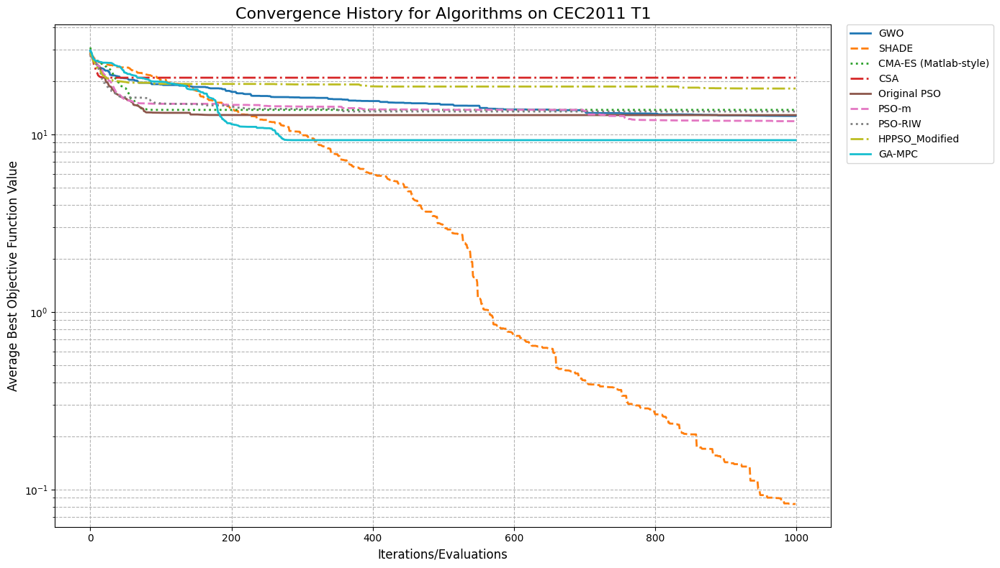

Plot for T1 generated.


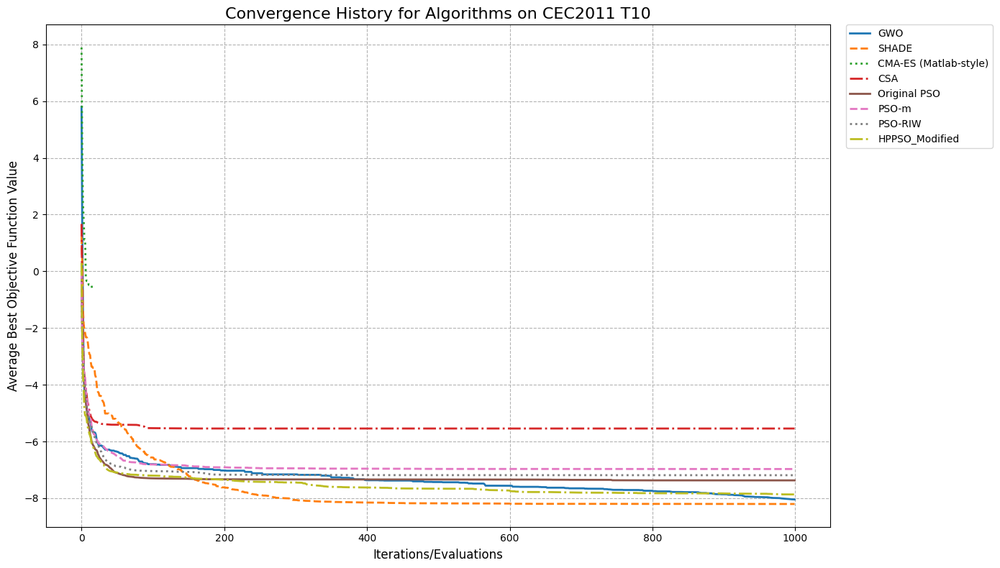

Plot for T10 generated.


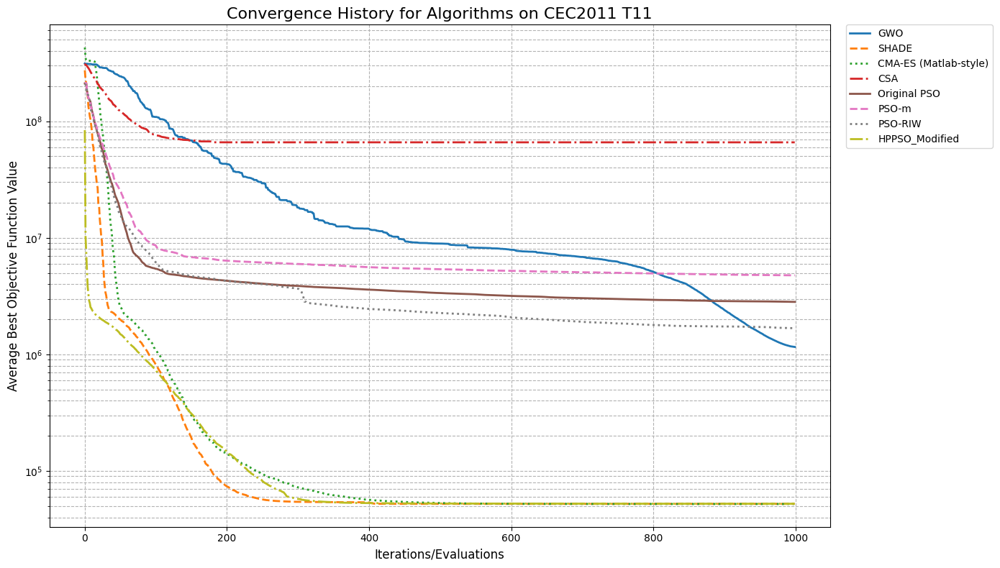

Plot for T11 generated.


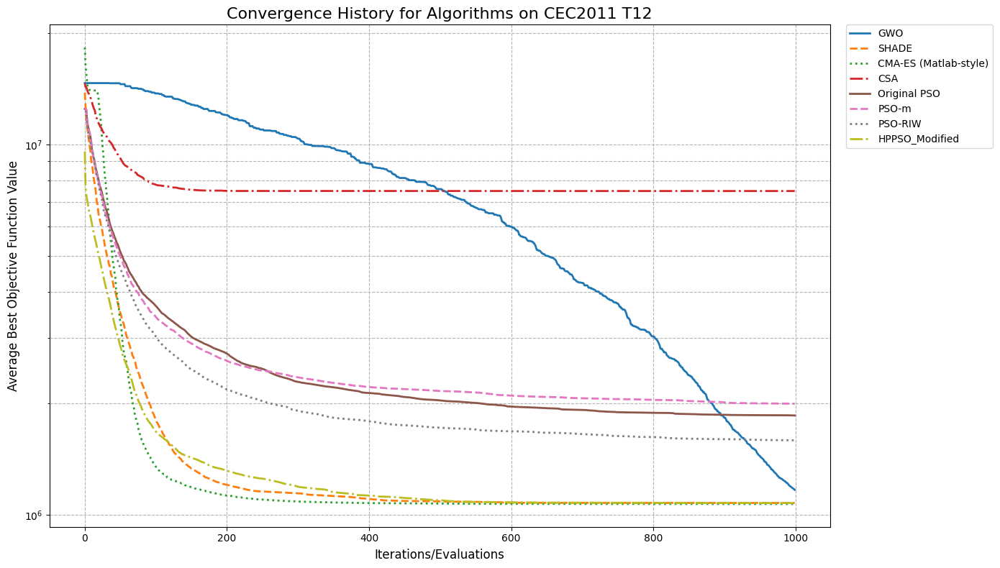

Plot for T12 generated.


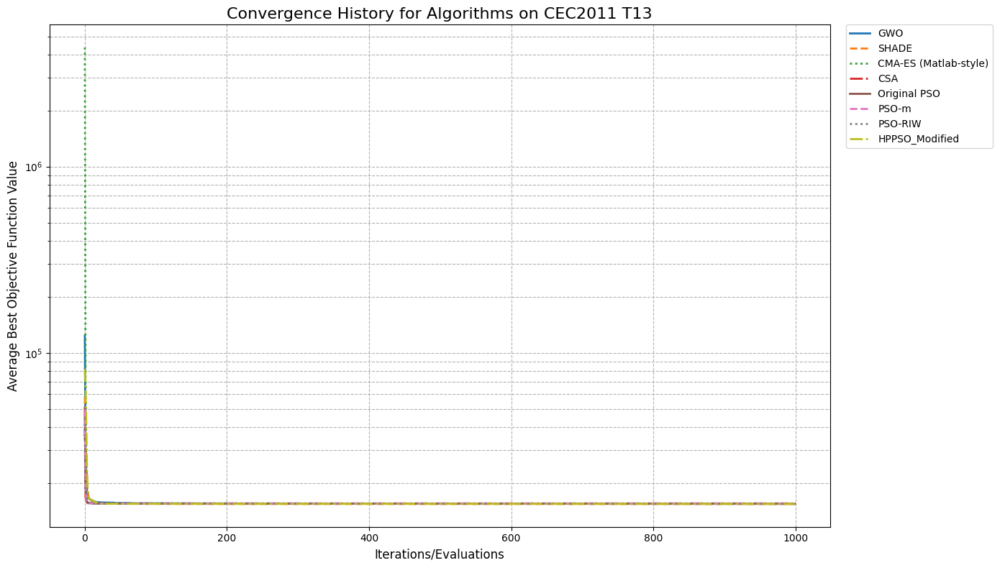

Plot for T13 generated.


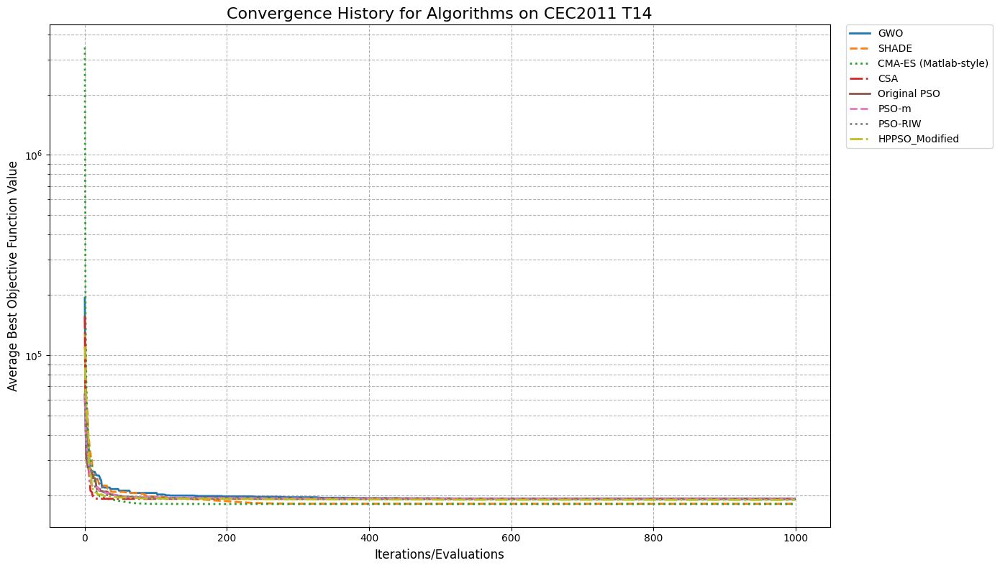

Plot for T14 generated.


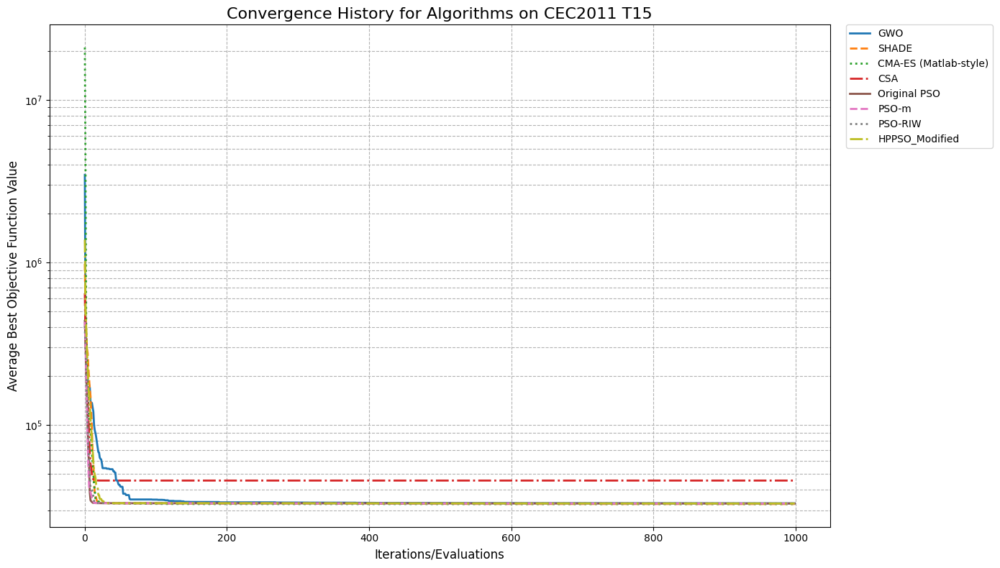

Plot for T15 generated.


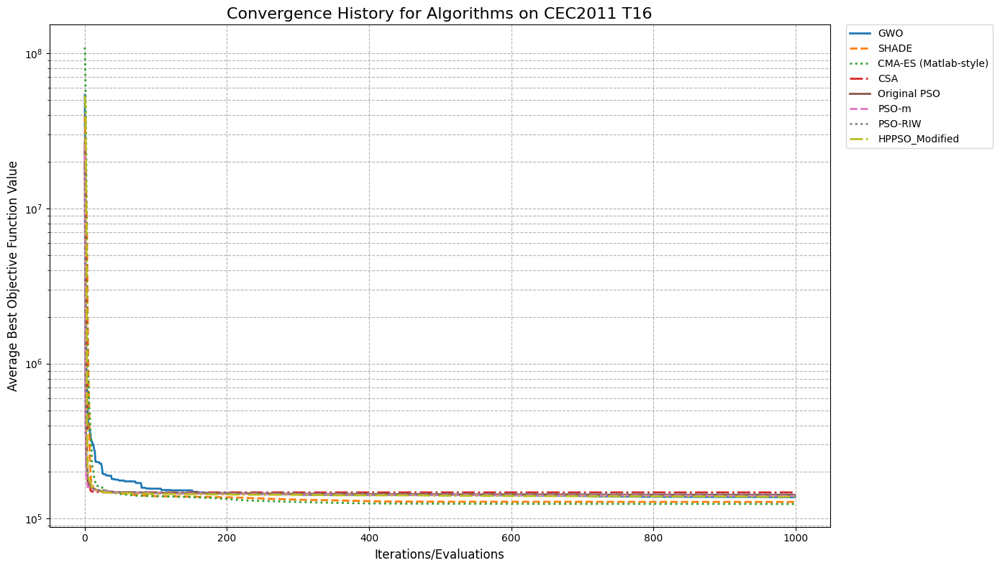

Plot for T16 generated.


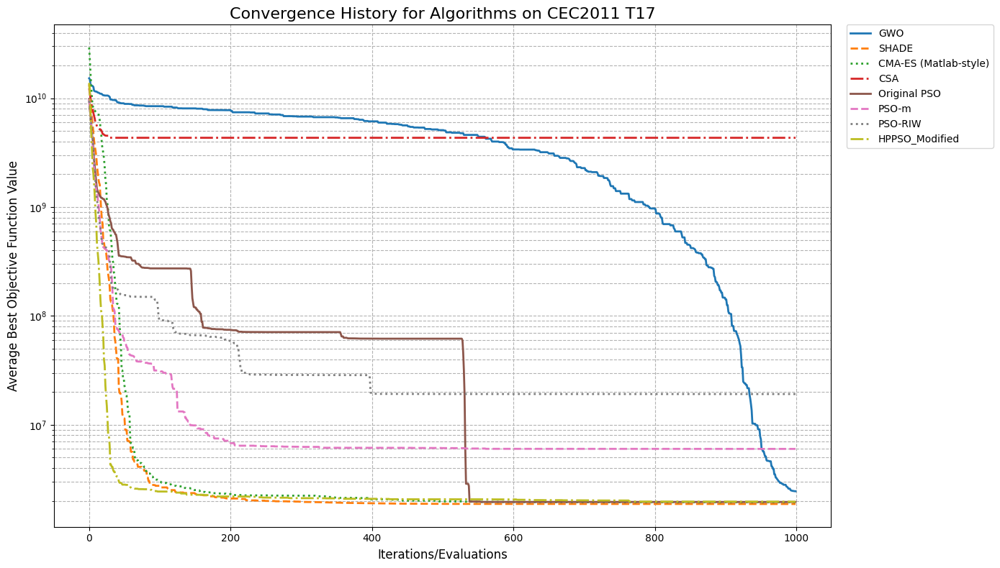

Plot for T17 generated.


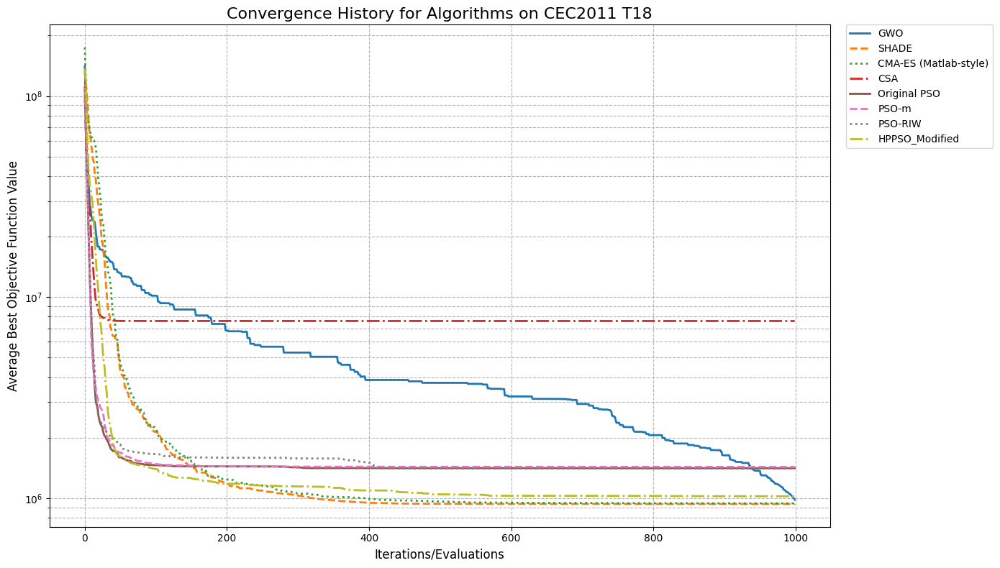

Plot for T18 generated.


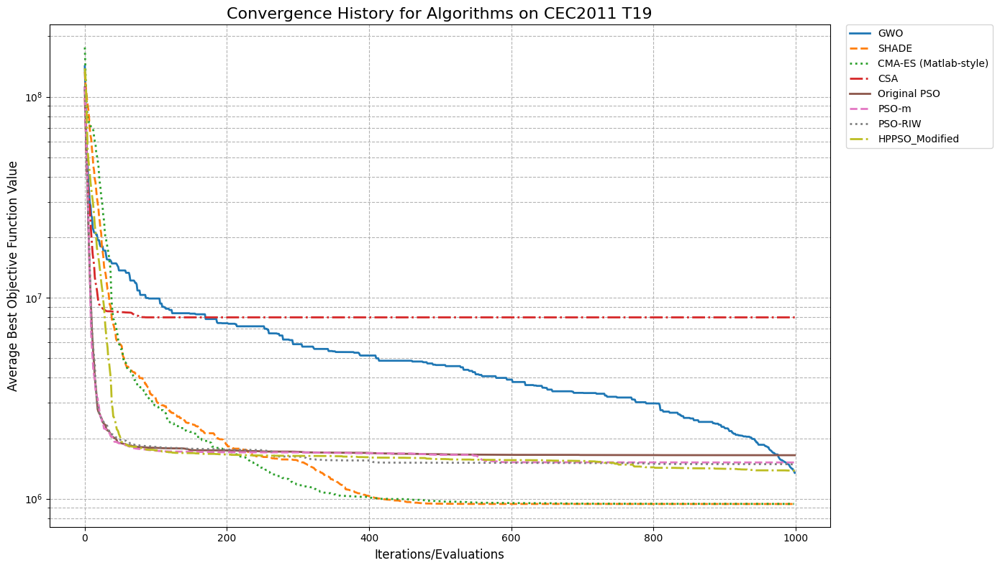

Plot for T19 generated.


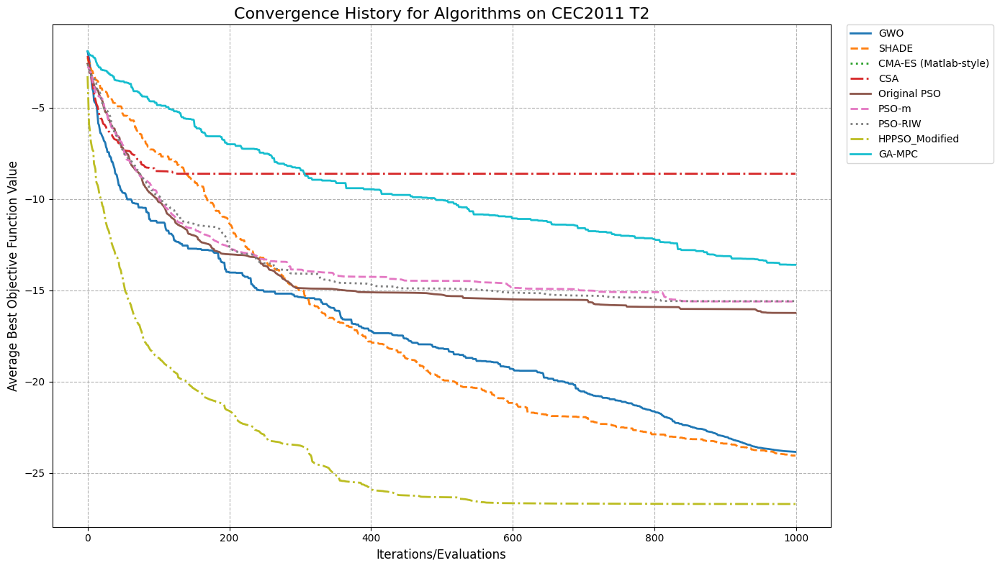

Plot for T2 generated.


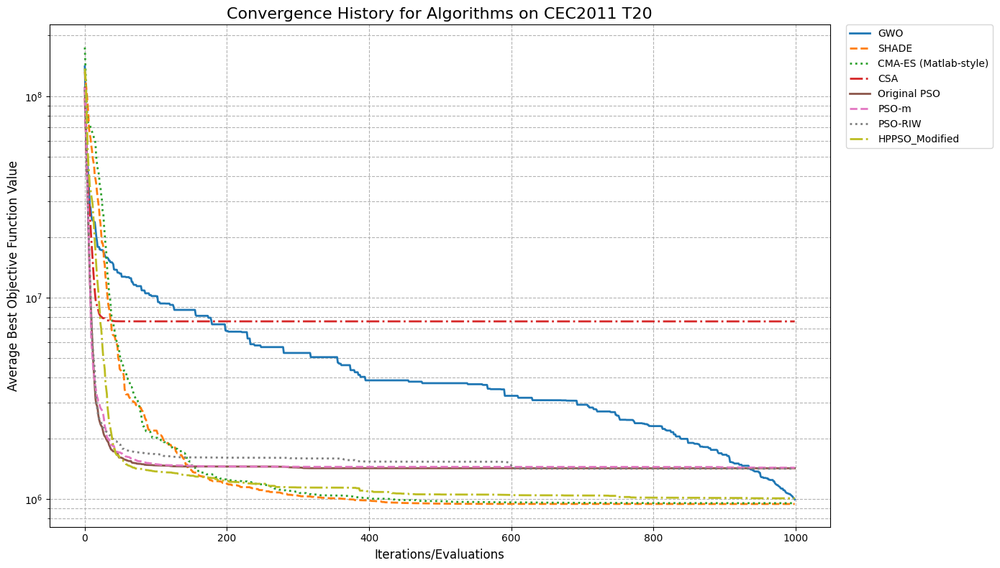

Plot for T20 generated.


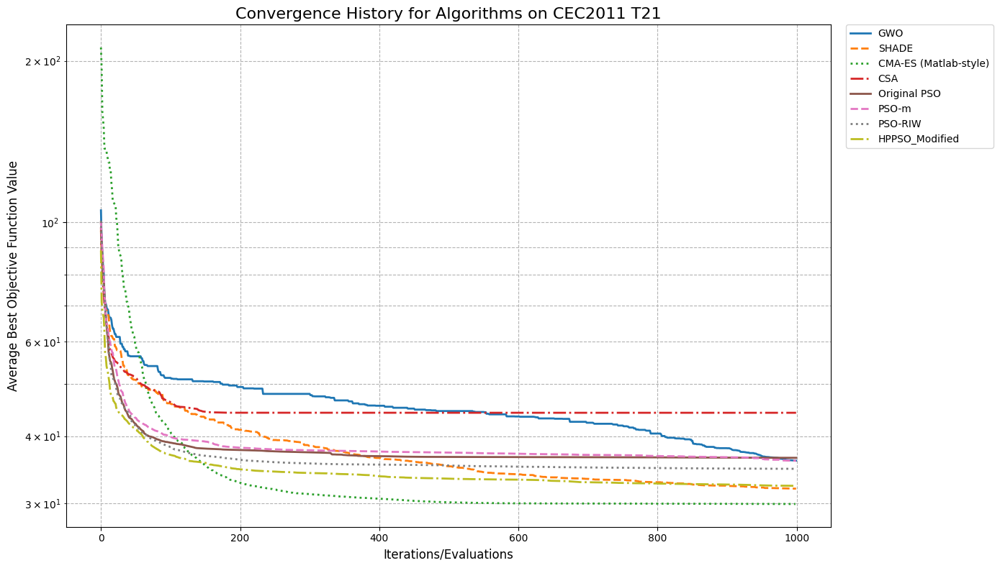

Plot for T21 generated.


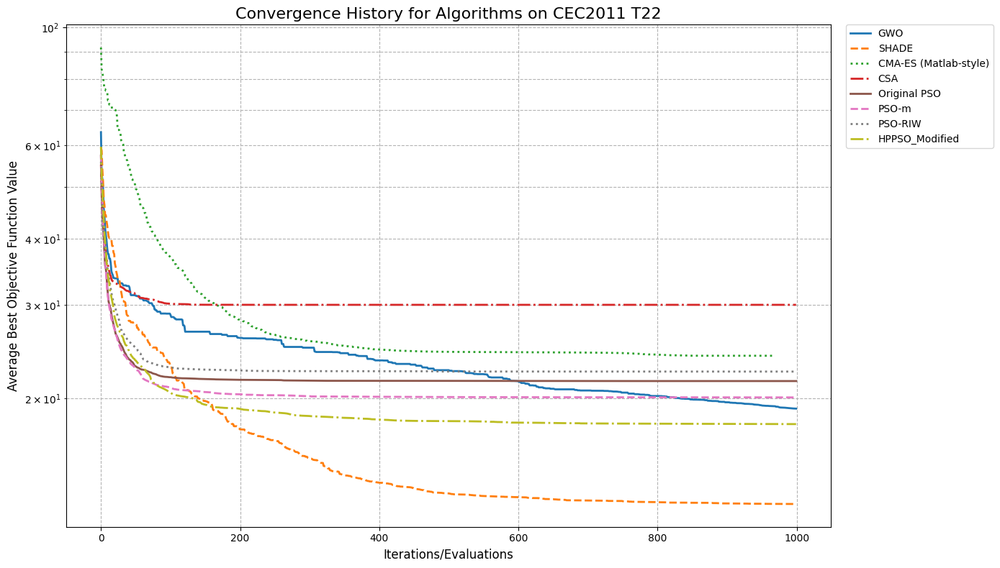

Plot for T22 generated.


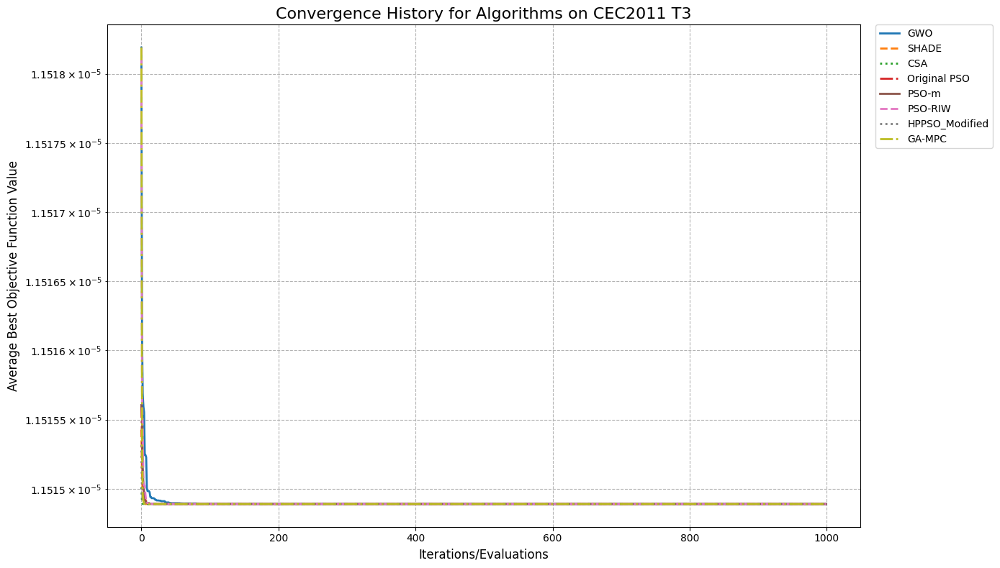

Plot for T3 generated.


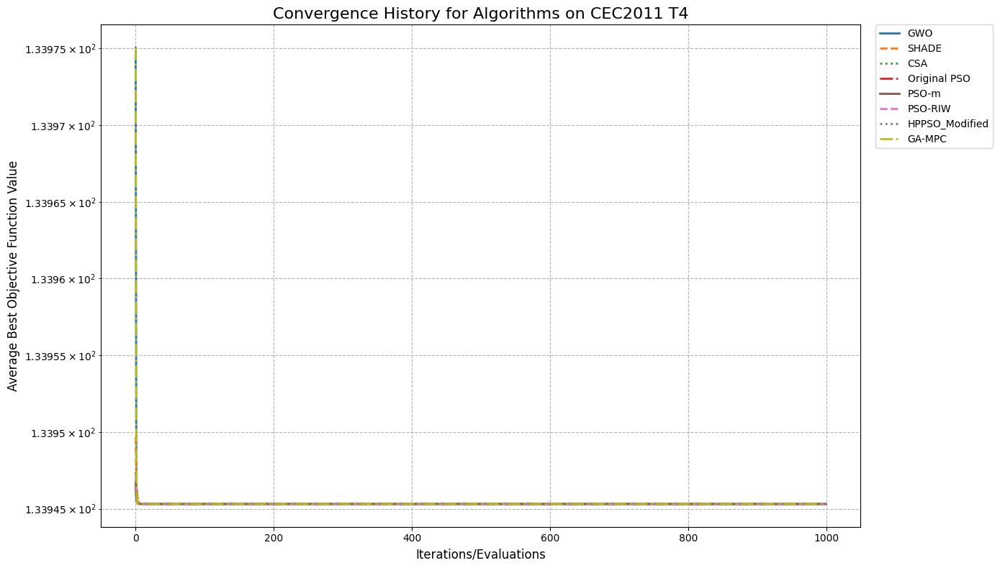

Plot for T4 generated.


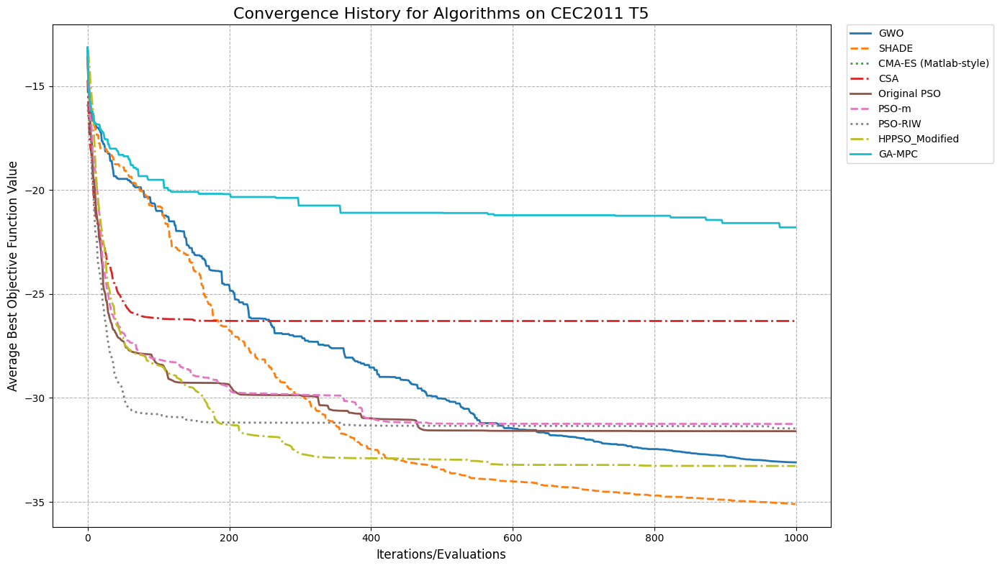

Plot for T5 generated.


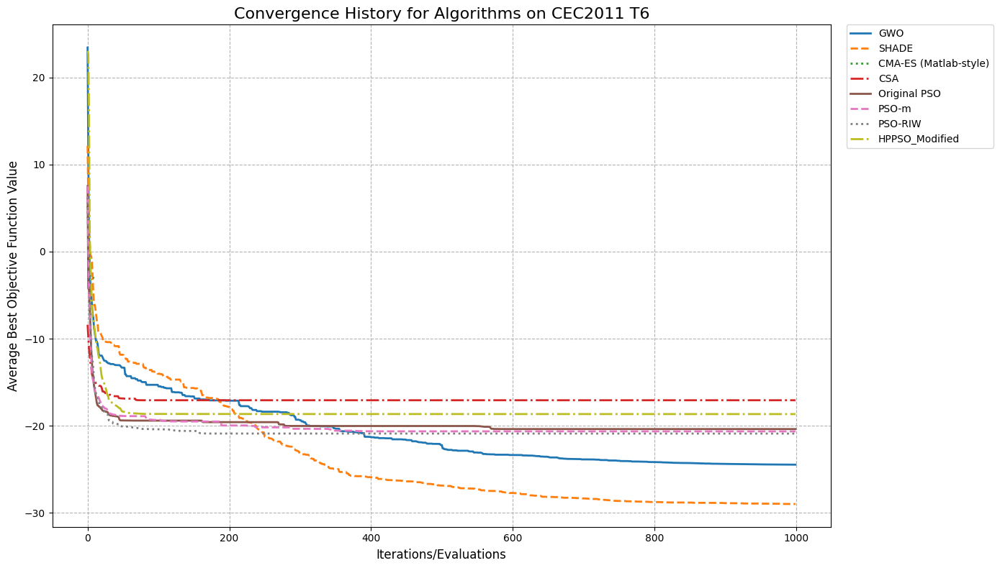

Plot for T6 generated.


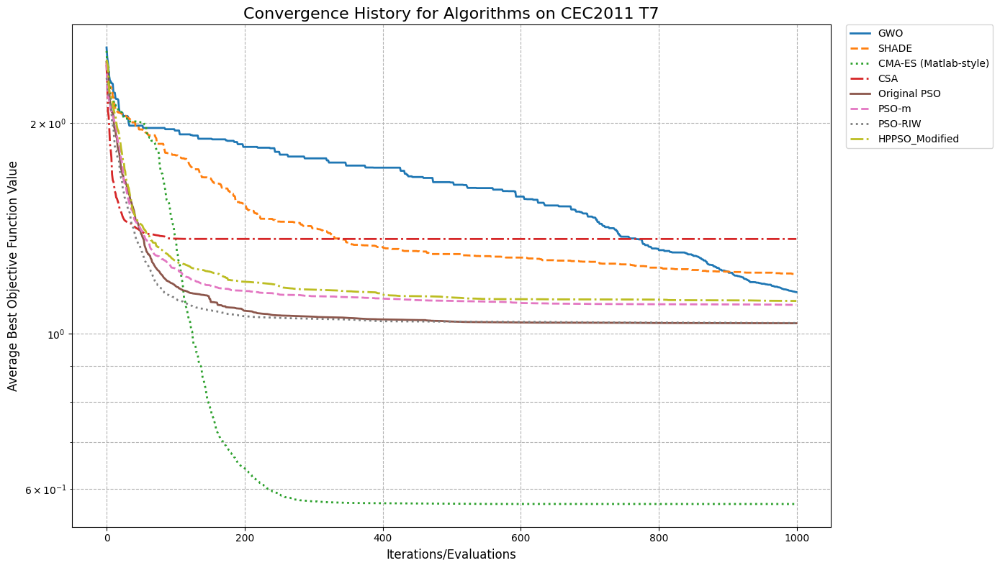

Plot for T7 generated.


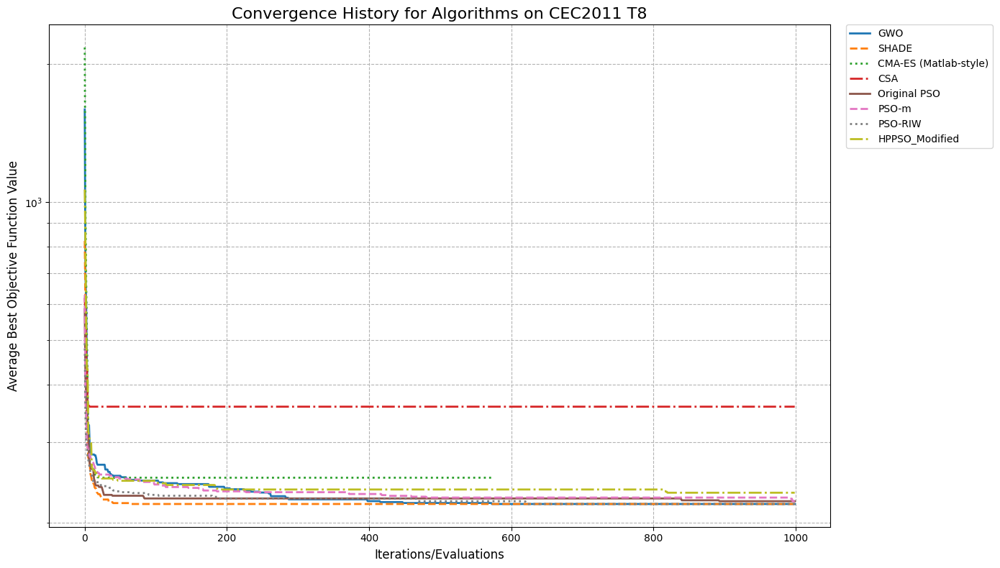

Plot for T8 generated.


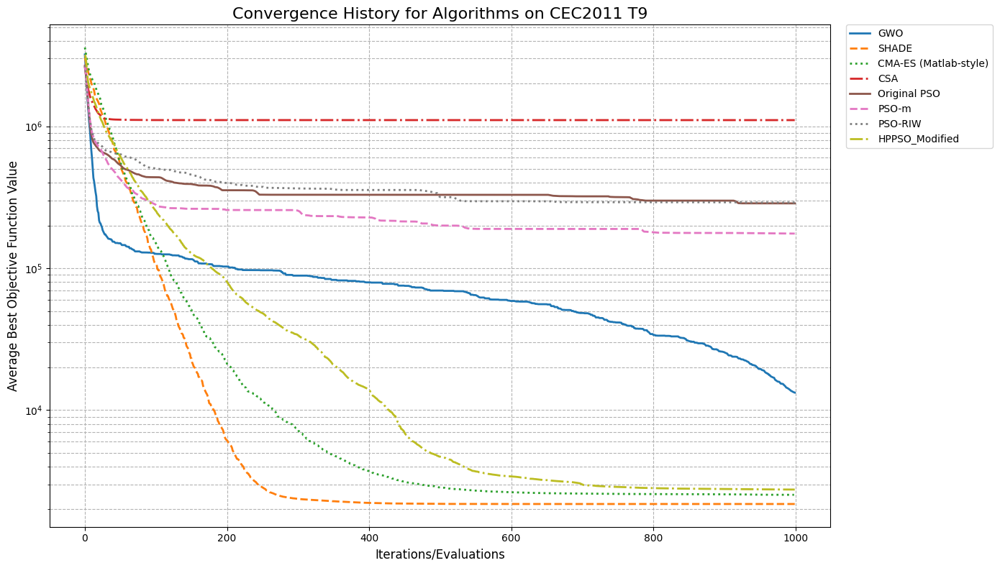

Plot for T9 generated.
All convergence history plots generated.


In [ ]:
# Define BENCHMARK_PROBLEMS if not already defined from previous cells
# This is crucial for plotting all problems correctly
if 'BENCHMARK_PROBLEMS' not in globals():
    # Fallback if the cell defining BENCHMARK_PROBLEMS was not run or kernel reset
    # Extract problem names from the loaded results if possible
    if all_benchmark_results:
        # Get the first algorithm's results and extract problem names
        first_algo_results = next(iter(all_benchmark_results.values()))
        BENCHMARK_PROBLEMS = sorted(list(first_algo_results.keys()))
        print(f"BENCHMARK_PROBLEMS inferred from loaded data: {BENCHMARK_PROBLEMS}")
    else:
        # Default list if no data loaded
        BENCHMARK_PROBLEMS = [f"T{i}" for i in range(1, 23)]
        print(f"BENCHMARK_PROBLEMS set to default: {BENCHMARK_PROBLEMS}")

# Use a consistent set of line styles, markers, and colors
line_styles = ['-', '--', ':', '-.']
markers = ['o', 's', '^', 'D', 'p', '*', 'h', '+', 'x']

# Get a colormap with enough distinct colors for all algorithms
# Ensure 'algorithms' is correctly populated from all_benchmark_results keys
algorithm_names = list(all_benchmark_results.keys())
colors = plt.cm.get_cmap('tab10', len(algorithm_names)).colors if algorithm_names else []

print("Generating convergence history plots for all CEC2011 problems...")

# Iterate through each problem
for problem_name in BENCHMARK_PROBLEMS:
    plt.figure(figsize=(14, 8))
    plt.title(f'Convergence History for Algorithms on CEC2011 {problem_name}', fontsize=16)
    plt.xlabel('Iterations/Evaluations', fontsize=12)
    plt.ylabel('Average Best Objective Function Value', fontsize=12)
    plt.grid(True, which="both", ls="--", c='0.7')

    # Attempt to use log scale, but handle cases where data might be non-positive
    # To avoid 'UserWarning: Data has no positive values, and therefore cannot be log-scaled.'
    # Check if all relevant history values for this problem are positive across all algos
    all_positive = True
    for algo_name in algorithm_names:
        if problem_name in all_benchmark_results[algo_name] and all_benchmark_results[algo_name][problem_name]["avg_history"]:
            history = np.array(all_benchmark_results[algo_name][problem_name]["avg_history"])
            if np.any(history <= 0):
                all_positive = False
                break
    if all_positive:
        plt.yscale('log')
    else:
        print(f"Warning: Not using log scale for {problem_name} as some values are non-positive.")

    algo_idx = 0
    # Iterate through each algorithm's results
    for algo_name in algorithm_names:
        results = all_benchmark_results[algo_name]
        if problem_name in results and results[problem_name]["avg_history"]:
            history = results[problem_name]["avg_history"]
            # Ensure history is not empty and has valid data before plotting
            if history and not np.all(np.isnan(history)):
                plt.plot(
                    history,
                    label=f'{algo_name}',
                    color=colors[algo_idx % len(colors)] if len(colors) > 0 else 'black', # FIX: Changed 'if colors' to 'if len(colors) > 0'
                    linestyle=line_styles[algo_idx % len(line_styles)],
                    linewidth=2
                )
            algo_idx += 1

    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., fontsize=10)
    plt.tight_layout()
    plt.show()
    print(f"Plot for {problem_name} generated.")

print("All convergence history plots generated.")

# MAth

In [ ]:
import numpy as np

class BenchmarkFunctions:
    def __init__(self, dim, lower_bound, upper_bound, random_shift=True, fixed_shift_vector=None):
        self.dim = dim
        self.lower_bound = np.atleast_1d(lower_bound)
        self.upper_bound = np.atleast_1d(upper_bound)

        if random_shift:
            self.o = np.random.uniform(self.lower_bound, self.upper_bound, dim)
        elif fixed_shift_vector is not None:
            self.o = np.asarray(fixed_shift_vector)
        else:
            self.o = np.zeros(dim)

    def _prepare(self, x):
        return np.asarray(x) - self.o

    def f1_sphere(self, x):
        z = self._prepare(x)
        return np.sum(z**2)

    def f2_schwefel_2_22(self, x):
        z = self._prepare(x)
        # Use log-sum-exp trick or clipping to prevent overflow in prod
        abs_z = np.abs(z)
        return np.sum(abs_z) + np.exp(np.clip(np.sum(np.log(abs_z + 1e-100)), -700, 700))

    def f3_zakharov(self, x):
        z = self._prepare(x)
        sum1 = np.sum(z**2)
        sum2 = np.sum(0.5 * np.arange(1, self.dim + 1) * z)
        return sum1 + sum2**2 + sum2**4

    def f4_rosenbrock(self, x):
        z = self._prepare(x)
        return np.sum(100.0 * (z[1:] - z[:-1]**2.0)**2.0 + (1.0 - z[:-1])**2.0)

    def f5_powell_sum(self, x):
        z = self._prepare(x)
        # Clip exponents or values to prevent overflow at 2000D
        return np.sum(np.power(np.clip(np.abs(z), 0, 1e10), np.arange(2, self.dim + 2) / self.dim))

    def f6_rastrigin(self, x):
        z = self._prepare(x)
        return 10 * self.dim + np.sum(z**2 - 10 * np.cos(2 * np.pi * z))

    def f7_ackley(self, x):
        z = self._prepare(x)
        sum1 = np.sum(z**2)
        sum2 = np.sum(np.cos(2 * np.pi * z))
        return -20 * np.exp(-0.2 * np.sqrt(sum1 / self.dim)) - np.exp(sum2 / self.dim) + 20 + np.e

    def f8_griewank(self, x):
        z = self._prepare(x)
        sum_sq = np.sum(z**2) / 4000.0
        prod_cos = np.prod(np.cos(z / np.sqrt(np.arange(1, self.dim + 1))))
        return sum_sq - prod_cos + 1

    def f9_weierstrass(self, x, a=0.5, b=3, k_max=20):
        z = self._prepare(x)
        sum_outer = 0
        for k in range(k_max + 1):
            sum_outer += np.sum(a**k * np.cos(2 * np.pi * b**k * (z + 0.5)))
        constant = self.dim * np.sum([a**k * np.cos(2 * np.pi * b**k * 0.5) for k in range(k_max + 1)])
        return sum_outer - constant

    def f10_levy(self, x):
        z = self._prepare(x)
        w = 1 + (z - 1) / 4
        term1 = (np.sin(np.pi * w[0]))**2
        term_last = (w[-1] - 1)**2 * (1 + (np.sin(2 * np.pi * w[-1]))**2)
        sum_mid = np.sum((w[:-1] - 1)**2 * (1 + 10 * (np.sin(np.pi * w[:-1] + 1))**2))
        return term1 + sum_mid + term_last

    def f11_schwefel_2_26(self, x):
        z = self._prepare(x)
        return 418.9829 * self.dim - np.sum(z * np.sin(np.sqrt(np.abs(z))))

    def f12_styblinski_tang(self, x):
        z = self._prepare(x)
        return 0.5 * np.sum(z**4 - 16 * z**2 + 5 * z)

    def f13_michalewicz(self, x, m=10):
        z = self._prepare(x)
        return -np.sum(np.sin(z) * (np.sin(np.arange(1, self.dim + 1) * z**2 / np.pi))**(2 * m))

    def f14_alpine_1(self, x):
        z = self._prepare(x)
        return np.sum(np.abs(z * np.sin(z) + 0.1 * z))

    def f15_happy_cat(self, x, alpha=1/8):
        z = self._prepare(x)
        z_sq = np.sum(z**2)
        return ((z_sq - self.dim)**2)**alpha + (0.5 * z_sq + np.sum(z)) / self.dim + 0.5

    def f16_hgbat(self, x, alpha=1/4):
        z = self._prepare(x)
        z_sq = np.sum(z**2)
        z_sum = np.sum(z)
        return ((z_sq**2 - z_sum**2)**2)**alpha + (0.5 * z_sq + z_sum) / self.dim + 0.5

    def f17_bent_cigar(self, x):
        z = self._prepare(x)
        return z[0]**2 + 1e6 * np.sum(z[1:]**2)

    def f18_discus(self, x):
        z = self._prepare(x)
        return 1e6 * z[0]**2 + np.sum(z[1:]**2)

    def f19_penalized_1(self, x):
        z = self._prepare(x)
        def u(xi, a, k, m):
            return k * (xi - a)**m * (xi > a) + k * (-xi - a)**m * (xi < -a)
        y = 1 + (z + 1) / 4
        term1 = 10 * (np.sin(np.pi * y[0]))**2
        term_last = (y[-1] - 1)**2
        sum_mid = np.sum((y[:-1] - 1)**2 * (1 + 10 * (np.sin(np.pi * y[1:]))**2))
        penalty = np.sum(u(z, 10, 100, 4))
        return (np.pi / self.dim) * (term1 + sum_mid + term_last) + penalty

    def f20_zakharov_2(self, x):
        z = self._prepare(x)
        return np.sum(np.abs(z)) * np.exp(np.clip(np.sum(np.sin(z**2)), -700, 700))

In [ ]:
# 1. Setup Dimension and General Bounds for testing
D = 30 # Use a smaller dimension for quick testing
test_lb, test_ub = -5.12, 5.12 # Example bounds for Rastrigin

# 2. Original Version (No Shift)
# Pass fixed_shift_vector=None and random_shift=False to ensure no shift (o=0)
bench_noshift = BenchmarkFunctions(dim=D, lower_bound=test_lb, upper_bound=test_ub,
                                   random_shift=False, fixed_shift_vector=None)
x_test_noshift = np.random.uniform(test_lb, test_ub, D)
print(f"No-shift Rastrigin (o={bench_noshift.o[0]:.2f}...): {bench_noshift.f6_rastrigin(x_test_noshift):.2f}")

# 3. Randomly Shifted Version within bounds
# random_shift=True will generate a shift vector within test_lb, test_ub
bench_shifted = BenchmarkFunctions(dim=D, lower_bound=test_lb, upper_bound=test_ub, random_shift=True)
x_test_shifted = np.random.uniform(test_lb, test_ub, D)
print(f"Randomly Shifted Rastrigin (o={bench_shifted.o[0]:.2f}...): {bench_shifted.f6_rastrigin(x_test_shifted):.2f}")
print(f"  Shift vector for this instance (first 5 elements): {bench_shifted.o[:5]}")


No-shift Rastrigin (o=0.00...): 601.06
Randomly Shifted Rastrigin (o=2.61...): 677.87
  Shift vector for this instance (first 5 elements): [2.61191833 0.54859172 0.80668476 2.63402184 0.01194078]


### Define 20 Mathematical Benchmark Functions

We will now define a list of 20 mathematical benchmark functions from the `BenchmarkFunctions` class. Each function will be associated with a specific dimension and bounds, as commonly used in optimization literature. For simplicity, `shift_vector` will be set to `None`, meaning the functions are not shifted.

In [ ]:
import numpy as np
import random

# Define the full set of algorithm wrappers again to ensure all are included
# and CMA-ES is correctly handled via PureCMAES_Python.

def run_pso_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    pso_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_particles, max_iterations)
    _, best_score, history = pso_instance.optimize()
    return best_score, history

def run_pso_m_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    pso_m_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                         num_particles, max_iterations, mutation_rate=0.05, gaussian_mutation_strength=0.1)
    _, best_score, history = pso_m_instance.optimize()
    return best_score, history

def run_pso_riw_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    # Using Random Inertia Weight variant
    pso_riw_instance = PSO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                          num_particles, max_iterations, w_random_range=(0.4, 0.9))
    _, best_score, history = pso_riw_instance.optimize()
    return best_score, history

def run_hppso_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_particles = POP_SIZE
    max_iterations = MAX_ITERS

    bounds_for_hppso = (lower_bound, upper_bound)

    hppso_instance = HPPSO_Modified(obj_func, n_pop=num_particles, dimensions=dim,
                                    max_it=max_iterations, bounds=bounds_for_hppso)
    best_score, history = hppso_instance.optimize()
    return best_score, history

def run_ga_mpc_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    ps_local = POP_SIZE
    max_gen_local = MAX_ITERS

    _, best_score, history = run_ga_mpc_cec(
        obj_func, dim, lower_bound, upper_bound,
        ps=ps_local, max_gen=max_gen_local
    )
    return best_score, history

def run_gwo_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_wolves = POP_SIZE
    max_iterations = MAX_ITERS

    gwo_instance = GWO(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_wolves, max_iterations)
    _, best_score, history = gwo_instance.optimize()
    return best_score, history

def run_shade_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_individuals = POP_SIZE
    max_iterations = MAX_ITERS
    H_size = 50

    shade_instance = SHADE(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                           num_individuals, max_iterations, H=H_size)
    _, best_score, history = shade_instance.optimize()
    return best_score, history

def run_csa_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    num_individuals = POP_SIZE
    max_iterations = MAX_ITERS

    csa_instance = CSA(obj_func, list(zip(lower_bound, upper_bound)) if not np.isscalar(lower_bound) else [(lower_bound, upper_bound)]*dim,
                       num_individuals, max_iterations)
    _, best_score, history = csa_instance.optimize()
    return best_score, history

def run_pure_cmaes_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed):
    random.seed(random_seed)
    np.random.seed(random_seed)

    lb_arr = np.atleast_1d(lower_bound)
    ub_arr = np.atleast_1d(upper_bound)
    if lb_arr.size == 1: # If scalar bounds, replicate for dimension
        lb_arr = np.full(dim, lb_arr.item())
        ub_arr = np.full(dim, ub_arr.item())

    bounds_range = ub_arr - lb_arr
    if np.all(bounds_range == 0):
        initial_sigma_val = 0.3
    else:
        initial_sigma_val = 0.25 * np.mean(bounds_range[bounds_range > 0])

    user_pop_size = POP_SIZE
    user_max_iterations = MAX_ITERS

    cmaes_instance = PureCMAES_Python(objective_function=obj_func, N=dim,
                                      lower_bounds=lower_bound, upper_bounds=upper_bound,
                                      initial_sigma=initial_sigma_val,
                                      max_iterations=user_max_iterations,
                                      pop_size=user_pop_size,
                                      max_total_evaluations=max_evals_budget)

    _, best_score, history = cmaes_instance.optimize()
    return best_score, history


# All algorithms to be included in this benchmark
algorithms_math_benchmark = {
    "Original PSO": run_pso_benchmark,
    "PSO-m": run_pso_m_benchmark,
    "PSO-RIW": run_pso_riw_benchmark,
    "HPPSO_Modified": run_hppso_benchmark,
    "GA-MPC": run_ga_mpc_benchmark,
    "GWO": run_gwo_benchmark,
    "SHADE": run_shade_benchmark,
    "CSA": run_csa_benchmark,
    "CMA-ES (Matlab-style)": run_pure_cmaes_benchmark
}

mathematical_problems = []

# Define the desired dimension for all mathematical problems
DIM_FOR_BENCHMARK = 2000 # Corrected dimension to 2000 as requested

def add_math_problem(func_name, dim_override, bounds):
    # Ensure bounds are 1D arrays for uniform sampling
    lb_single, ub_single = bounds
    lb_array = np.full(dim_override, lb_single)
    ub_array = np.full(dim_override, ub_single)

    # Generate a random shift vector for this problem within its bounds
    # This ensures the new optimal solution is within the search bounds
    shift_vector = np.random.uniform(lb_array, ub_array, dim_override)

    # Create a wrapper function that calls the specific benchmark function
    def obj_wrapper(x):
        # Instantiate BenchmarkFunctions for each call, using the pre-generated shift_vector
        # This ensures consistency across evaluations for a given problem instance
        bench = BenchmarkFunctions(dim=dim_override, lower_bound=lb_array, upper_bound=ub_array,
                                   random_shift=False, fixed_shift_vector=shift_vector)
        return getattr(bench, func_name)(x)

    mathematical_problems.append({
        "name": func_name,
        "function": obj_wrapper,
        "dimension": dim_override,
        "bounds": bounds,
        "shift_vector": shift_vector.tolist() # Store as list for JSON serialization
    })


# Group 1: Unimodal / Pathfinding
add_math_problem("f1_sphere", dim_override=DIM_FOR_BENCHMARK, bounds=(-100, 100))
add_math_problem("f2_schwefel_2_22", dim_override=DIM_FOR_BENCHMARK, bounds=(-10, 10))
add_math_problem("f3_zakharov", dim_override=DIM_FOR_BENCHMARK, bounds=(-10, 10))
add_math_problem("f4_rosenbrock", dim_override=DIM_FOR_BENCHMARK, bounds=(-30, 30))
add_math_problem("f5_powell_sum", dim_override=DIM_FOR_BENCHMARK, bounds=(-10, 10))

# Group 2: Multimodal / Global Search
add_math_problem("f6_rastrigin", dim_override=DIM_FOR_BENCHMARK, bounds=(-5.12, 5.12))
add_math_problem("f7_ackley", dim_override=DIM_FOR_BENCHMARK, bounds=(-32.768, 32.768))
add_math_problem("f8_griewank", dim_override=DIM_FOR_BENCHMARK, bounds=(-600, 600))
add_math_problem("f9_weierstrass", dim_override=DIM_FOR_BENCHMARK, bounds=(-0.5, 0.5))
add_math_problem("f10_levy", dim_override=DIM_FOR_BENCHMARK, bounds=(-10, 10))

# Group 3: Heterogeneous / Asymmetric
add_math_problem("f11_schwefel_2_26", dim_override=DIM_FOR_BENCHMARK, bounds=(-500, 500))
add_math_problem("f12_styblinski_tang", dim_override=DIM_FOR_BENCHMARK, bounds=(-5, 5))
add_math_problem("f13_michalewicz", dim_override=10, bounds=(0, np.pi)) # Michalewicz often tested in lower dims
add_math_problem("f14_alpine_1", dim_override=DIM_FOR_BENCHMARK, bounds=(-10, 10))
add_math_problem("f15_happy_cat", dim_override=DIM_FOR_BENCHMARK, bounds=(-2, 2))
add_math_problem("f16_hgbat", dim_override=DIM_FOR_BENCHMARK, bounds=(-2, 2))
add_math_problem("f17_bent_cigar", dim_override=DIM_FOR_BENCHMARK, bounds=(-100, 100))
add_math_problem("f18_discus", dim_override=DIM_FOR_BENCHMARK, bounds=(-100, 100))
add_math_problem("f19_penalized_1", dim_override=DIM_FOR_BENCHMARK, bounds=(-50, 50))
add_math_problem("f20_zakharov_2", dim_override=DIM_FOR_BENCHMARK, bounds=(-10, 10))

print(f"Defined {len(mathematical_problems)} mathematical benchmark problems.")
for p in mathematical_problems:
    print(f"  - {p['name']} (Dim: {p['dimension']}, Bounds: {p['bounds']})")

Defined 20 mathematical benchmark problems.
  - f1_sphere (Dim: 1000, Bounds: (-100, 100))
  - f2_schwefel_2_22 (Dim: 1000, Bounds: (-10, 10))
  - f3_zakharov (Dim: 1000, Bounds: (-10, 10))
  - f4_rosenbrock (Dim: 1000, Bounds: (-30, 30))
  - f5_powell_sum (Dim: 1000, Bounds: (-10, 10))
  - f6_rastrigin (Dim: 1000, Bounds: (-5.12, 5.12))
  - f7_ackley (Dim: 1000, Bounds: (-32.768, 32.768))
  - f8_griewank (Dim: 1000, Bounds: (-600, 600))
  - f9_weierstrass (Dim: 1000, Bounds: (-0.5, 0.5))
  - f10_levy (Dim: 1000, Bounds: (-10, 10))
  - f11_schwefel_2_26 (Dim: 1000, Bounds: (-500, 500))
  - f12_styblinski_tang (Dim: 1000, Bounds: (-5, 5))
  - f13_michalewicz (Dim: 10, Bounds: (0, 3.141592653589793))
  - f14_alpine_1 (Dim: 1000, Bounds: (-10, 10))
  - f15_happy_cat (Dim: 1000, Bounds: (-2, 2))
  - f16_hgbat (Dim: 1000, Bounds: (-2, 2))
  - f17_bent_cigar (Dim: 1000, Bounds: (-100, 100))
  - f18_discus (Dim: 1000, Bounds: (-100, 100))
  - f19_penalized_1 (Dim: 1000, Bounds: (-50, 50))
  -

In [ ]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Re-initialize all_math_benchmark_results to consolidate data from all files
all_math_benchmark_results = {}

# Define the name of the mathematical benchmark results file
output_filename_math = "benchmark_math_results.json"

# Check if the file exists and load it
if os.path.exists(output_filename_math):
    print(f"Loading mathematical benchmark results from {output_filename_math}...")
    try:
        with open(output_filename_math, 'r') as f:
            all_math_benchmark_results = json.load(f)
        print(f"Successfully loaded results for {len(all_math_benchmark_results)} algorithms.")
        print("Algorithms found:", list(all_math_benchmark_results.keys()))
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON from {output_filename_math}: {e}")
    except Exception as e:
        print(f"An unexpected error occurred while reading {output_filename_math}: {e}")
else:
    print(f"Warning: {output_filename_math} not found. Please ensure the mathematical benchmark was run and saved correctly.")

# Get the list of problem names from the loaded results
mathematical_problem_names = []
if all_math_benchmark_results:
    first_algo_key = next(iter(all_math_benchmark_results))
    mathematical_problem_names = sorted(list(all_math_benchmark_results[first_algo_key].keys()))
    print(f"Mathematical problems identified: {mathematical_problem_names}")
else:
    print("No mathematical benchmark results loaded. Cannot proceed with analysis.")

Loading mathematical benchmark results from benchmark_math_results.json...
Successfully loaded results for 1 algorithms.
Algorithms found: ['Original PSO']
Mathematical problems identified: ['f1_sphere', 'f2_schwefel_2_22', 'f3_zakharov', 'f4_rosenbrock']


### Median Final Scores Table

This table shows the median final objective function value for each algorithm on each of the mathematical benchmark problems. Lower values indicate better performance (since we are minimizing).

In [ ]:
# Prepare data for the median scores table
table_data = {}
for algo_name, problems_results in all_math_benchmark_results.items():
    table_data[algo_name] = {}
    for problem_name in mathematical_problem_names:
        if problem_name in problems_results:
            # Calculate median from 'all_final_scores'
            median_score = np.median(problems_results[problem_name]["all_final_scores"])
            table_data[algo_name][problem_name] = median_score
        else:
            table_data[algo_name][problem_name] = np.nan # Use NaN for missing data

# Create a DataFrame
df_math_median_scores = pd.DataFrame(table_data)

# Reorder columns (algorithms) to match plotting order if desired, or keep as is
df_math_median_scores = df_math_median_scores[sorted(df_math_median_scores.columns)]

print("\nMedian Final Scores Across All Algorithms and Mathematical Problems:")
display(df_math_median_scores)


Median Final Scores Across All Algorithms and Mathematical Problems:


,Original PSO
f1_sphere,3717.266421
f2_schwefel_2_22,34.530246
f3_zakharov,681.077703
f4_rosenbrock,700682.411342


### Statistical Significance Tests (Friedman Test and Nemenyi Post-Hoc)

To formally compare the algorithms, we will perform the non-parametric Friedman test. If the Friedman test indicates a significant difference, we will then use the Nemenyi post-hoc test to identify which specific pairs of algorithms have statistically significant performance differences. We will use a significance level (alpha) of 0.05.

First, we need to ensure all algorithms have data for the same set of problems to run these tests.

In [ ]:
import scikit_posthocs as sp
from scipy.stats import friedmanchisquare, rankdata

print("\nPerforming Statistical Significance Tests on Mathematical Benchmark Results...")

algorithm_names_math = list(df_math_median_scores.columns)

# Drop problems (rows) where any algorithm has a NaN score
df_friedman_cleaned_math = df_math_median_scores.dropna()

if df_friedman_cleaned_math.empty:
    print("No common problems found for all algorithms after dropping NaNs. Cannot perform Friedman test.")
else:
    # Extract the data as a list of arrays, where each array corresponds to an algorithm's scores
    data_for_friedman_math = [df_friedman_cleaned_math[col].values for col in df_friedman_cleaned_math.columns]

    print(f"Performing Friedman test on {len(df_friedman_cleaned_math.columns)} algorithms across {len(df_friedman_cleaned_math)} problems.")
    print(f"Problems included: {list(df_friedman_cleaned_math.index.values)}")

    # Perform Friedman test
    stat, p = friedmanchisquare(*data_for_friedman_math)

    print(f"\nFriedman Test Results:")
    print(f"  Statistic = {stat:.4f}")
    print(f"  p-value   = {p:.4f}")

    alpha = 0.05 # Significance level

    if p < alpha:
        print(f"  Since p-value ({p:.4f}) < alpha ({alpha}), there is a statistically significant difference between the algorithms.")
        print("\nProceeding with Nemenyi Post-Hoc Test...")

        # Nemenyi test requires ranks, or directly the scores if using scikit_posthocs
        nemenyi_results_math = sp.posthoc_nemenyi_friedman(df_friedman_cleaned_math.values)
        nemenyi_results_math.columns = df_friedman_cleaned_math.columns
        nemenyi_results_math.index = df_friedman_cleaned_math.columns

        print("\nNemenyi Post-Hoc Test p-values (alpha = 0.05):")
        display(nemenyi_results_math)

        # Highlight significant pairs
        significant_pairs_math = nemenyi_results_math[nemenyi_results_math < alpha].stack().reset_index()
        significant_pairs_math = significant_pairs_math[significant_pairs_math['level_0'] < significant_pairs_math['level_1']] # Remove duplicates and self-comparisons
        if not significant_pairs_math.empty:
            print("\nStatistically Significant Pairs (p < 0.05):")
            display(significant_pairs_math)
        else:
            print("No statistically significant pairs found by Nemenyi test at alpha = 0.05.")

    else:
        print(f"  Since p-value ({p:.4f}) >= alpha ({alpha}), there is no statistically significant difference between the algorithms.")
        print("Nemenyi Post-Hoc Test will not be performed as Friedman test was not significant.")

ModuleNotFoundError: No module named 'scikit_posthocs'

In [ ]:
import sys
!{sys.executable} -m pip install scikit-posthocs

### Algorithm Ranking Based on Average Ranks

We will now calculate the average rank for each algorithm across all common mathematical problems. An average rank of 1 indicates the best overall performance.

In [ ]:
# Calculate ranks for each problem (row) and then average them for each algorithm (column)
# For minimization, lower score means better rank (rank 1 is best)
if not df_friedman_cleaned_math.empty:
    ranks_series_math = df_friedman_cleaned_math.apply(lambda x: rankdata(x, method='average'), axis=1)
    ranks_math = pd.DataFrame(ranks_series_math.tolist(), index=df_friedman_cleaned_math.index, columns=df_friedman_cleaned_math.columns)

    avg_ranks_math = ranks_math.mean().sort_values()

    print("\nAverage Ranks of Algorithms on Mathematical Functions (1 = Best Performance):\n")
    display(avg_ranks_math.to_frame(name='Average Rank'))
else:
    print("Cannot perform ranking as no common problems were found for all algorithms.")

NameError: name 'df_friedman_cleaned_math' is not defined

### Median Convergence History Plots

These plots visualize the median convergence behavior of each algorithm for every mathematical benchmark problem. They show how the best objective function value (median across runs) changes over iterations/evaluations. Note: If all values for a problem are non-positive, a linear scale will be used instead of a log scale.

/tmp/ipykernel_7519/3315365592.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(algorithm_names_to_plot)).colors if algorithm_names_to_plot else []


Generating convergence history plots for all mathematical problems...


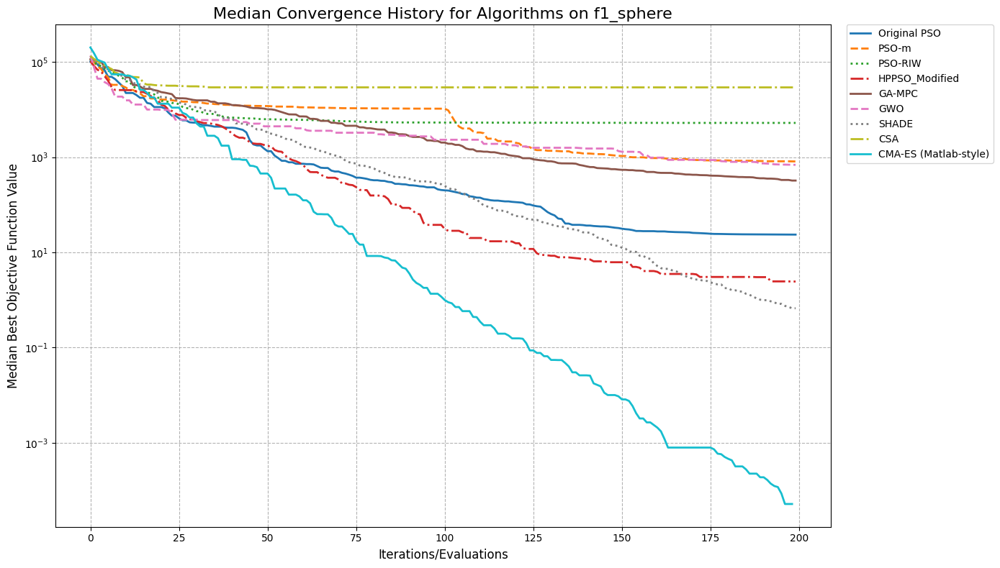

Plot for f1_sphere generated.


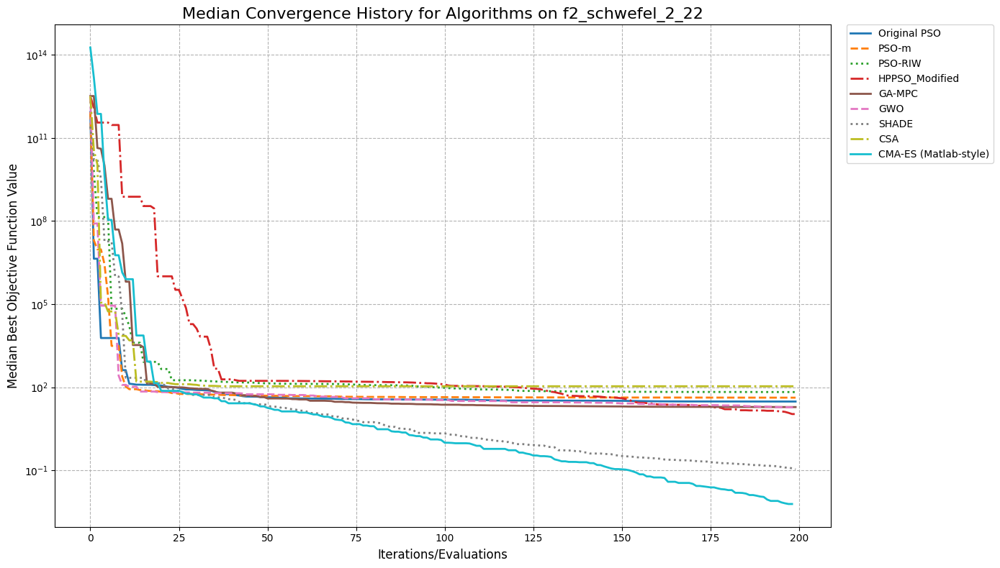

Plot for f2_schwefel_2_22 generated.


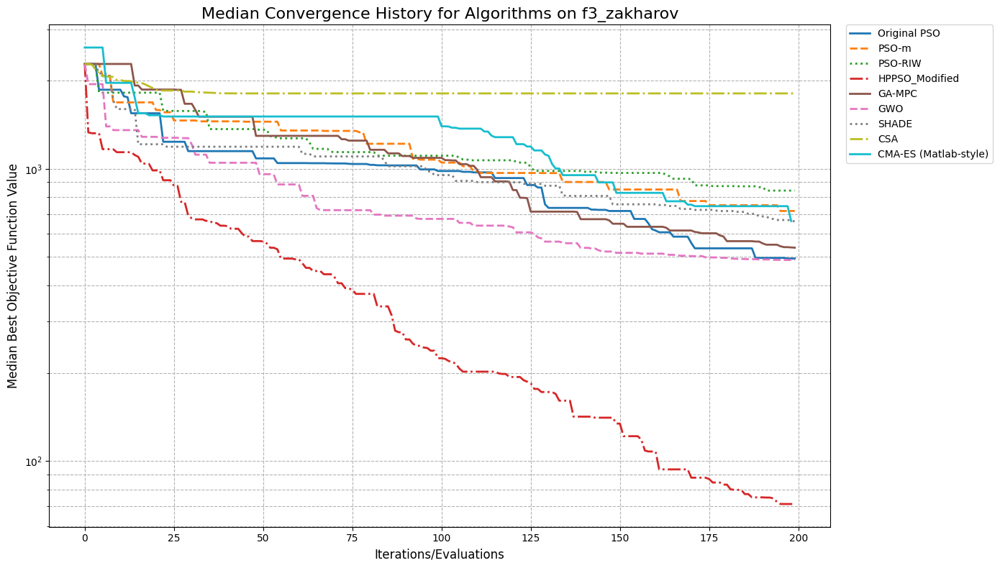

Plot for f3_zakharov generated.


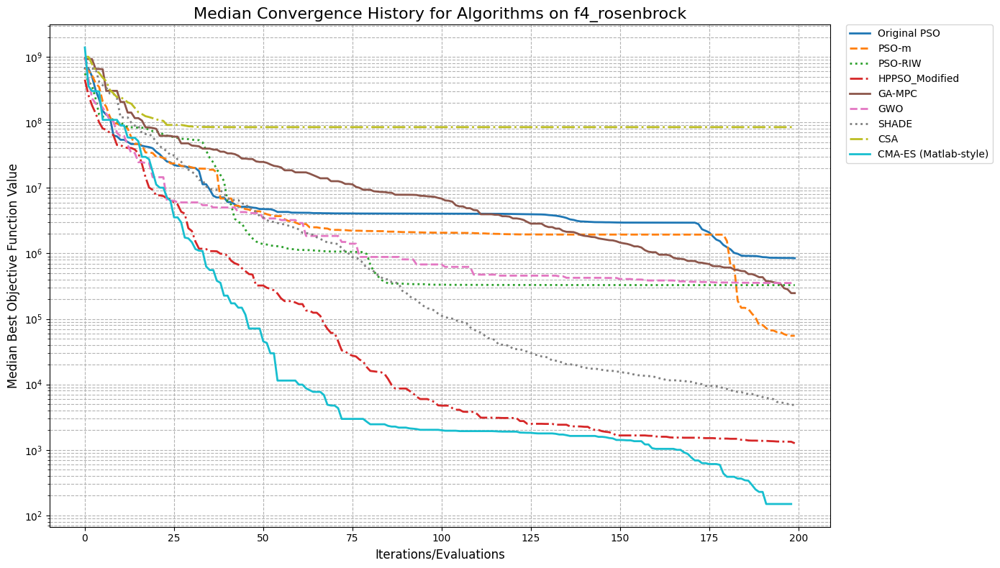

Plot for f4_rosenbrock generated.
All convergence history plots generated.


In [ ]:
import matplotlib.pyplot as plt

# Use a consistent set of line styles, markers, and colors
line_styles = ['-', '--', ':', '-.']
markers = ['o', 's', '^', 'D', 'p', '*', 'h', '+', 'x']

algorithm_names_to_plot = list(all_math_benchmark_results.keys())
colors = plt.cm.get_cmap('tab10', len(algorithm_names_to_plot)).colors if algorithm_names_to_plot else []

print("Generating convergence history plots for all mathematical problems...")

# Iterate through each problem
for problem_name in mathematical_problem_names:
    plt.figure(figsize=(14, 8))
    plt.title(f'Median Convergence History for Algorithms on {problem_name}', fontsize=16)
    plt.xlabel('Iterations/Evaluations', fontsize=12)
    plt.ylabel('Median Best Objective Function Value', fontsize=12)
    plt.grid(True, which="both", ls="--", c='0.7')

    # Check if all relevant history values for this problem are positive across all algos
    all_positive = True
    for algo_name in algorithm_names_to_plot:
        if problem_name in all_math_benchmark_results[algo_name] and all_math_benchmark_results[algo_name][problem_name]["avg_history"]:
            history = np.array(all_math_benchmark_results[algo_name][problem_name]["avg_history"])
            if np.any(history <= 0):
                all_positive = False
                break
    if all_positive:
        plt.yscale('log')
    else:
        print(f"Warning: Not using log scale for {problem_name} as some values are non-positive or zero.")

    algo_idx = 0
    # Iterate through each algorithm's results
    for algo_name in algorithm_names_to_plot:
        results = all_math_benchmark_results[algo_name]
        if problem_name in results and results[problem_name]["avg_history"]:
            history = results[problem_name]["avg_history"]
            # Ensure history is not empty and has valid data before plotting
            if history and not np.all(np.isnan(history)):
                plt.plot(
                    history,
                    label=f'{algo_name}',
                    color=colors[algo_idx % len(colors)] if len(colors) > 0 else 'black',
                    linestyle=line_styles[algo_idx % len(line_styles)],
                    linewidth=2
                )
            algo_idx += 1

    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., fontsize=10)
    plt.tight_layout() # Adjust layout to prevent labels from being cut off
    plt.show()
    print(f"Plot for {problem_name} generated.")

print("All convergence history plots generated.")

In [ ]:
algorithms_math_benchmark

{'Original PSO': <function __main__.run_pso_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed)>,
 'PSO-m': <function __main__.run_pso_m_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed)>,
 'PSO-RIW': <function __main__.run_pso_riw_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed)>,
 'HPPSO_Modified': <function __main__.run_hppso_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed)>,
 'GA-MPC': <function __main__.run_ga_mpc_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed)>,
 'GWO': <function __main__.run_gwo_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed)>,
 'SHADE': <function __main__.run_shade_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed)>,
 'CSA': <function __main__.run_csa_benchmark(obj_func, dim, lower_bound, upper_bound, max_evals_budget, random_seed)>,
 'CM

### Benchmarking Algorithms on 20 Mathematical Functions

Now, we will run all defined algorithms on the 20 mathematical benchmark functions using the same global benchmarking parameters (`POP_SIZE`, `MAX_ITERS`, `NUM_RUNS`, etc.). Results will be stored in `all_math_benchmark_results`.

In [ ]:
for algo_name, algo_func in all_math_benchmark_results.items():
  print(algo_func)

{'f1_sphere': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f2_schwefel_2_22': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f3_zakharov': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f4_rosenbrock': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f5_powell_sum': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f6_rastrigin': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f7_ackley': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f8_griewank': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f9_weierstrass': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f10_levy': {'avg_final_score': np.float64(nan), 'all_final_scores': [nan], 'avg_history': []}, 'f1

In [ ]:
import random
import numpy as np
import json
import os

NUM_RUNS = 1
POP_SIZE = 200
MAX_ITERS = 1000
MAX_EVALS_PER_RUN = POP_SIZE * MAX_ITERS

print("Starting 2000D benchmarking on mathematical functions...")
all_math_benchmark_results = {}

for algo_name, algo_func in algorithms_math_benchmark.items():
    print(f"\n--- Benchmarking Algorithm: {algo_name} ---")
    all_math_benchmark_results[algo_name] = {}

    for problem_info in mathematical_problems:
        problem_name = problem_info["name"]
        obj_func = problem_info["function"]
        dim = problem_info["dimension"]
        lower_bound = problem_info["bounds"][0]
        upper_bound = problem_info["bounds"][1]

        print(f"  Running on problem: {problem_name} (Dim: {dim})")
        run_final_scores = []
        run_histories = []

        for run in range(NUM_RUNS):
            try:
                final_score, history = algo_func(obj_func, dim, lower_bound, upper_bound, MAX_EVALS_PER_RUN, run)
                run_final_scores.append(final_score)
                run_histories.append(history)
                print(f"    Run finished. Best score: {final_score:.5e}")
            except Exception as e:
                print(f"    Run failed: {e}")
                run_final_scores.append(np.nan)
                run_histories.append([])

        if run_final_scores:
            avg_final_score = np.nanmean(run_final_scores)
            max_len = max([len(h) for h in run_histories if h] or [0])
            if max_len > 0:
                padded = [np.pad(h, (0, max_len - len(h)), 'edge') if h else np.full(max_len, np.nan) for h in run_histories]
                avg_history = np.nanmean(padded, axis=0)
            else:
                avg_history = np.array([])

            all_math_benchmark_results[algo_name][problem_name] = {
                "avg_final_score": avg_final_score,
                "all_final_scores": run_final_scores,
                "avg_history": avg_history.tolist()
            }

print("\n2000D Benchmarking complete.")

Starting 2000D benchmarking on mathematical functions...

--- Benchmarking Algorithm: Original PSO ---
  Running on problem: f1_sphere (Dim: 1000)
    Run finished. Best score: 6.73874e+05
  Running on problem: f2_schwefel_2_22 (Dim: 1000)
    Run finished. Best score: 1.01423e+304
  Running on problem: f3_zakharov (Dim: 1000)
    Run finished. Best score: 6.99179e+04
  Running on problem: f4_rosenbrock (Dim: 1000)
    Run finished. Best score: 1.12520e+09
  Running on problem: f5_powell_sum (Dim: 1000)
    Run finished. Best score: 1.68991e+03
  Running on problem: f6_rastrigin (Dim: 1000)
    Run finished. Best score: 1.48418e+04
  Running on problem: f7_ackley (Dim: 1000)
    Run finished. Best score: 2.04422e+01
  Running on problem: f8_griewank (Dim: 1000)
    Run finished. Best score: 6.51598e+03
  Running on problem: f9_weierstrass (Dim: 1000)
    Run finished. Best score: 1.59265e+03
  Running on problem: f10_levy (Dim: 1000)
    Run finished. Best score: 7.01512e+03
  Running 

KeyboardInterrupt: 

In [ ]:
all_math_benchmark_results['CMA-ES (Matlab-style)'].keys()

In [ ]:
import os

print("Listing all files in /content:")
all_files_content = os.listdir('/content')
print(all_files_content)

benchmark_result_files_check = [f for f in all_files_content if f.startswith('benchmark_results') and f.endswith('.json')]
print(f"Files matching 'benchmark_results*.json': {benchmark_result_files_check}")

if 'all_benchmark_results' in globals():
    print(f"'all_benchmark_results' is in global scope. Its current keys: {list(all_benchmark_results.keys())}")
else:
    print("'all_benchmark_results' is NOT in global scope.")

if 'all_math_benchmark_results' in globals():
    print(f"'all_math_benchmark_results' is in global scope. Its current keys: {list(all_math_benchmark_results.keys())}")
else:
    print("'all_math_benchmark_results' is NOT in global scope.")


Listing all files in /content:
['.config', 'benchmark_math_results.json', 'sample_data']
Files matching 'benchmark_results*.json': []
'all_benchmark_results' is in global scope. Its current keys: []
'all_math_benchmark_results' is in global scope. Its current keys: ['Original PSO']


In [ ]:
print("Shift vectors for mathematical problems (first 5 elements if dimension > 5):")
for problem in mathematical_problems:
    shift_vec = problem.get('shift_vector')
    if shift_vec:
        print(f"  - {problem['name']}: {shift_vec[:5]}...")
    else:
        print(f"  - {problem['name']}: No shift vector found (or is zero).")

Shift vectors for mathematical problems (first 5 elements if dimension > 5):
  - f1_sphere: [-8.908611052183034, 46.38330565547466, 80.07918760901441, -17.636818538144055, 77.2629668882156]...
  - f2_schwefel_2_22: [-8.309810636828146, 7.251223057472405, -6.4832517587772776, 1.0930536154860633, -8.372862305567674]...
  - f3_zakharov: [2.760790769501842, -5.628083178044349, 4.454527393235985, 4.46358983028909, 0.5581081098375762]...
  - f4_rosenbrock: [29.308310428742047, -0.688473885312753, 22.458593422538236, 4.083330072243314, 19.65003507900041]...
  - f5_powell_sum: [-2.9717487306076436, -4.41562753842865, 9.851236471247013, -8.340175136581223, 3.4511397191648197]...
  - f6_rastrigin: [-3.8211549813884016, -1.0387016305947565, -2.7847690881644382, 1.2619411177024755, -4.96430675303147]...
  - f7_ackley: [-16.261373190832842, 31.571110462701526, -5.953237752918046, -12.894656212084236, -7.4721218457945575]...
  - f8_griewank: [-385.91882579352074, 113.18772954665303, -24.399115862226

/tmp/ipykernel_7519/366610899.py:440: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


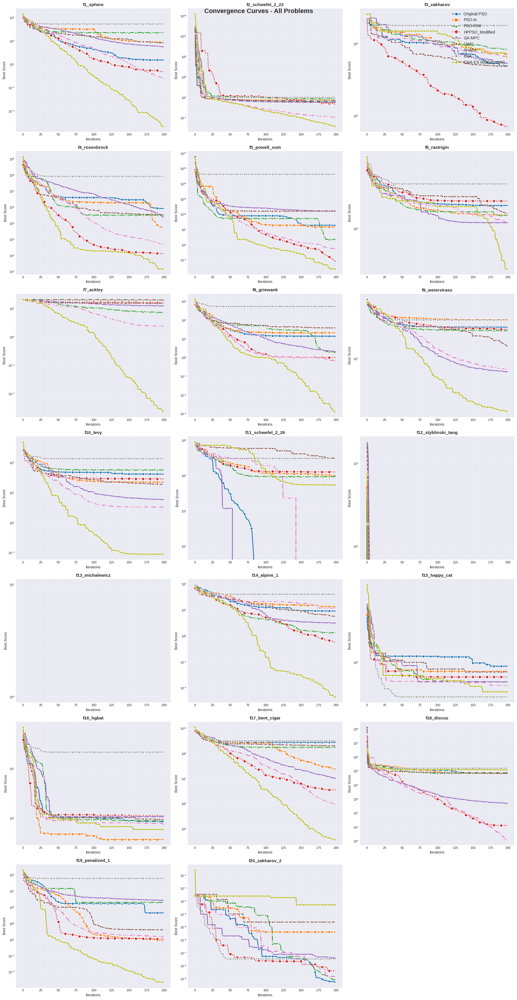

Saved combined convergence plot to convergence_plots/all_problems_convergence.png


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from typing import Dict, List, Tuple
import pandas as pd
import matplotlib.cm as cm
from matplotlib.lines import Line2D

# Set style for better looking plots
plt.style.use('seaborn-v0_8-darkgrid')

# Define distinct color palettes for better differentiation
COLOR_PALETTE = [
    '#1f77b4',  # Blue
    '#ff7f0e',  # Orange
    '#2ca02c',  # Green
    '#d62728',  # Red
    '#9467bd',  # Purple
    '#8c564b',  # Brown
    '#e377c2',  # Pink
    '#7f7f7f',  # Gray
    '#bcbd22',  # Olive
    '#17becf',  # Cyan
    '#f14c38',  # Vermilion
    '#4c72b0',  # Navy
    '#55a868',  # Teal
    '#c44e52',  # Rust
    '#8172b2',  # Lavender
    '#937860',  # Tan
    '#da8bc3',  # Magenta
    '#8c8c8c',  # Dark Gray
]

# Define distinct marker styles
MARKER_STYLES = [
    'o',    # circle
    's',    # square
    '^',    # triangle up
    'D',    # diamond
    'v',    # triangle down
    'p',    # pentagon
    '*',    # star
    'X',    # x-mark
    'h',    # hexagon
    '<',    # triangle left
    '>',    # triangle right
    'd',    # thin diamond
    'P',    # plus (filled)
    'H',    # hexagon2
    '8',    # octagon
]

# Define line styles for additional variety
LINE_STYLES = ['-', '--', '-.', ':']

def plot_median_convergence_curves(benchmark_results: Dict,
                                   save_dir: str = "convergence_plots",
                                   figsize: Tuple[int, int] = (14, 9),
                                   show_std: bool = True,
                                   log_scale_y: bool = True):
    """
    Plot median convergence curves for all algorithms on each problem
    with distinct colors and markers.
    """

    # Create save directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Get all problem names from the results
    first_algo = list(benchmark_results.keys())[0]
    problem_names = list(benchmark_results[first_algo].keys())

    # Create a separate plot for each problem
    for problem_idx, problem_name in enumerate(problem_names):
        plt.figure(figsize=figsize)

        # Dictionary to store convergence data for each algorithm
        algo_data = {}

        # Assign distinct colors and markers to each algorithm
        algos_list = list(benchmark_results.keys())
        color_map = {algo: COLOR_PALETTE[i % len(COLOR_PALETTE)] for i, algo in enumerate(algos_list)}
        marker_map = {algo: MARKER_STYLES[i % len(MARKER_STYLES)] for i, algo in enumerate(algos_list)}
        line_map = {algo: LINE_STYLES[i % len(LINE_STYLES)] for i, algo in enumerate(algos_list)}

        for algo_name, algo_results in benchmark_results.items():
            if problem_name in algo_results:
                histories = []

                # Try to get per-run histories first
                if 'all_histories' in algo_results[problem_name]:
                    histories = [h for h in algo_results[problem_name]['all_histories'] if len(h) > 0]
                elif 'avg_history' in algo_results[problem_name]:
                    history = np.array(algo_results[problem_name]['avg_history'])
                    histories = [history]

                if histories:
                    # Calculate median and percentiles across runs
                    # Pad histories to same length
                    max_len = max(len(h) for h in histories)
                    padded_histories = []
                    for h in histories:
                        if len(h) < max_len:
                            # Pad with last value
                            pad_width = max_len - len(h)
                            padded = np.pad(h, (0, pad_width), 'edge')
                        else:
                            padded = h
                        padded_histories.append(padded)

                    history_matrix = np.array(padded_histories)
                    median_curve = np.median(history_matrix, axis=0)
                    lower_curve = np.percentile(history_matrix, 25, axis=0)
                    upper_curve = np.percentile(history_matrix, 75, axis=0)
                    std_curve = np.std(history_matrix, axis=0)

                    algo_data[algo_name] = {
                        'median': median_curve,
                        'lower': lower_curve,
                        'upper': upper_curve,
                        'std': std_curve,
                        'iterations': range(len(median_curve)),
                        'color': color_map[algo_name],
                        'marker': marker_map[algo_name],
                        'line': line_map[algo_name]
                    }

        # Plot the convergence curves
        lines = []
        labels = []

        for algo_name, data in algo_data.items():
            iterations = data['iterations']
            median_curve = data['median']

            # Determine marker frequency (show markers at ~10 points total)
            marker_freq = max(1, len(iterations) // 15)
            marker_indices = list(range(0, len(iterations), marker_freq))

            # Main median line with distinct color, marker, and line style
            line, = plt.plot(iterations, median_curve,
                           label=algo_name,
                           color=data['color'],
                           linestyle=data['line'],
                           linewidth=2.5,
                           marker=data['marker'],
                           markevery=marker_indices,
                           markersize=8,
                           markerfacecolor=data['color'],
                           markeredgecolor='white',
                           markeredgewidth=1.5)

            lines.append(line)
            labels.append(algo_name)

            # Add shaded region for std or percentiles
            if show_std:
                plt.fill_between(iterations,
                                median_curve - data['std'],
                                median_curve + data['std'],
                                alpha=0.15,
                                color=data['color'])
            else:
                plt.fill_between(iterations,
                                data['lower'],
                                data['upper'],
                                alpha=0.15,
                                color=data['color'])

        # Customize the plot
        plt.xlabel('Iterations', fontsize=13, fontweight='bold')
        plt.ylabel('Best Score (fitness)', fontsize=13, fontweight='bold')

        if log_scale_y:
            plt.yscale('log')
            plt.ylabel('Best Score (fitness) - Log Scale', fontsize=13, fontweight='bold')

        plt.title(f'Convergence Curves - {problem_name}',
                 fontsize=15, fontweight='bold')

        # Create custom legend with both color and marker info
        legend_elements = []
        for algo_name, data in algo_data.items():
            legend_elements.append(Line2D([0], [0],
                                        color=data['color'],
                                        marker=data['marker'],
                                        linestyle=data['line'],
                                        linewidth=2.5,
                                        markersize=8,
                                        markerfacecolor=data['color'],
                                        markeredgecolor='white',
                                        markeredgewidth=1.5,
                                        label=algo_name))

        plt.legend(handles=legend_elements,
                  loc='upper right',
                  fontsize=10,
                  framealpha=0.95,
                  fancybox=True,
                  shadow=True)

        plt.grid(True, alpha=0.3, linestyle='--')

        # Add performance annotation
        if algo_data:
            best_final = min([np.min(data['median'][-10:]) for data in algo_data.values()])
            worst_final = max([np.min(data['median'][-10:]) for data in algo_data.values()])
            best_algo = [name for name, data in algo_data.items()
                        if np.min(data['median'][-10:]) == best_final][0]

            plt.text(0.02, 0.98,
                    f'Best Algorithm: {best_algo}\nBest final value: {best_final:.2e}\nWorst final value: {worst_final:.2e}',
                    transform=plt.gca().transAxes,
                    fontsize=9,
                    verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

        plt.tight_layout()

        # Save the plot
        safe_problem_name = problem_name.replace(' ', '_').replace('(', '').replace(')', '').replace(',', '')
        plt.savefig(os.path.join(save_dir, f'convergence_{safe_problem_name}.png'),
                   dpi=300, bbox_inches='tight')
        plt.show()

        print(f"Saved convergence plot for {problem_name}")

def create_summary_table(benchmark_results: Dict) -> pd.DataFrame:
    """
    Create a summary table of final results for all algorithms and problems.
    """
    summary_data = []

    for algo_name, algo_results in benchmark_results.items():
        for problem_name, results in algo_results.items():
            if 'avg_final_score' in results:
                summary_data.append({
                    'Algorithm': algo_name,
                    'Problem': problem_name,
                    'Avg Final Score': results['avg_final_score'],
                    'Std Dev': np.std(results.get('all_final_scores', [np.nan])),
                    'Best Run': np.min(results.get('all_final_scores', [np.nan])),
                    'Worst Run': np.max(results.get('all_final_scores', [np.nan]))
                })

    df = pd.DataFrame(summary_data)

    # Pivot table for better visualization
    pivot_table = df.pivot(index='Algorithm', columns='Problem', values='Avg Final Score')

    return pivot_table

def plot_comparison_heatmap(benchmark_results: Dict, save_dir: str = "convergence_plots"):
    """
    Create a heatmap comparing algorithm performance across all problems.
    """
    os.makedirs(save_dir, exist_ok=True)

    # Create summary table
    summary_table = create_summary_table(benchmark_results)

    # Create heatmap with improved aesthetics
    plt.figure(figsize=(14, 10))

    # Use log transform for better visualization if values span multiple orders
    data_for_heatmap = np.log1p(summary_table)

    # Create custom colormap (green for better, red for worse)
    from matplotlib.colors import LinearSegmentedColormap
    colors = ['darkred', 'red', 'orange', 'yellow', 'lightgreen', 'green', 'darkgreen']
    cmap_custom = LinearSegmentedColormap.from_list('custom', colors, N=256)

    # Create heatmap
    im = sns.heatmap(data_for_heatmap,
                     annot=True,
                     fmt='.2f',
                     cmap='RdYlGn_r',  # Red-Yellow-Green (reversed so green=good)
                     cbar_kws={'label': 'Log(Avg Final Score)\n(Lower = Better)',
                              'shrink': 0.8},
                     linewidths=0.5,
                     linecolor='white',
                     square=True,
                     annot_kws={'size': 10, 'weight': 'bold'})

    plt.title('Algorithm Performance Comparison Heatmap\n(Darker Green = Better Performance)',
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Problem', fontsize=12, fontweight='bold')
    plt.ylabel('Algorithm', fontsize=12, fontweight='bold')
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)

    # Add colorbar label
    cbar = im.collections[0].colorbar
    cbar.set_label('Log(Avg Final Score) - Lower is Better', fontsize=11, fontweight='bold')

    plt.tight_layout()

    # Save heatmap
    plt.savefig(os.path.join(save_dir, 'performance_heatmap.png'),
                dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Saved performance heatmap to {save_dir}/performance_heatmap.png")

    return summary_table

def plot_ranking_barplot(benchmark_results: Dict, save_dir: str = "convergence_plots"):
    """
    Create a bar plot showing algorithm rankings based on average performance.
    """
    os.makedirs(save_dir, exist_ok=True)

    # Create summary table
    summary_table = create_summary_table(benchmark_results)

    # Calculate average rank across all problems
    ranks = summary_table.rank(axis=0, ascending=True)
    avg_ranks = ranks.mean(axis=1).sort_values()
    std_ranks = ranks.std(axis=1).loc[avg_ranks.index]

    # Create bar plot with distinct colors
    plt.figure(figsize=(12, 7))

    # Create color gradient based on rank (better rank = greener)
    colors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(avg_ranks)))

    bars = plt.barh(range(len(avg_ranks)), avg_ranks.values,
                    xerr=std_ranks.values,
                    color=colors,
                    edgecolor='black',
                    linewidth=1.5,
                    capsize=5,
                    error_kw={'elinewidth': 2, 'markeredgewidth': 2})

    plt.yticks(range(len(avg_ranks)), avg_ranks.index, fontsize=11)
    plt.xlabel('Average Rank (lower is better)', fontsize=12, fontweight='bold')
    plt.title('Algorithm Ranking Across All Problems\n(with Standard Deviation)',
              fontsize=14, fontweight='bold')
    plt.grid(True, axis='x', alpha=0.3, linestyle='--')

    # Add value labels
    for i, (bar, value, std) in enumerate(zip(bars, avg_ranks.values, std_ranks.values)):
        plt.text(value + std + 0.1, bar.get_y() + bar.get_height()/2,
                f'{value:.2f} ± {std:.2f}',
                va='center',
                fontsize=10,
                fontweight='bold')

    # Add vertical line at perfect rank (1.0)
    plt.axvline(x=1.0, color='red', linestyle='--', alpha=0.5, label='Perfect Rank (1.0)')
    plt.legend(loc='lower right', fontsize=10)

    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'algorithm_ranking.png'), dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Saved ranking plot to {save_dir}/algorithm_ranking.png")

def plot_all_problems_together(benchmark_results: Dict, save_dir: str = "convergence_plots"):
    """
    Create a single figure with subplots for all problems for easy comparison.
    """
    os.makedirs(save_dir, exist_ok=True)

    # Get all problem names
    first_algo = list(benchmark_results.keys())[0]
    problem_names = list(benchmark_results[first_algo].keys())

    # Calculate number of subplots needed
    n_problems = len(problem_names)
    n_cols = min(3, n_problems)
    n_rows = (n_problems + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
    if n_problems == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Assign distinct colors and markers to each algorithm
    algos_list = list(benchmark_results.keys())
    color_map = {algo: COLOR_PALETTE[i % len(COLOR_PALETTE)] for i, algo in enumerate(algos_list)}
    marker_map = {algo: MARKER_STYLES[i % len(MARKER_STYLES)] for i, algo in enumerate(algos_list)}
    line_map = {algo: LINE_STYLES[i % len(LINE_STYLES)] for i, algo in enumerate(algos_list)}

    for idx, problem_name in enumerate(problem_names):
        ax = axes[idx]

        for algo_name, algo_results in benchmark_results.items():
            if problem_name in algo_results:
                # Get history data
                if 'all_histories' in algo_results[problem_name]:
                    histories = [h for h in algo_results[problem_name]['all_histories'] if len(h) > 0]
                elif 'avg_history' in algo_results[problem_name]:
                    histories = [np.array(algo_results[problem_name]['avg_history'])]
                else:
                    continue

                if histories:
                    # Calculate median curve
                    max_len = max(len(h) for h in histories)
                    padded_histories = []
                    for h in histories:
                        if len(h) < max_len:
                            padded = np.pad(h, (0, max_len - len(h)), 'edge')
                        else:
                            padded = h
                        padded_histories.append(padded)

                    history_matrix = np.array(padded_histories)
                    median_curve = np.median(history_matrix, axis=0)
                    iterations = range(len(median_curve))

                    # Plot median line
                    marker_freq = max(1, len(iterations) // 20)
                    marker_indices = list(range(0, len(iterations), marker_freq))

                    ax.plot(iterations, median_curve,
                           label=algo_name,
                           color=color_map[algo_name],
                           linestyle=line_map[algo_name],
                           linewidth=2,
                           marker=marker_map[algo_name],
                           markevery=marker_indices,
                           markersize=6,
                           markerfacecolor=color_map[algo_name],
                           markeredgecolor='white',
                           markeredgewidth=1)

                    # Add confidence interval
                    ax.fill_between(iterations,
                                   np.percentile(history_matrix, 25, axis=0),
                                   np.percentile(history_matrix, 75, axis=0),
                                   alpha=0.15,
                                   color=color_map[algo_name])

        ax.set_title(problem_name, fontsize=11, fontweight='bold')
        ax.set_xlabel('Iterations', fontsize=9)
        ax.set_ylabel('Best Score', fontsize=9)
        ax.set_yscale('log')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.tick_params(labelsize=8)

    # Remove empty subplots if any
    for idx in range(len(problem_names), len(axes)):
        fig.delaxes(axes[idx])

    # Create single legend for the entire figure
    legend_elements = []
    for algo_name in algos_list:
        legend_elements.append(Line2D([0], [0],
                                    color=color_map[algo_name],
                                    marker=marker_map[algo_name],
                                    linestyle=line_map[algo_name],
                                    linewidth=2,
                                    markersize=8,
                                    markerfacecolor=color_map[algo_name],
                                    markeredgecolor='white',
                                    markeredgewidth=1.5,
                                    label=algo_name))

    fig.legend(handles=legend_elements,
              loc='upper right',
              bbox_to_anchor=(0.98, 0.98),
              fontsize=10,
              framealpha=0.95,
              fancybox=True,
              shadow=True)

    plt.suptitle('Convergence Curves - All Problems', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, 'all_problems_convergence.png'), dpi=300, bbox_inches='tight')
    plt.show()

    print(f"Saved combined convergence plot to {save_dir}/all_problems_convergence.png")

# Example usage:
# After running your benchmark, call these functions:

# 1. Individual convergence plots for each problem
# plot_median_convergence_curves(all_math_benchmark_results, save_dir="convergence_plots")

# 2. Create and display summary table
# summary_table = create_summary_table(all_math_benchmark_results)
# print("\nPerformance Summary Table:")
# print(summary_table)

# 3. Create heatmap comparison
# summary_table = plot_comparison_heatmap(all_math_benchmark_results)

# 4. Create ranking barplot
# plot_ranking_barplot(all_math_benchmark_results)

# 5. Plot all problems together in one figure
plot_all_problems_together(all_math_benchmark_results)

# Optional: Save summary table to CSV
# summary_table.to_csv("benchmark_summary.csv")
# print("\nSummary table saved to 'benchmark_summary.csv'")

### Save Mathematical Benchmark Results

Save the results from the mathematical functions benchmark to a JSON file.

In [ ]:
import json

output_filename_math = "benchmark_math_results.json"
with open(output_filename_math, 'w') as f:
    json.dump(all_math_benchmark_results, f, indent=4)
print(f"Mathematical benchmark results saved to {output_filename_math}")

Mathematical benchmark results saved to benchmark_math_results.json
